#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2Reader
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [65]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params_2048":{
        "linear_filters":[1024,1024,1024,2048],
        "input_feat":102,
        "dropout":0.1,
    },
    "model_params_400":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":102,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
dataReader = PAMAP2Reader('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.array(data)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [4]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params_2048"]["linear_filters"],
    input_feat=config["model_params_2048"]["input_feat"],
    dropout=config["model_params_2048"]["dropout"]
)

In [7]:
emb = model(torch.randn((32,102)))
emb.size()

torch.Size([32, 2048])

In [8]:
emb

tensor([[0.0000, 0.0000, 0.3548,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.3512,  ..., 0.1674, 1.1028, 2.1186],
        [1.6359, 0.0000, 0.7480,  ..., 0.4692, 0.0000, 0.0000],
        ...,
        [0.7984, 0.9783, 0.0000,  ..., 1.3701, 0.1522, 0.0048],
        [1.1031, 0.0000, 0.0000,  ..., 0.0000, 0.7602, 0.4061],
        [0.0000, 0.0000, 1.7090,  ..., 1.5349, 0.0000, 0.3606]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [14]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_2048.npz')
video_classes_2048, video_feat_2048 = video_data['activity'], video_data['features']
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_400.npz')
video_classes_400, video_feat_400 = video_data['activity'], video_data['features']

In [15]:
video_feat_2048.shape

(180, 2048)

In [16]:
np.unique(video_classes_2048, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [17]:
vid_cls_name = np.unique(video_classes_2048)

In [18]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [19]:
selecting_video_prototypes(video_feat_2048,video_classes_2048,vid_cls_name).shape

torch.Size([18, 2048])

In [20]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [21]:
np.unique(video_classes_2048)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [22]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes_2048):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [23]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [24]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [25]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 102), (16752,))

In [26]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [27]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [37]:
from numpy import random
import numpy as np
import torch
from torch.utils.data import Dataset


class PAMAP2Dataset(Dataset):
    def __init__(self, data, actions, attributes_2048, attributes_400, attribute_dict, action_classes, seq_len=120):
        super(PAMAP2Dataset, self).__init__()
        self.data = torch.from_numpy(data)
        self.actions = actions
        self.attribute_dict = attribute_dict
        self.seq_len = seq_len
        self.attributes_2048 = torch.from_numpy(attributes_2048)
        self.attributes_400 = torch.from_numpy(attributes_400)
        self.action_classes = action_classes
        # build action to id mapping dict
        self.n_action = len(self.actions)
        self.action2Id = dict(zip(action_classes, range(self.n_action)))

    def __getitem__(self, ind):
        x = self.data[ind, ...]
        target = self.actions[ind]
        y = torch.from_numpy(np.array([self.action2Id[target]]))
        # extraction semantic space generation skeleton sequences
        vid_idx = random.choice(self.attribute_dict[target])
        y_feat = self.attributes_2048[vid_idx, ...]
        return x, y, y_feat

    def __len__(self):
        return self.data.shape[0]

    def getClassAttrs(self):
        sampling_idx = [random.choice(self.attribute_dict[i]) for i in self.action_classes]
        ft_mat = self.attributes_2048[sampling_idx, ...]
        return ft_mat

    def getClassFeatures(self):
        cls_feat_2048 = []
        cls_feat_400 = []
        for cls in self.action_classes:
            idx = self.attribute_dict[cls]
            cls_feat_2048.append(torch.mean(self.attributes_2048[idx, ...], dim=0))
            cls_feat_400.append(torch.mean(self.attributes_400[idx, ...], dim=0))

        cls_feat_2048 = torch.vstack(cls_feat_2048)
        cls_feat_400 = torch.vstack(cls_feat_400)
        return cls_feat_2048, cls_feat_400


In [38]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [39]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [40]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [47]:
r,r1 = sample_dt.getClassFeatures()
r.shape,r1.shape

(torch.Size([14, 2048]), torch.Size([14, 400]))

In [93]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

def predict_class_combine(
        y_pred_2048:torch.Tensor,
        y_pred_400:torch.Tensor,
        selected_features_2048,
        selected_features_400,
        alpha = 0.5
):

    num_classes_2048 = selected_features_2048.size()[0]
    num_classes_400 = selected_features_400.size()[0]

    cosine_sim_comb = []
    for entry in y_pred_2048.unbind():
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes_2048,1),selected_features_2048)
        cosine_sim_comb.append(cosine_sim)

    pred_2048 = torch.stack(cosine_sim_comb)

    cosine_sim_comb = []
    for entry in y_pred_400.unbind():
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes_400,1),selected_features_400)
        cosine_sim_comb.append(cosine_sim)

    pred_400 = torch.stack(cosine_sim_comb)
    distance = pred_2048*alpha +(1-alpha)*pred_400

    pred = []
    for dis in distance.unbind():
        arg_max = torch.argmax(F.softmax(dis,dim=-1),dim=-1)
        pred.append(arg_max)

    pred = torch.stack(pred)
    return pred

In [94]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [95]:
def eval_step(model_2048,model_400, dataloader,dataset, device, class_names,  phase='seen', print_report=True,alpha=0.5):

    model_2048 = model_2048.eval()
    model_400 = model_400.eval()

    random_selected_feat_2048,random_selected_feat_400 = dataset.getClassFeatures()
    random_selected_feat_400 = random_selected_feat_400.to(device)
    random_selected_feat_2048 = random_selected_feat_2048.to(device)

    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, _ = batch
            X = X.float().to(device)
            X = X.float().to(device)
            targets = targets.long().to(device)

            # forward
            out_2048 = model_2048(X)
            out_400 = model_400(X)

            class_output = predict_class_combine(out_2048,out_400,random_selected_feat_2048,random_selected_feat_400,alpha=alpha)

            # convert feature vector into action class
            # using cosine
            pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

In [85]:
model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_1.pt")["model_state_dict"]
model2048 = SOTAEmbedding(
        linear_filters=config["model_params_2048"]["linear_filters"],
        input_feat=config["model_params_2048"]["input_feat"],
        dropout=config["model_params_2048"]["dropout"]
    ).load_state_dict(model_2048_w)

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


seen: 100%|██████████| 65/65 [00:04<00:00, 15.75batch/s]


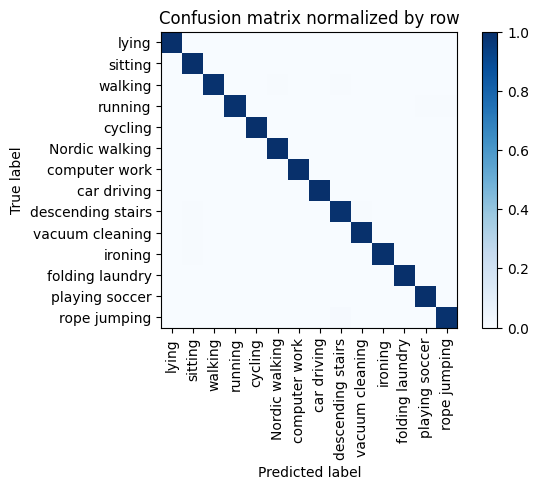

Overall accuracy: 0.996

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.147        613|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       1.000      0.992      0.996      0.121        504|	 descending stairs: 0.004,	Nordic walking: 0.004,	
          ironing       1.000      0.996      0.998      0.108        449|	 sitting: 0.004,	rope jumping: 0.000,	
            lying       1.000      0.998      0.999      0.097        405|	 folding laundry: 0.002,	rope jumping: 0.000,	
  vacuum cleaning       0.995      0.995      0.995      0.087        364|	 sitting: 0.005,	rope jumping: 0.000,	
   Nordic walking       0.995      0.997      0.996      0.087        363|	 rope jumping: 0.003,	playing soccer: 0.000,	
          sitting       0.984      0.997      0.991      0.076        315|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          cycling       1.000      0.997  

unseen: 100%|██████████| 87/87 [00:05<00:00, 15.70batch/s]


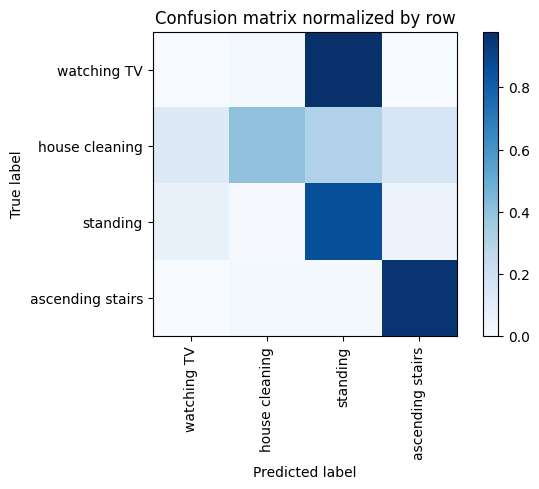

Overall accuracy: 0.604

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.532      0.862      0.658      0.331       1843|	 watching TV: 0.073,	ascending stairs: 0.056,	
  house cleaning       0.932      0.405      0.564      0.328       1829|	 standing: 0.313,	ascending stairs: 0.156,	
ascending stairs       0.725      0.963      0.827      0.193       1073|	 standing: 0.019,	house cleaning: 0.019,	
     watching TV       0.000      0.000      0.000      0.148        823|	 standing: 0.978,	house cleaning: 0.021,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.622      0.604      0.562        1.0       5568|	      

{'accuracy': 0.6036278735632183, 'precision': 0.5473066025138227, 'recall': 0.5572381620719871, 'f1': 0.5123313490297382}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumpi

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16]
unseen classes >  [3, 17, 1, 11]
Initiate IMU datasets ...


seen: 100%|██████████| 65/65 [00:04<00:00, 15.80batch/s]


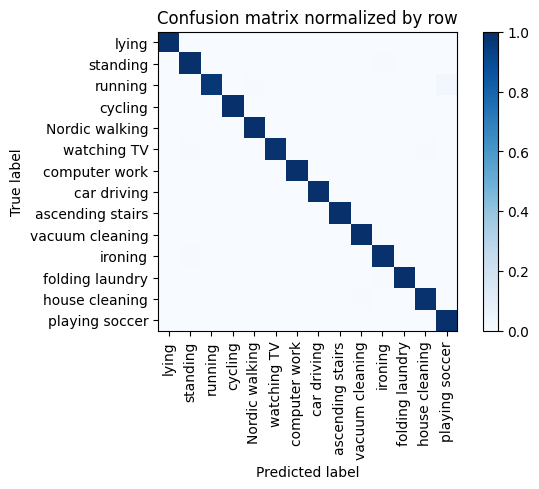

Overall accuracy: 0.995

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      1.000      1.000      0.150        626|	 playing soccer: 0.000,	house cleaning: 0.000,	
         ironing       0.994      0.992      0.993      0.116        484|	 standing: 0.006,	vacuum cleaning: 0.002,	
        standing       0.987      0.995      0.991      0.090        374|	 ironing: 0.005,	playing soccer: 0.000,	
           lying       1.000      1.000      1.000      0.088        365|	 playing soccer: 0.000,	house cleaning: 0.000,	
  house cleaning       0.997      0.992      0.994      0.087        363|	 vacuum cleaning: 0.006,	folding laundry: 0.003,	
 vacuum cleaning       0.992      0.997      0.994      0.085        353|	 standing: 0.003,	playing soccer: 0.000,	
  Nordic walking       0.997      1.000      0.999      0.085        352|	 playing soccer: 0.000,	house cleaning: 0.000,	
         cycling       1.000      1.000      

unseen: 100%|██████████| 86/86 [00:05<00:00, 14.48batch/s]


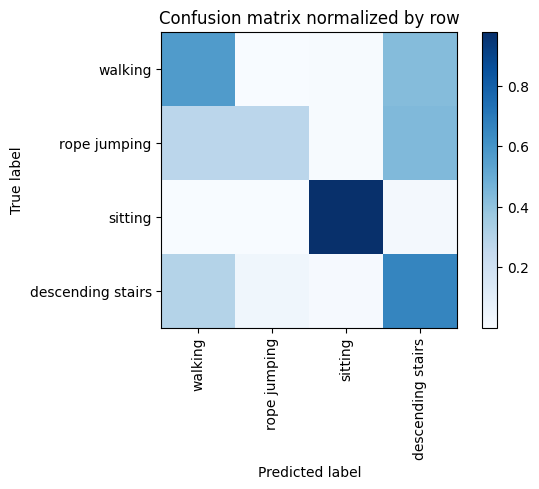

Overall accuracy: 0.692

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.761      0.569      0.651      0.420       2313|	 descending stairs: 0.427,	sitting: 0.004,	
          sitting       0.988      0.978      0.983      0.325       1787|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.335      0.655      0.443      0.171        943|	 walking: 0.299,	rope jumping: 0.037,	
     rope jumping       0.776      0.278      0.409      0.084        461|	 descending stairs: 0.438,	walking: 0.278,	

----------------------------------------------------------------------------------------------------
      avg / total       0.763      0.692      0.703        1.0       5504|	      

{'accuracy': 0.6918604651162791, 'precision': 0.7151141904367915, 'recall': 0.6197885891449719, 'f1': 0.6215661189814581}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum cleaning',

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17]
unseen classes >  [16, 0, 12, 8]
Initiate IMU datasets ...


seen: 100%|██████████| 60/60 [00:04<00:00, 14.06batch/s]


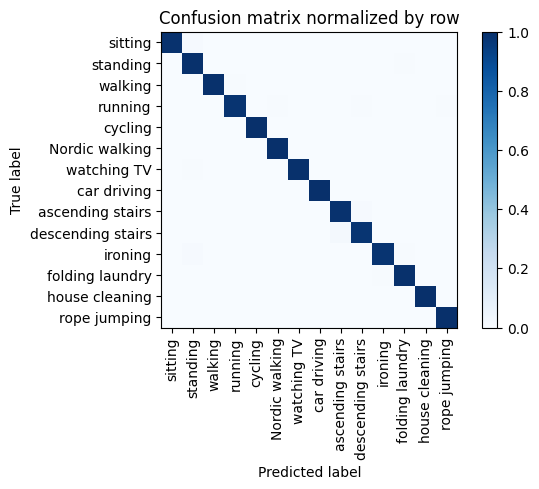

Overall accuracy: 0.993

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.996      0.998      0.117        451|	 running: 0.004,	rope jumping: 0.000,	
          ironing       0.998      0.984      0.991      0.114        439|	 standing: 0.011,	folding laundry: 0.005,	
         standing       0.974      0.992      0.983      0.100        384|	 folding laundry: 0.005,	sitting: 0.003,	
   house cleaning       1.000      0.997      0.999      0.099        380|	 folding laundry: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.997      1.000      0.999      0.097        372|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.997      0.989      0.993      0.097        372|	 standing: 0.011,	rope jumping: 0.000,	
          cycling       1.000      1.000      1.000      0.088        339|	 rope jumping: 0.000,	house cleaning: 0.000,	
  folding laundry       0.974      0.995      0.984   

unseen: 100%|██████████| 111/111 [00:07<00:00, 14.96batch/s]


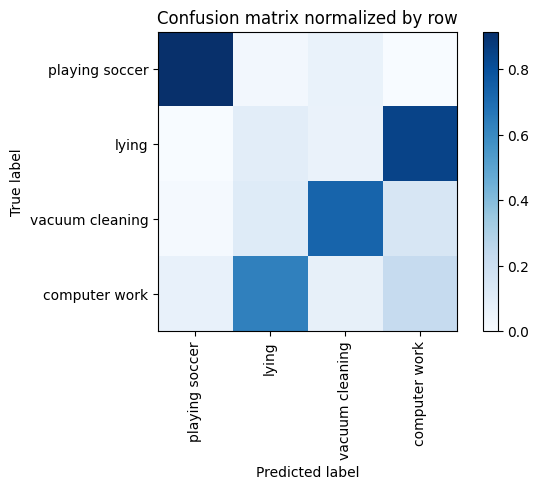

Overall accuracy: 0.356

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.273      0.225      0.247      0.432       3066|	 lying: 0.632,	vacuum cleaning: 0.074,	
          lying       0.076      0.094      0.084      0.264       1875|	 computer work: 0.844,	vacuum cleaning: 0.059,	
vacuum cleaning       0.773      0.729      0.750      0.240       1705|	 computer work: 0.149,	lying: 0.111,	
 playing soccer       0.640      0.915      0.753      0.064        458|	 vacuum cleaning: 0.061,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.365      0.356      0.357        1.0       7104|	      

{'accuracy': 0.3559966216216216, 'precision': 0.440440652155112, 'recall': 0.4907802919606751, 'f1': 0.4585537898099387}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per class count :  {'ly

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
unseen classes >  [5, 4, 6]
Initiate IMU datasets ...


seen: 100%|██████████| 69/69 [00:04<00:00, 15.11batch/s]


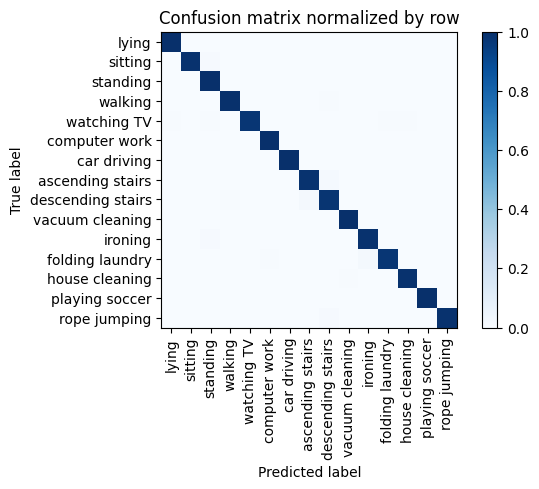

Overall accuracy: 0.992

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      1.000      0.999      0.139        616|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.998      0.994      0.996      0.107        472|	 descending stairs: 0.004,	playing soccer: 0.002,	
          ironing       0.989      0.989      0.989      0.102        452|	 standing: 0.011,	rope jumping: 0.000,	
   house cleaning       0.997      0.990      0.994      0.090        397|	 vacuum cleaning: 0.005,	folding laundry: 0.003,	
         standing       0.974      0.997      0.986      0.086        381|	 ironing: 0.003,	rope jumping: 0.000,	
            lying       0.997      1.000      0.999      0.086        381|	 rope jumping: 0.000,	playing soccer: 0.000,	
          sitting       1.000      0.989      0.994      0.079        350|	 standing: 0.011,	rope jumping: 0.000,	
  vacuum cleaning       0.994      1.000     

unseen: 100%|██████████| 68/68 [00:04<00:00, 15.38batch/s]


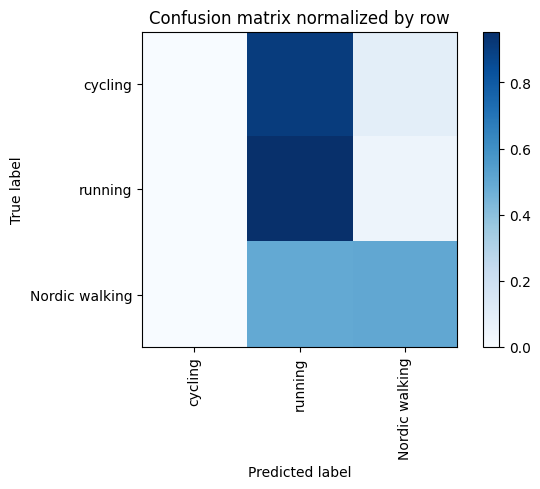

Overall accuracy: 0.418

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.826      0.504      0.626      0.420       1827|	 running: 0.496,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1585|	 running: 0.905,	Nordic walking: 0.095,	
       running       0.277      0.953      0.429      0.216        940|	 Nordic walking: 0.047,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.407      0.418      0.356        1.0       4352|	      

{'accuracy': 0.41750919117647056, 'precision': 0.3676028247750113, 'recall': 0.48576552655789634, 'f1': 0.35170691030228723}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 15, 16, 17]
unseen classes >  [13, 9, 14]
Initiate IMU datasets ...


seen: 100%|██████████| 70/70 [00:04<00:00, 15.60batch/s]


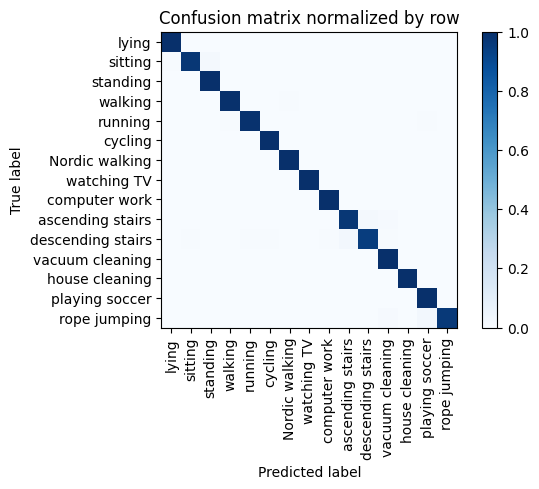

Overall accuracy: 0.992

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      1.000      0.999      0.141        632|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.998      0.995      0.996      0.095        424|	 Nordic walking: 0.005,	rope jumping: 0.000,	
   house cleaning       1.000      0.997      0.999      0.086        384|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
            lying       0.995      0.997      0.996      0.085        379|	 standing: 0.003,	rope jumping: 0.000,	
          sitting       0.994      0.970      0.982      0.082        366|	 standing: 0.022,	lying: 0.005,	
   Nordic walking       0.994      1.000      0.997      0.080        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.983      1.000      0.991      0.078        349|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.973      0.997      0.985  

unseen: 100%|██████████| 60/60 [00:04<00:00, 14.90batch/s]


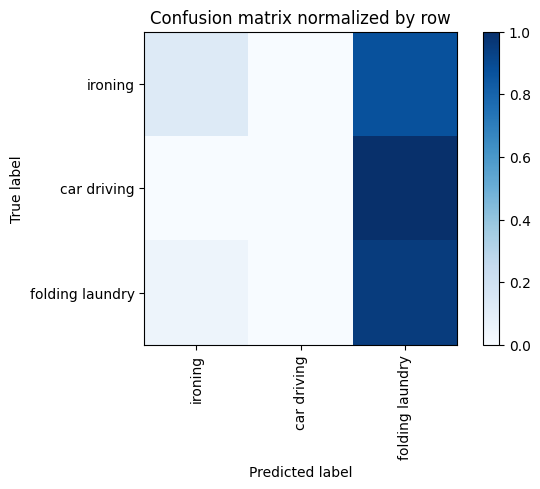

Overall accuracy: 0.318

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.865      0.127      0.221      0.608       2333|	 folding laundry: 0.873,	car driving: 0.000,	
folding laundry       0.265      0.953      0.414      0.253        971|	 ironing: 0.047,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.593      0.318      0.239        1.0       3840|	      

{'accuracy': 0.31796875, 'precision': 0.37666983841900686, 'recall': 0.3598338088315986, 'f1': 0.2117879723447039}
============== Overall Unseen Classes Performance ==============


accuracy     0.477393
precision    0.489427
recall       0.502681
f1           0.431189
dtype: float64

In [87]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_{i}.pt")["model_state_dict"]
    model2048 = SOTAEmbedding(
        linear_filters=config["model_params_2048"]["linear_filters"],
        input_feat=config["model_params_2048"]["input_feat"],
        dropout=config["model_params_2048"]["dropout"]
    )
    model2048.load_state_dict(model_2048_w)

    model_400_w = torch.load(f"model_saves/SORTModel_logits/fold_{i}.pt")["model_state_dict"]
    model400 = SOTAEmbedding(
        linear_filters=config["model_params_400"]["linear_filters"],
        input_feat=config["model_params_400"]["input_feat"],
        dropout=config["model_params_400"]["dropout"]
    )
    model400.load_state_dict(model_400_w)

    model2048.to(device)
    model400.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(), 'feature': nn.MSELoss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    eval_metrics = eval_step(model2048, model400, eval_dl, eval_dt, device,class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True)

    # run evaluation on unseen classes
    test_metrics = eval_step(model2048, model400, test_dl,test_dt, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen')
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()


In [96]:
def run_5fold(alpha):
    fold_metric_scores = []
    for i, cs in enumerate(fold_cls_ids):
        #print("="*16, f'Fold-{i}', "="*16)
        #print(f'Unseen Classes : {fold_classes[i]}')

        data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
        all_classes = dataReader.idToLabel
        seen_classes = data_dict['seen_classes']
        unseen_classes = data_dict['unseen_classes']
        #print("seen classes > ", seen_classes)
        #print("unseen classes > ", unseen_classes)
        train_n, in_ft = data_dict['train']['X'].shape

        #print("Initiate IMU datasets ...")
        # build IMU datasets
        train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
        train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
        # build seen eval_dt
        eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
        eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
        # build unseen test_dt
        test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
        test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)

        # build model
        model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_{i}.pt")["model_state_dict"]
        model2048 = SOTAEmbedding(
            linear_filters=config["model_params_2048"]["linear_filters"],
            input_feat=config["model_params_2048"]["input_feat"],
            dropout=config["model_params_2048"]["dropout"]
        )
        model2048.load_state_dict(model_2048_w)

        model_400_w = torch.load(f"model_saves/SORTModel_logits/fold_{i}.pt")["model_state_dict"]
        model400 = SOTAEmbedding(
            linear_filters=config["model_params_400"]["linear_filters"],
            input_feat=config["model_params_400"]["input_feat"],
            dropout=config["model_params_400"]["dropout"]
        )
        model400.load_state_dict(model_400_w)

        model2048.to(device)
        model400.to(device)
        # define run parameters
        optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
        loss_module = {'class': nn.CrossEntropyLoss(), 'feature': nn.MSELoss(reduction="sum")}
        best_acc = 0.0
        # train the model
        eval_metrics = eval_step(model2048, model400, eval_dl, eval_dt, device,class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=False,alpha=alpha)

        # run evaluation on unseen classes
        test_metrics = eval_step(model2048, model400, test_dl,test_dt, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen',alpha=alpha)
        fold_metric_scores.append(test_metrics)
        print(test_metrics)
        print("="*40)

    print("="*14, "Overall Unseen Classes Performance", "="*14)
    seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
    return seen_score_df.mean()


  0%|          | 0/19 [00:00<?, ?it/s]D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.58batch/s]


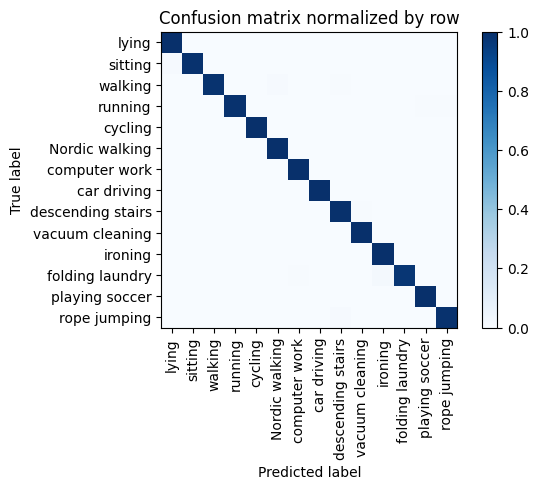

Overall accuracy: 0.994




unseen: 100%|██████████| 87/87 [00:05<00:00, 14.84batch/s]


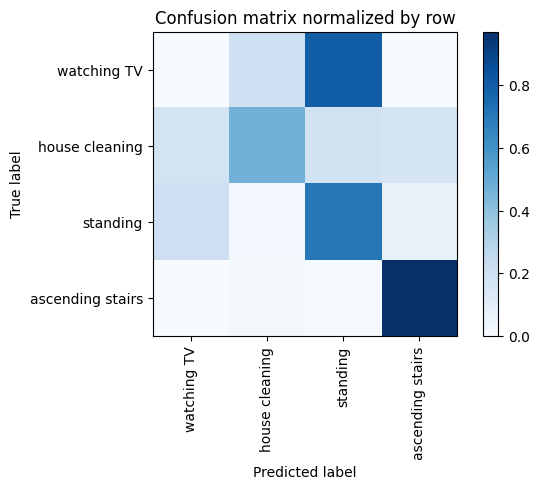

Overall accuracy: 0.573

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.561      0.703      0.624      0.331       1843|	 watching TV: 0.205,	ascending stairs: 0.069,	
  house cleaning       0.791      0.468      0.588      0.328       1824|	 standing: 0.189,	watching TV: 0.178,	
ascending stairs       0.706      0.968      0.817      0.193       1075|	 house cleaning: 0.018,	standing: 0.014,	
     watching TV       0.001      0.001      0.001      0.148        826|	 standing: 0.795,	house cleaning: 0.200,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.581      0.573      0.557        1.0       5568|	      

{'accuracy': 0.5730962643678161, 'precision': 0.5146911076485073, 'recall': 0.5351093894432115, 'f1': 0.5073983968485875}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 15.20batch/s]


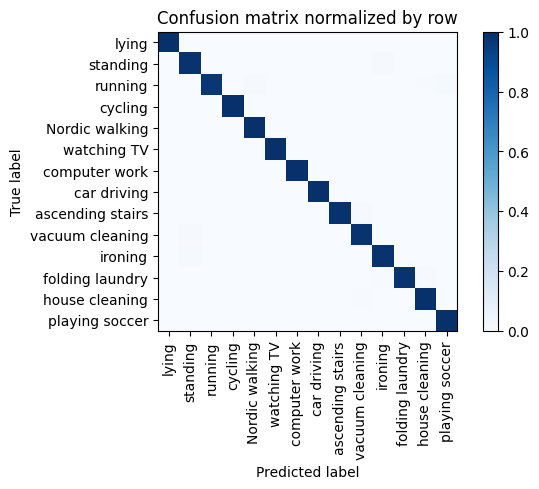

Overall accuracy: 0.993




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.97batch/s]


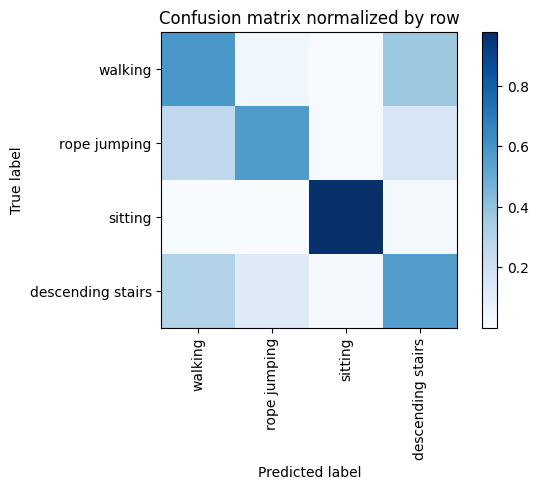

Overall accuracy: 0.708

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.767      0.587      0.665      0.420       2314|	 descending stairs: 0.370,	rope jumping: 0.038,	
          sitting       0.987      0.978      0.983      0.325       1789|	 descending stairs: 0.018,	rope jumping: 0.002,	
descending stairs       0.355      0.561      0.435      0.171        943|	 walking: 0.306,	rope jumping: 0.123,	
     rope jumping       0.557      0.572      0.565      0.083        458|	 walking: 0.264,	descending stairs: 0.157,	

----------------------------------------------------------------------------------------------------
      avg / total       0.751      0.708      0.720 0.9999999999999999       5504|	      

{'accuracy': 0.7083938953488372, 'precision': 0.6666253807512572, 'recall': 0.6745226747309354, 'f1': 0.6617397330518662}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:03<00:00, 15.10batch/s]


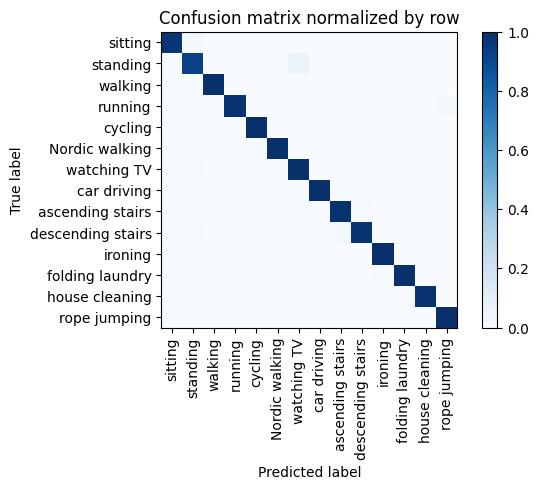

Overall accuracy: 0.986




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.09batch/s]


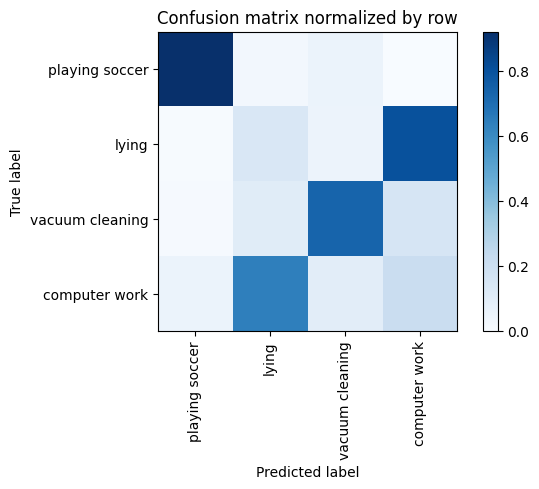

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.269      0.212      0.237      0.432       3067|	 lying: 0.639,	vacuum cleaning: 0.095,	
          lying       0.107      0.138      0.120      0.264       1875|	 computer work: 0.803,	vacuum cleaning: 0.053,	
vacuum cleaning       0.749      0.733      0.741      0.240       1705|	 computer work: 0.152,	lying: 0.106,	
 playing soccer       0.685      0.919      0.785      0.064        457|	 vacuum cleaning: 0.057,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.368      0.363      0.362        1.0       7104|	      

{'accuracy': 0.3627533783783784, 'precision': 0.4526255551604156, 'recall': 0.5003456157528295, 'f1': 0.47087324140616454}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 15.13batch/s]


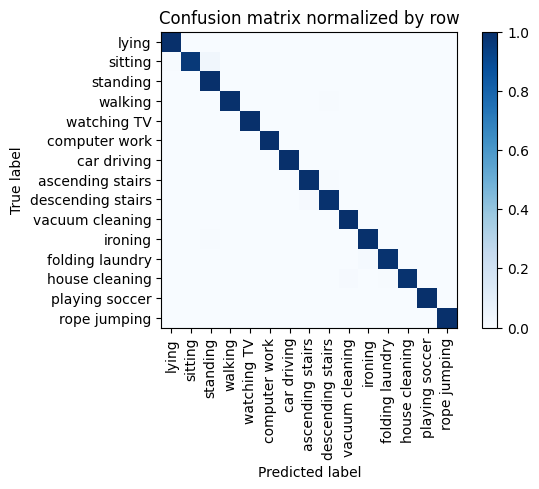

Overall accuracy: 0.993




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.85batch/s]


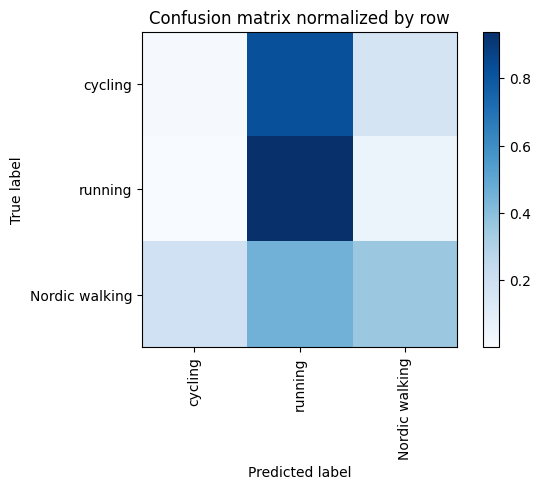

Overall accuracy: 0.356

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.673      0.358      0.467      0.419       1823|	 running: 0.452,	cycling: 0.190,	
       cycling       0.052      0.012      0.019      0.366       1592|	 running: 0.823,	Nordic walking: 0.165,	
       running       0.292      0.938      0.445      0.215        937|	 Nordic walking: 0.060,	cycling: 0.002,	

----------------------------------------------------------------------------------------------------
   avg / total       0.363      0.356      0.299        1.0       4352|	      

{'accuracy': 0.3563878676470588, 'precision': 0.3386375699159654, 'recall': 0.436078587167495, 'f1': 0.3105928349523699}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8,

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 15.00batch/s]


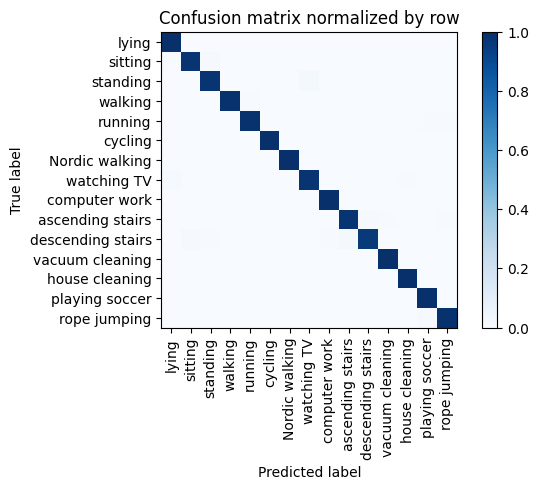

Overall accuracy: 0.992




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.83batch/s]


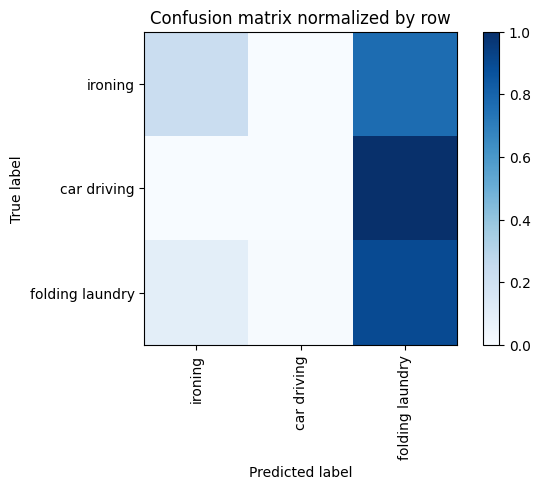

  5%|▌         | 1/19 [02:36<47:05, 156.95s/it]

Overall accuracy: 0.365

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.847      0.228      0.359      0.608       2333|	 folding laundry: 0.769,	car driving: 0.003,	
folding laundry       0.272      0.896      0.417      0.253        971|	 ironing: 0.099,	car driving: 0.005,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.583      0.365      0.324        1.0       3840|	      

{'accuracy': 0.3651041666666667, 'precision': 0.3729746078554273, 'recall': 0.374672032741473, 'f1': 0.25880140559563664}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car dr

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.92batch/s]


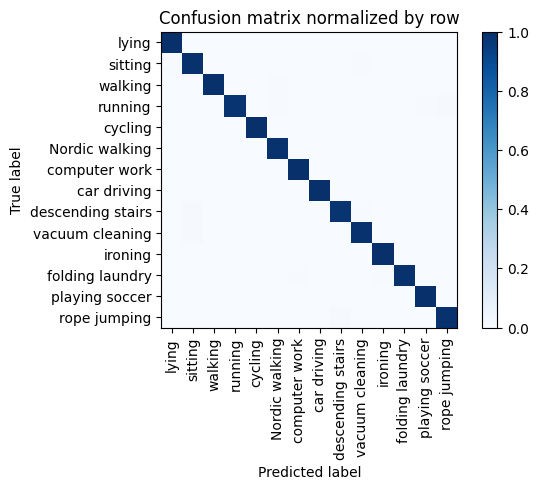

Overall accuracy: 0.994




unseen: 100%|██████████| 87/87 [00:05<00:00, 14.84batch/s]


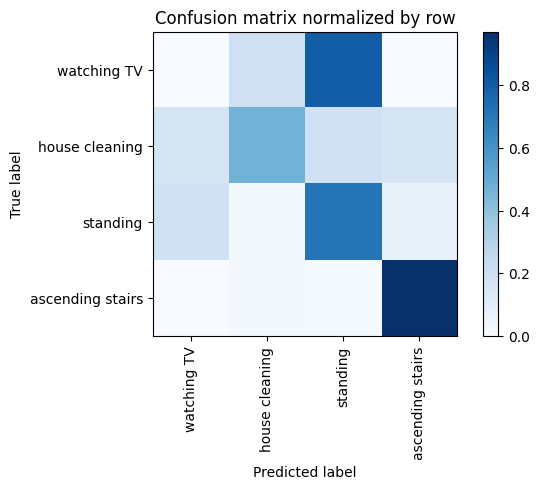

Overall accuracy: 0.575

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.561      0.715      0.628      0.330       1840|	 watching TV: 0.193,	ascending stairs: 0.070,	
  house cleaning       0.789      0.465      0.585      0.328       1827|	 standing: 0.195,	watching TV: 0.172,	
ascending stairs       0.704      0.968      0.816      0.193       1073|	 house cleaning: 0.018,	standing: 0.014,	
     watching TV       0.000      0.000      0.000      0.149        828|	 standing: 0.795,	house cleaning: 0.202,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.580      0.575      0.557        1.0       5568|	      

{'accuracy': 0.5754310344827587, 'precision': 0.5136009277601821, 'recall': 0.5370576556155642, 'f1': 0.5073439841977756}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.82batch/s]


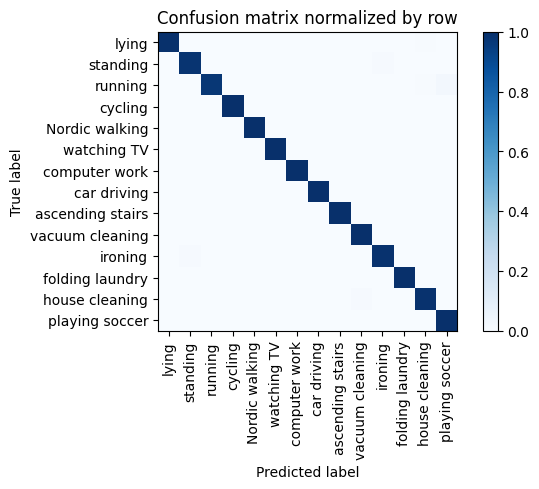

Overall accuracy: 0.994




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.88batch/s]


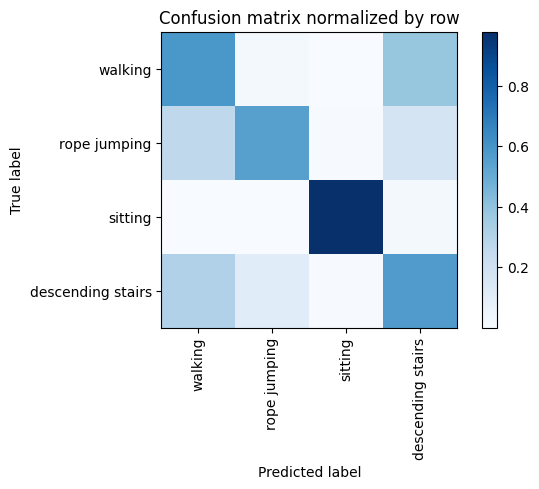

Overall accuracy: 0.708

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.764      0.588      0.665      0.420       2311|	 descending stairs: 0.384,	rope jumping: 0.023,	
          sitting       0.988      0.978      0.983      0.325       1790|	 descending stairs: 0.018,	rope jumping: 0.002,	
descending stairs       0.348      0.566      0.431      0.171        943|	 walking: 0.312,	rope jumping: 0.113,	
     rope jumping       0.607      0.550      0.577      0.084        460|	 walking: 0.267,	descending stairs: 0.176,	

----------------------------------------------------------------------------------------------------
      avg / total       0.752      0.708      0.721        1.0       5504|	      

{'accuracy': 0.7082122093023255, 'precision': 0.6766658602134, 'recall': 0.6707449896090226, 'f1': 0.663968984866376}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.78batch/s]


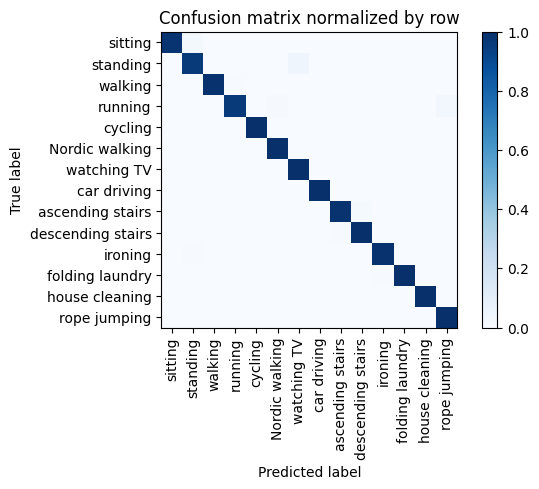

Overall accuracy: 0.989




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.45batch/s]


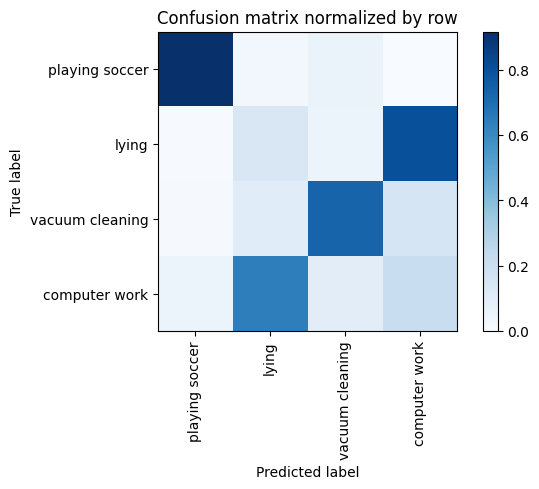

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.269      0.212      0.237      0.432       3067|	 lying: 0.638,	vacuum cleaning: 0.095,	
          lying       0.107      0.137      0.121      0.264       1877|	 computer work: 0.803,	vacuum cleaning: 0.054,	
vacuum cleaning       0.749      0.733      0.741      0.240       1702|	 computer work: 0.153,	lying: 0.106,	
 playing soccer       0.683      0.917      0.783      0.064        458|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.368      0.363      0.362        1.0       7104|	      

{'accuracy': 0.36261261261261263, 'precision': 0.45206793908736864, 'recall': 0.4998527344523156, 'f1': 0.47035159605559046}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.79batch/s]


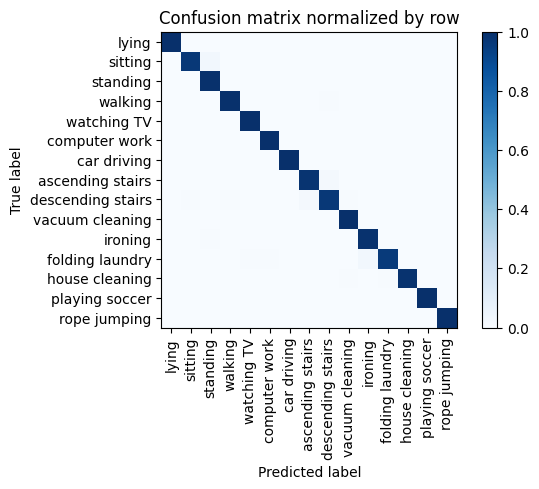

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.63batch/s]


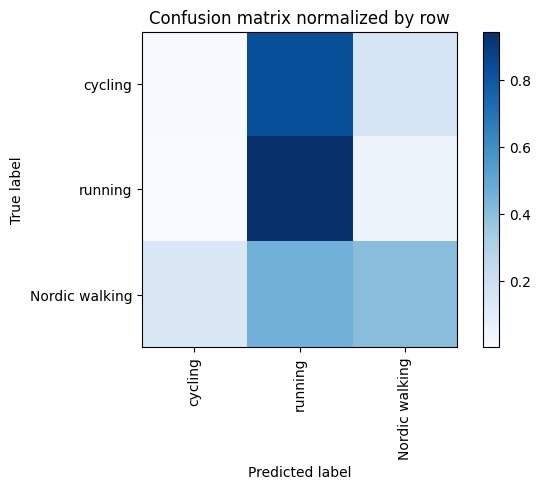

Overall accuracy: 0.376

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.710      0.404      0.515      0.419       1825|	 running: 0.456,	cycling: 0.139,	
       cycling       0.055      0.009      0.016      0.365       1589|	 running: 0.833,	Nordic walking: 0.158,	
       running       0.291      0.943      0.445      0.216        938|	 Nordic walking: 0.054,	cycling: 0.002,	

----------------------------------------------------------------------------------------------------
   avg / total       0.381      0.376      0.318        1.0       4352|	      

{'accuracy': 0.37637867647058826, 'precision': 0.3519962093418521, 'recall': 0.4524400875524444, 'f1': 0.3253825547022278}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.56batch/s]


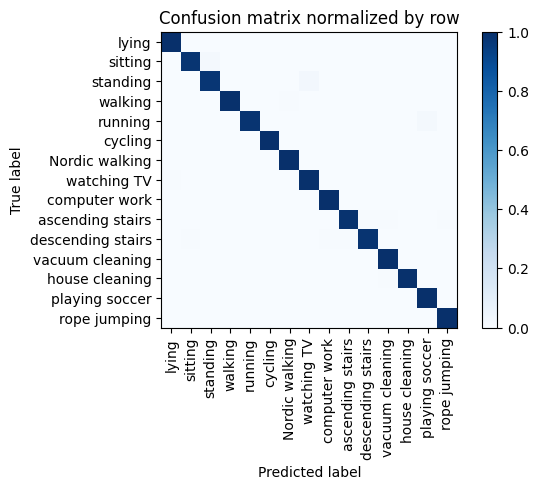

Overall accuracy: 0.992




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.51batch/s]


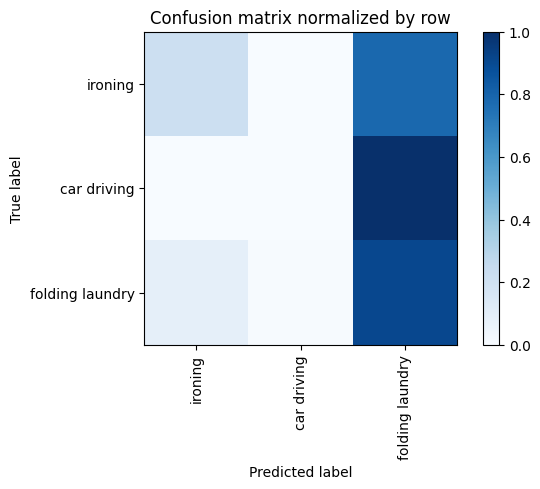

 11%|█         | 2/19 [05:13<44:20, 156.52s/it]

Overall accuracy: 0.361

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.853      0.216      0.344      0.607       2332|	 folding laundry: 0.782,	car driving: 0.003,	
folding laundry       0.273      0.907      0.419      0.254        974|	 ironing: 0.089,	car driving: 0.004,	
    car driving       0.000      0.000      0.000      0.139        534|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.587      0.361      0.315        1.0       3840|	      

{'accuracy': 0.3609375, 'precision': 0.3750244123596289, 'recall': 0.3740885081883106, 'f1': 0.2544546653642276}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.54batch/s]


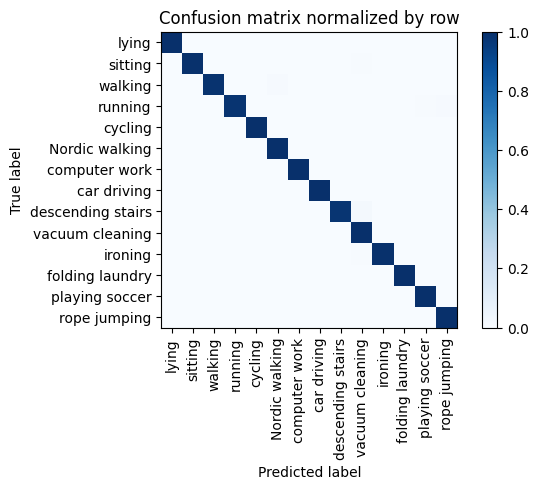

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:05<00:00, 14.59batch/s]


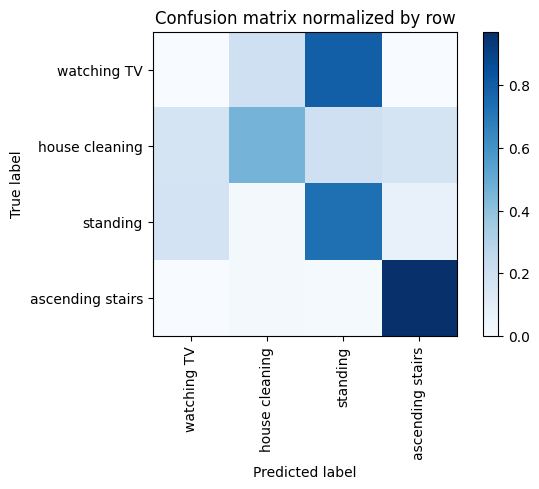

Overall accuracy: 0.579

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.564      0.732      0.637      0.331       1842|	 watching TV: 0.177,	ascending stairs: 0.068,	
  house cleaning       0.787      0.459      0.580      0.329       1832|	 standing: 0.204,	watching TV: 0.170,	
ascending stairs       0.704      0.968      0.815      0.192       1068|	 house cleaning: 0.018,	standing: 0.014,	
     watching TV       0.000      0.000      0.000      0.148        826|	 standing: 0.794,	house cleaning: 0.202,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.581      0.579      0.558 0.9999999999999999       5568|	      

{'accuracy': 0.5790229885057471, 'precision': 0.5137652281952156, 'recall': 0.5398955160037336, 'f1': 0.5080520015692195}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'ru

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.87batch/s]


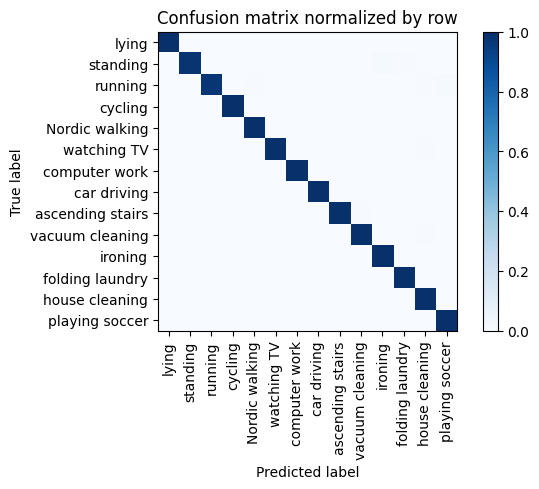

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.75batch/s]


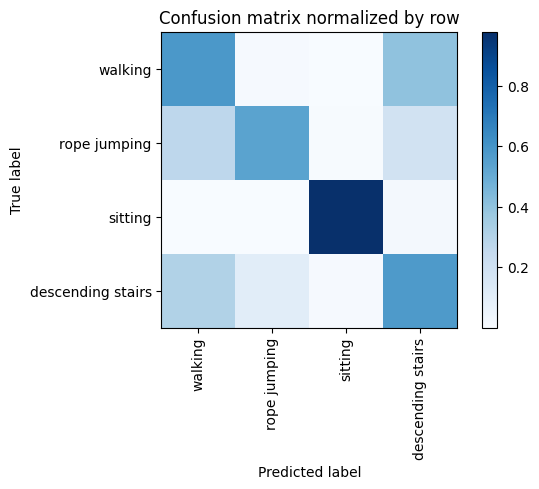

Overall accuracy: 0.706

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.765      0.584      0.662      0.422       2320|	 descending stairs: 0.400,	rope jumping: 0.012,	
          sitting       0.987      0.978      0.983      0.324       1784|	 descending stairs: 0.018,	rope jumping: 0.002,	
descending stairs       0.341      0.576      0.428      0.171        940|	 walking: 0.307,	rope jumping: 0.107,	
     rope jumping       0.651      0.539      0.590      0.084        460|	 walking: 0.270,	descending stairs: 0.185,	

----------------------------------------------------------------------------------------------------
      avg / total       0.755      0.706      0.720        1.0       5504|	      

{'accuracy': 0.7063953488372093, 'precision': 0.6861058696283354, 'recall': 0.6691055131960782, 'f1': 0.6657322364289012}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycl

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.79batch/s]


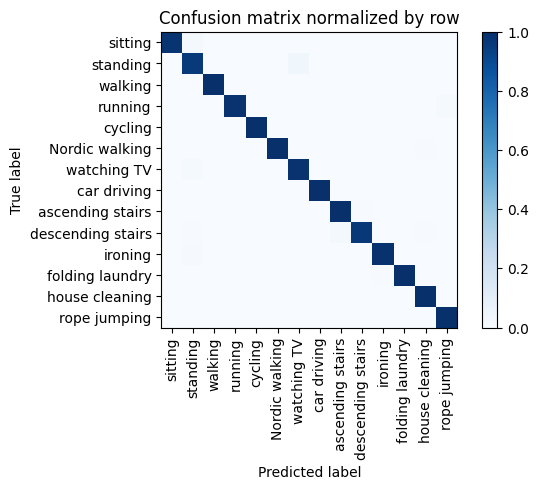

Overall accuracy: 0.989




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.49batch/s]


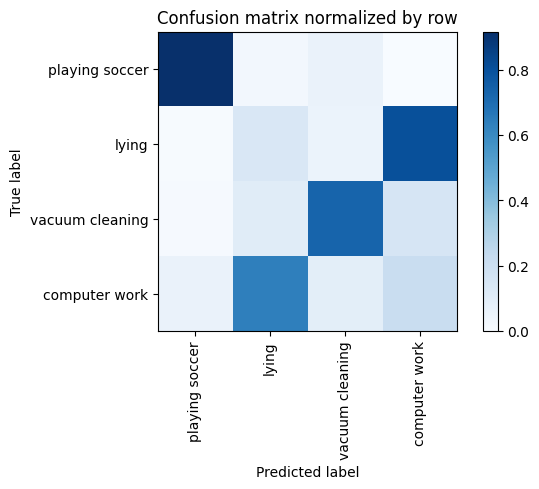

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.270      0.213      0.238      0.432       3068|	 lying: 0.637,	vacuum cleaning: 0.092,	
          lying       0.108      0.138      0.121      0.264       1875|	 computer work: 0.803,	vacuum cleaning: 0.054,	
vacuum cleaning       0.752      0.733      0.742      0.240       1703|	 computer work: 0.153,	lying: 0.106,	
 playing soccer       0.675      0.917      0.778      0.064        458|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.369      0.363      0.363        1.0       7104|	      

{'accuracy': 0.36331644144144143, 'precision': 0.4513995782401623, 'recall': 0.5002891290610745, 'f1': 0.46990773942105224}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.77batch/s]


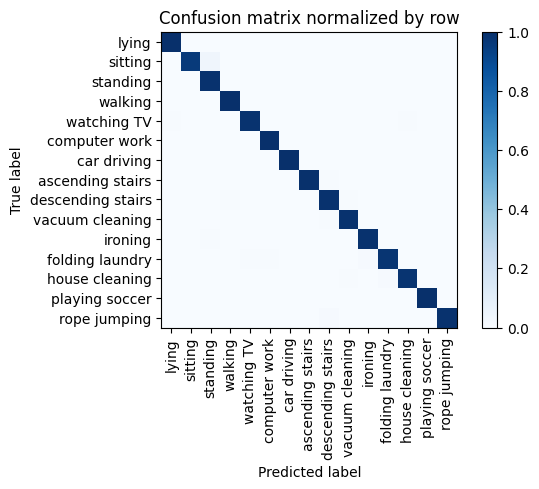

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.64batch/s]


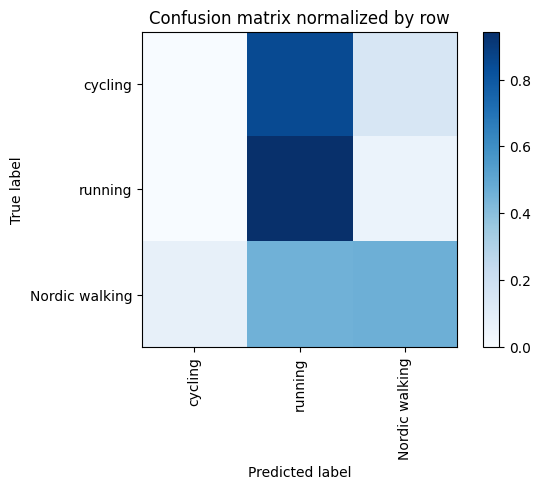

Overall accuracy: 0.400

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.739      0.466      0.571      0.417       1814|	 running: 0.458,	cycling: 0.076,	
       cycling       0.028      0.003      0.005      0.366       1594|	 running: 0.844,	Nordic walking: 0.154,	
       running       0.290      0.943      0.444      0.217        944|	 Nordic walking: 0.057,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.381      0.400      0.336        1.0       4352|	      

{'accuracy': 0.39958639705882354, 'precision': 0.3523619578269395, 'recall': 0.4703758032177408, 'f1': 0.33994351677112644}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.60batch/s]


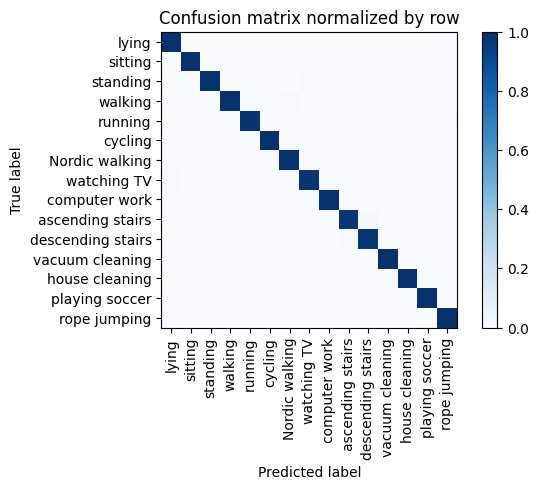

Overall accuracy: 0.994




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.72batch/s]


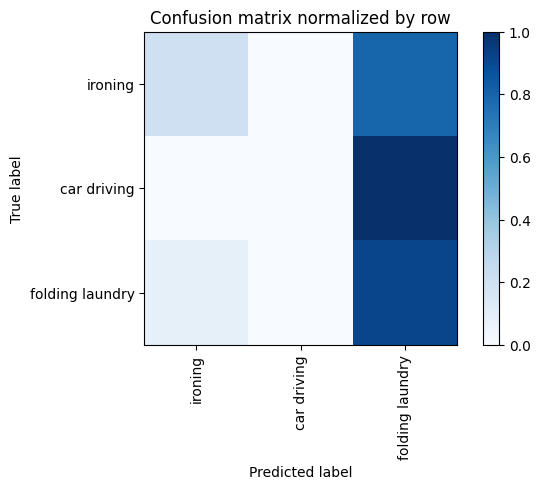

 16%|█▌        | 3/19 [07:50<41:52, 157.01s/it]

Overall accuracy: 0.356

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.856      0.204      0.330      0.608       2334|	 folding laundry: 0.793,	car driving: 0.002,	
folding laundry       0.271      0.916      0.419      0.253        971|	 ironing: 0.082,	car driving: 0.002,	
    car driving       0.000      0.000      0.000      0.139        535|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.589      0.356      0.306        1.0       3840|	      

{'accuracy': 0.35572916666666665, 'precision': 0.375913650150634, 'recall': 0.3733070527737992, 'f1': 0.24954602690090097}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.41batch/s]


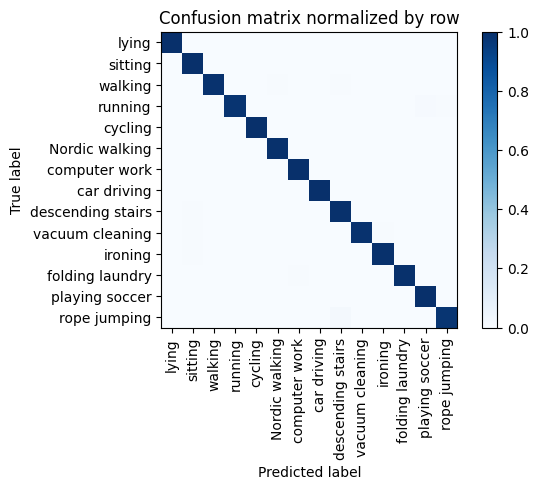

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.86batch/s]


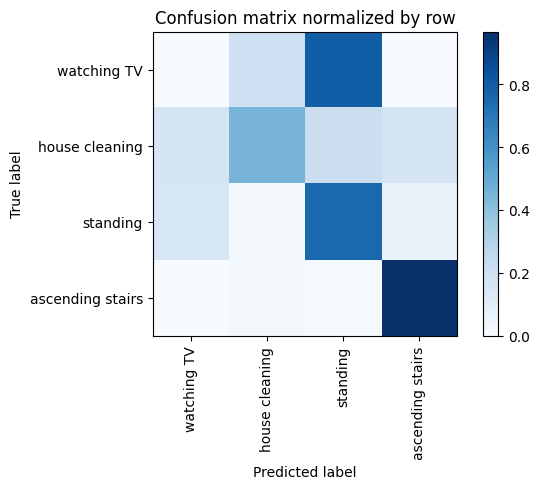

Overall accuracy: 0.587

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.566      0.758      0.648      0.330       1839|	 watching TV: 0.153,	ascending stairs: 0.067,	
  house cleaning       0.788      0.455      0.577      0.329       1830|	 standing: 0.216,	ascending stairs: 0.167,	
ascending stairs       0.707      0.967      0.817      0.193       1075|	 house cleaning: 0.019,	standing: 0.014,	
     watching TV       0.000      0.000      0.000      0.148        824|	 standing: 0.797,	house cleaning: 0.199,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.583      0.587      0.562 0.9999999999999999       5568|	      

{'accuracy': 0.5867456896551724, 'precision': 0.5153794793979694, 'recall': 0.5451634451749353, 'f1': 0.5106023770211422}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.35batch/s]


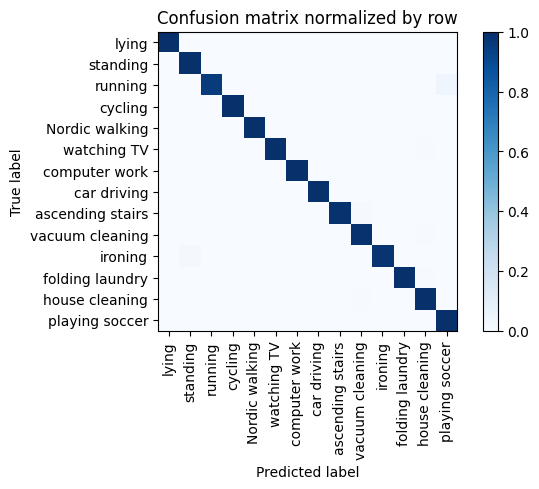

Overall accuracy: 0.993




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.14batch/s]


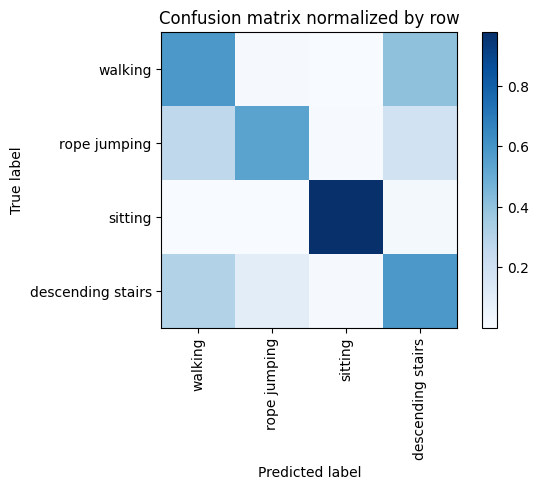

Overall accuracy: 0.708

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.767      0.583      0.663      0.422       2320|	 descending stairs: 0.403,	rope jumping: 0.009,	
          sitting       0.988      0.978      0.983      0.325       1790|	 descending stairs: 0.019,	rope jumping: 0.002,	
descending stairs       0.341      0.581      0.430      0.171        939|	 walking: 0.306,	rope jumping: 0.103,	
     rope jumping       0.668      0.538      0.596      0.083        455|	 walking: 0.268,	descending stairs: 0.187,	

----------------------------------------------------------------------------------------------------
      avg / total       0.758      0.708      0.722        1.0       5504|	      

{'accuracy': 0.7076671511627907, 'precision': 0.6908558467918673, 'recall': 0.6703332831747615, 'f1': 0.667915734736578}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycli

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.11batch/s]


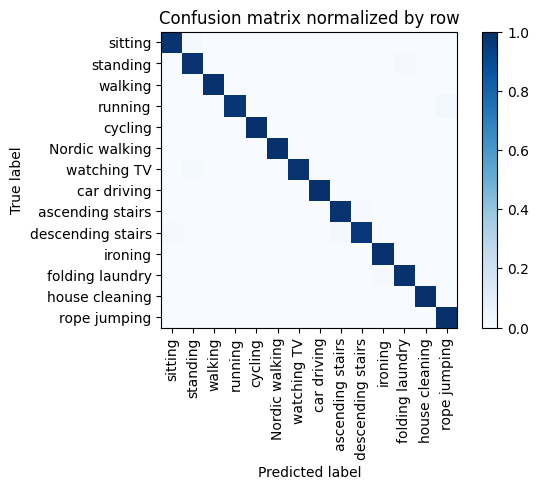

Overall accuracy: 0.990




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.32batch/s]


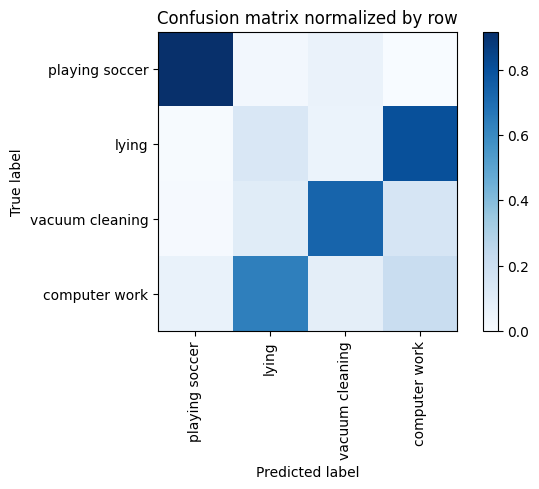

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.272      0.214      0.240      0.432       3070|	 lying: 0.637,	vacuum cleaning: 0.087,	
          lying       0.107      0.138      0.121      0.264       1874|	 computer work: 0.803,	vacuum cleaning: 0.054,	
vacuum cleaning       0.759      0.732      0.745      0.240       1703|	 computer work: 0.153,	lying: 0.106,	
 playing soccer       0.662      0.917      0.769      0.064        457|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.370      0.363      0.363        1.0       7104|	      

{'accuracy': 0.36331644144144143, 'precision': 0.4499929977348865, 'recall': 0.5001261795153377, 'f1': 0.46853322014332155}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.58batch/s]


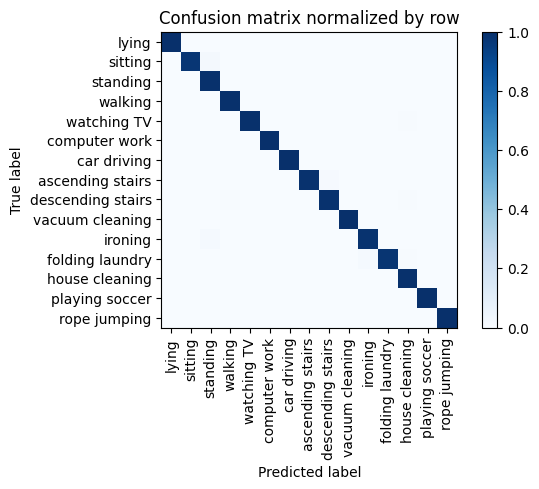

Overall accuracy: 0.993




unseen: 100%|██████████| 68/68 [00:04<00:00, 13.65batch/s]


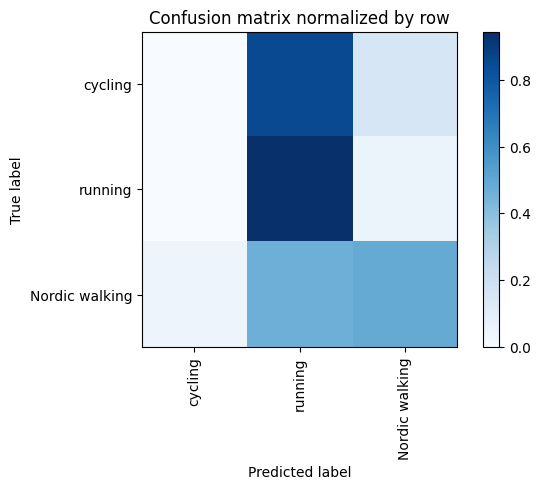

Overall accuracy: 0.409

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.755      0.490      0.594      0.419       1823|	 running: 0.465,	cycling: 0.046,	
       cycling       0.012      0.001      0.001      0.366       1591|	 running: 0.850,	Nordic walking: 0.149,	
       running       0.287      0.943      0.440      0.216        938|	 Nordic walking: 0.057,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.382      0.409      0.344        1.0       4352|	      

{'accuracy': 0.40877757352941174, 'precision': 0.3512124156993874, 'recall': 0.4779924099009761, 'f1': 0.3451030815371272}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.57batch/s]


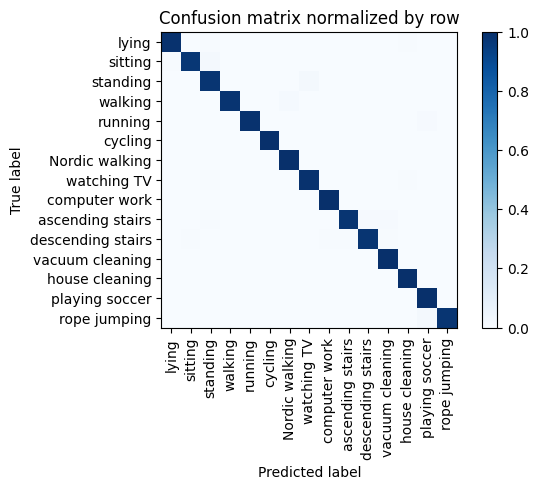

Overall accuracy: 0.990




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.36batch/s]


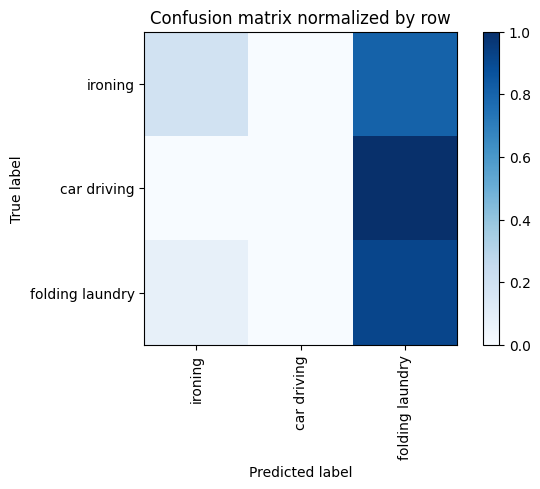

 21%|██        | 4/19 [10:31<39:38, 158.55s/it]

Overall accuracy: 0.348

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.851      0.191      0.312      0.607       2332|	 folding laundry: 0.807,	car driving: 0.002,	
folding laundry       0.269      0.918      0.417      0.253        972|	 ironing: 0.080,	car driving: 0.002,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.585      0.348      0.295        1.0       3840|	      

{'accuracy': 0.34817708333333336, 'precision': 0.37344894182797744, 'recall': 0.36950626695560307, 'f1': 0.24278718146503384}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'ca

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.57batch/s]


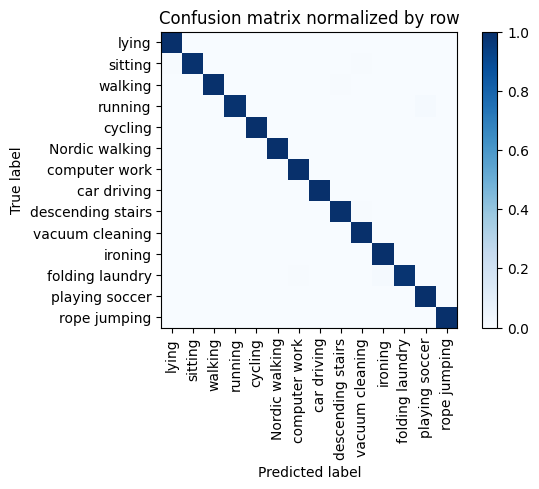

Overall accuracy: 0.996




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.40batch/s]


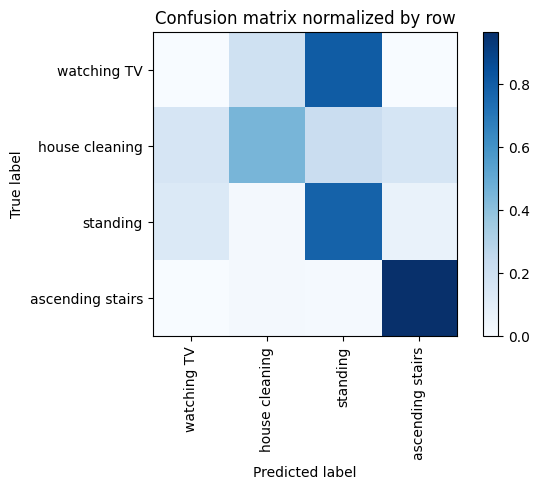

Overall accuracy: 0.592

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.568      0.780      0.658      0.330       1837|	 watching TV: 0.134,	ascending stairs: 0.067,	
  house cleaning       0.793      0.452      0.575      0.328       1829|	 standing: 0.223,	ascending stairs: 0.166,	
ascending stairs       0.709      0.966      0.818      0.193       1074|	 house cleaning: 0.019,	standing: 0.015,	
     watching TV       0.000      0.000      0.000      0.149        828|	 standing: 0.803,	house cleaning: 0.196,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.585      0.592      0.564        1.0       5568|	      

{'accuracy': 0.5921336206896551, 'precision': 0.5174159963163534, 'recall': 0.5495423903417791, 'f1': 0.512673781717143}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runnin

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.63batch/s]


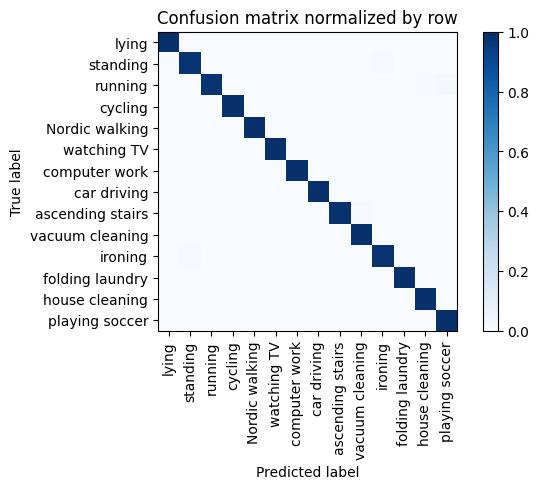

Overall accuracy: 0.994




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.13batch/s]


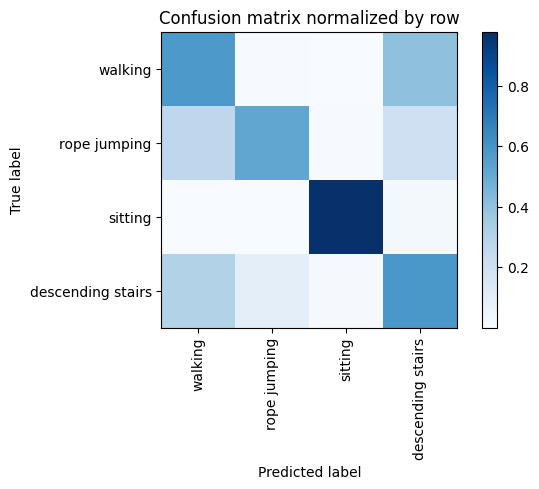

Overall accuracy: 0.706

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.766      0.582      0.661      0.422       2325|	 descending stairs: 0.406,	rope jumping: 0.008,	
          sitting       0.987      0.979      0.983      0.324       1784|	 descending stairs: 0.018,	rope jumping: 0.002,	
descending stairs       0.340      0.586      0.430      0.170        937|	 walking: 0.306,	rope jumping: 0.098,	
     rope jumping       0.678      0.524      0.591      0.083        458|	 walking: 0.269,	descending stairs: 0.201,	

----------------------------------------------------------------------------------------------------
      avg / total       0.758      0.706      0.720        1.0       5504|	      

{'accuracy': 0.7062136627906976, 'precision': 0.6927304850876259, 'recall': 0.6675337204555132, 'f1': 0.6662911634251147}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycl

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.61batch/s]


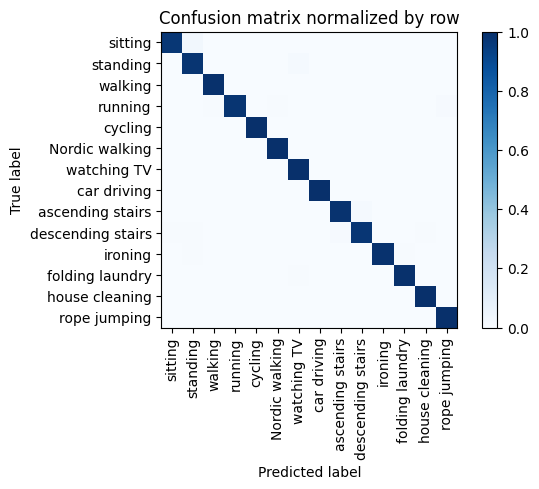

Overall accuracy: 0.990




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.59batch/s]


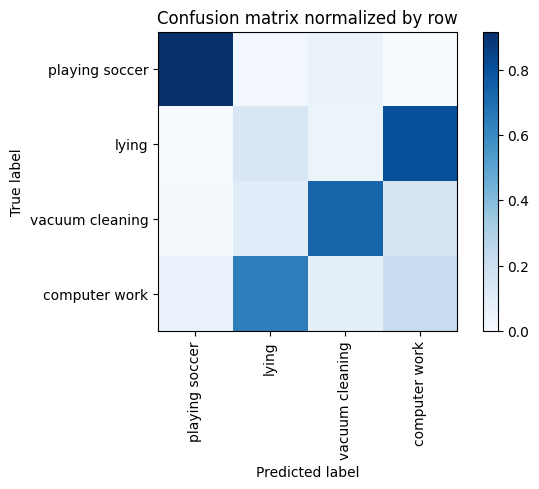

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.271      0.214      0.239      0.432       3069|	 lying: 0.639,	vacuum cleaning: 0.083,	
          lying       0.107      0.137      0.120      0.264       1875|	 computer work: 0.803,	vacuum cleaning: 0.054,	
vacuum cleaning       0.765      0.732      0.748      0.240       1703|	 computer work: 0.153,	lying: 0.106,	
 playing soccer       0.655      0.917      0.764      0.064        457|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.371      0.363      0.363        1.0       7104|	      

{'accuracy': 0.3630349099099099, 'precision': 0.4493020778269584, 'recall': 0.4999104894195543, 'f1': 0.4677348980416972}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.64batch/s]


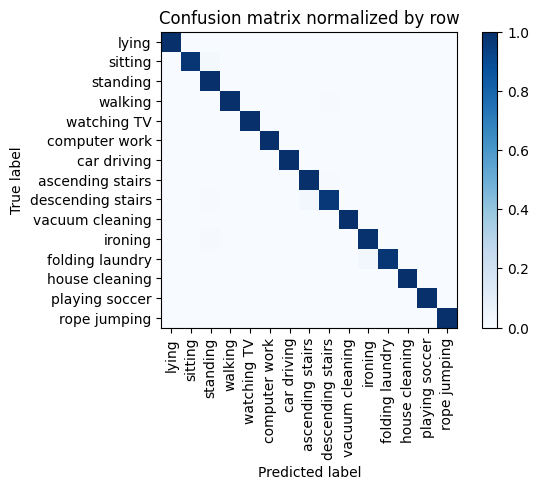

Overall accuracy: 0.992




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.49batch/s]


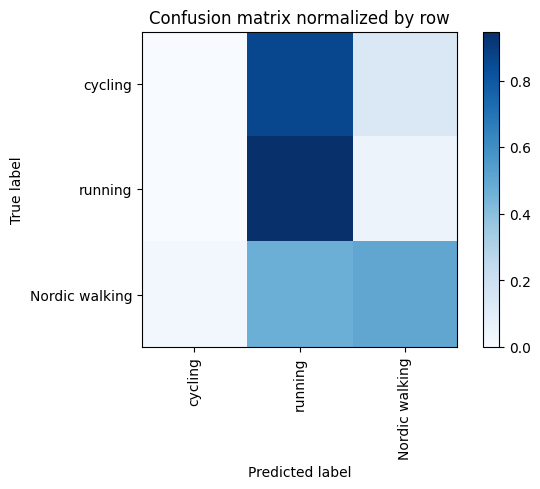

Overall accuracy: 0.415

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.771      0.504      0.610      0.419       1822|	 running: 0.470,	cycling: 0.026,	
       cycling       0.000      0.000      0.000      0.366       1592|	 running: 0.860,	Nordic walking: 0.140,	
       running       0.285      0.947      0.438      0.216        938|	 Nordic walking: 0.053,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.384      0.415      0.350        1.0       4352|	      

{'accuracy': 0.41521139705882354, 'precision': 0.3520761783413857, 'recall': 0.4836952917707214, 'f1': 0.3494103683891913}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.52batch/s]


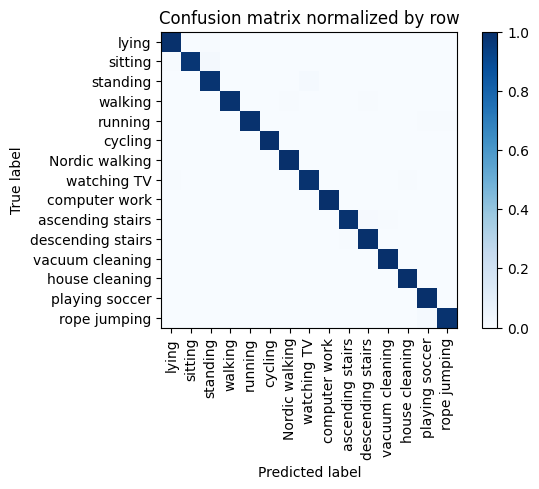

Overall accuracy: 0.993




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.46batch/s]


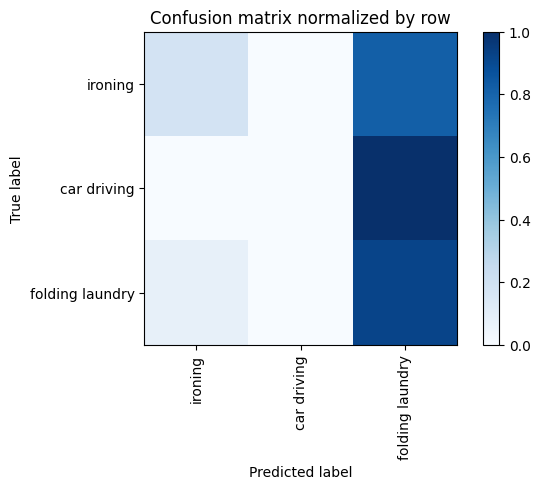

 26%|██▋       | 5/19 [13:10<37:00, 158.64s/it]

Overall accuracy: 0.342

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.847      0.181      0.298      0.607       2330|	 folding laundry: 0.817,	car driving: 0.002,	
folding laundry       0.268      0.921      0.415      0.253        971|	 ironing: 0.078,	car driving: 0.001,	
    car driving       0.000      0.000      0.000      0.140        539|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.582      0.342      0.286        1.0       3840|	      

{'accuracy': 0.3424479166666667, 'precision': 0.3716625997117456, 'recall': 0.3671290014129351, 'f1': 0.23762800610507706}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.65batch/s]


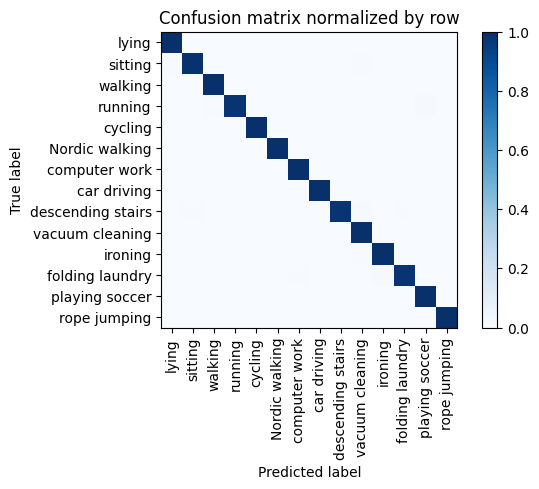

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.37batch/s]


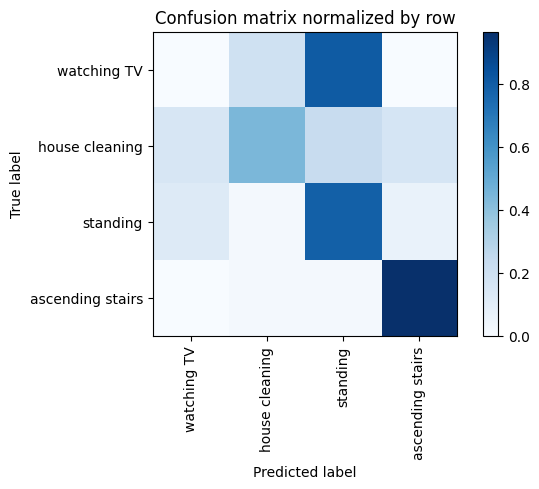

Overall accuracy: 0.592

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.567      0.788      0.659      0.331       1841|	 watching TV: 0.128,	ascending stairs: 0.067,	
  house cleaning       0.796      0.444      0.570      0.329       1834|	 standing: 0.234,	ascending stairs: 0.165,	
ascending stairs       0.707      0.966      0.817      0.192       1071|	 standing: 0.017,	house cleaning: 0.017,	
     watching TV       0.000      0.000      0.000      0.148        822|	 standing: 0.805,	house cleaning: 0.193,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.586      0.592      0.563        1.0       5568|	      

{'accuracy': 0.592492816091954, 'precision': 0.5176388820755241, 'recall': 0.5494601462911232, 'f1': 0.5115023030809511}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runnin

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.60batch/s]


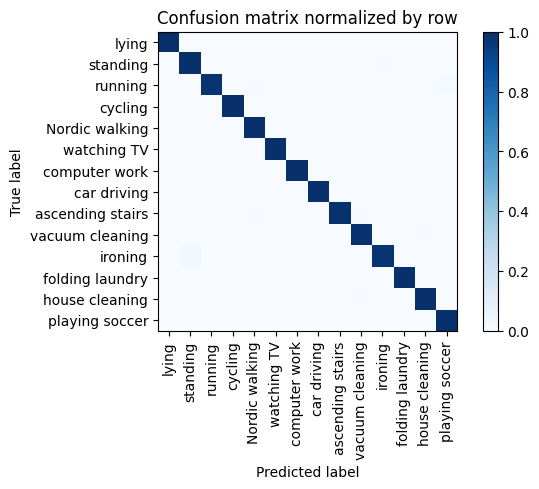

Overall accuracy: 0.994




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.35batch/s]


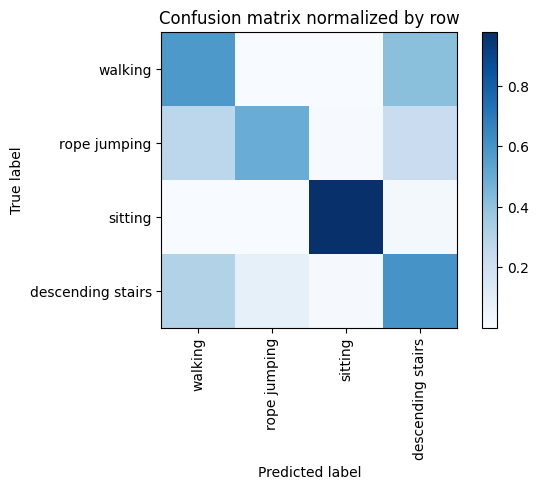

Overall accuracy: 0.705

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.764      0.580      0.659      0.422       2324|	 descending stairs: 0.411,	sitting: 0.005,	
          sitting       0.987      0.979      0.983      0.324       1783|	 descending stairs: 0.019,	rope jumping: 0.002,	
descending stairs       0.340      0.598      0.434      0.171        942|	 walking: 0.308,	rope jumping: 0.085,	
     rope jumping       0.705      0.495      0.581      0.083        455|	 walking: 0.273,	descending stairs: 0.226,	

----------------------------------------------------------------------------------------------------
      avg / total       0.759      0.705      0.719        1.0       5504|	      

{'accuracy': 0.7049418604651163, 'precision': 0.6991864037998056, 'recall': 0.6626154434996759, 'f1': 0.6642811278658349}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.52batch/s]


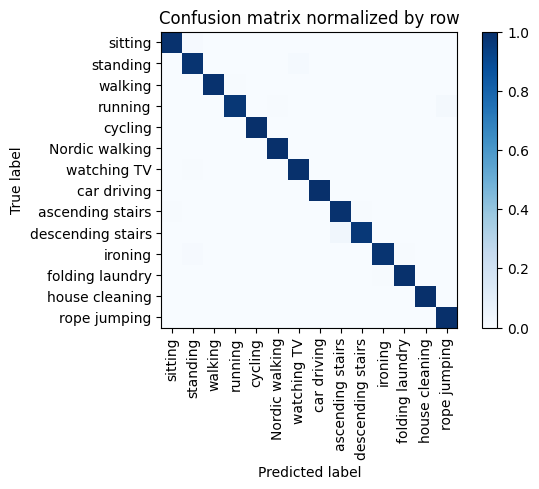

Overall accuracy: 0.990




unseen: 100%|██████████| 111/111 [00:07<00:00, 13.96batch/s]


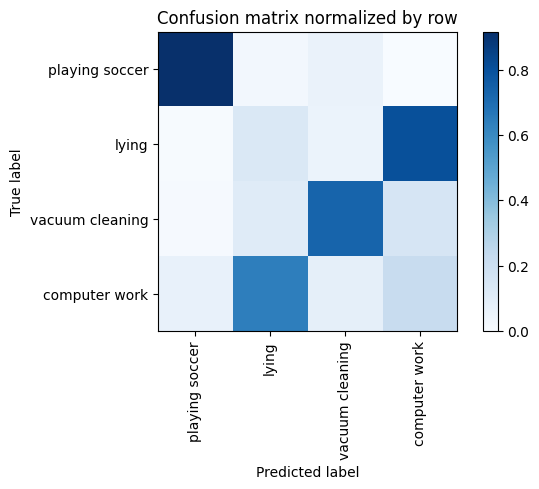

Overall accuracy: 0.363

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.273      0.216      0.241      0.432       3069|	 lying: 0.639,	vacuum cleaning: 0.080,	
          lying       0.105      0.134      0.118      0.264       1875|	 computer work: 0.804,	vacuum cleaning: 0.057,	
vacuum cleaning       0.768      0.731      0.749      0.240       1703|	 computer work: 0.152,	lying: 0.107,	
 playing soccer       0.650      0.917      0.760      0.064        457|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.371      0.363      0.364        1.0       7104|	      

{'accuracy': 0.36317567567567566, 'precision': 0.4487650209793371, 'recall': 0.499667241299921, 'f1': 0.46712295001155285}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.61batch/s]


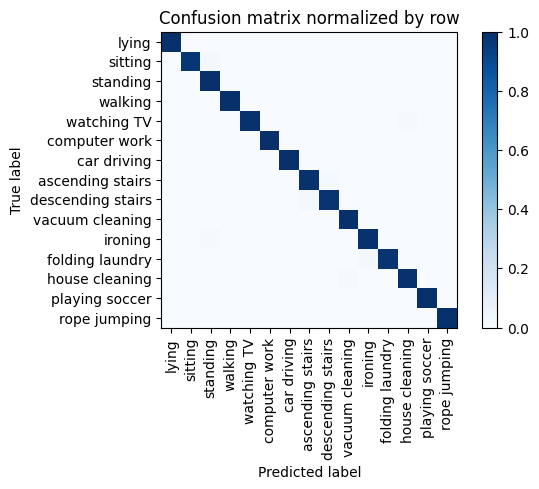

Overall accuracy: 0.993




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.12batch/s]


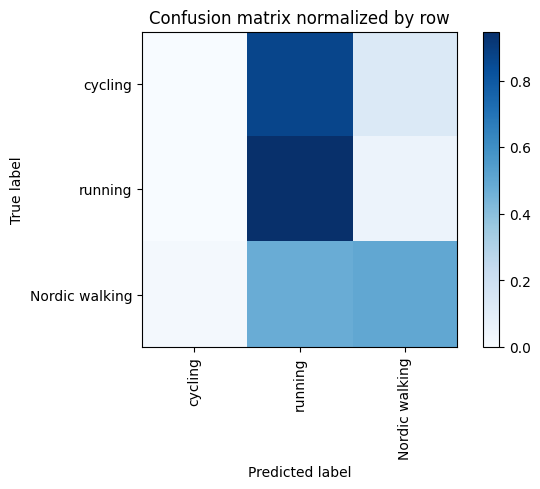

Overall accuracy: 0.413

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.779      0.502      0.611      0.418       1820|	 running: 0.478,	cycling: 0.020,	
       cycling       0.000      0.000      0.000      0.367       1598|	 running: 0.869,	Nordic walking: 0.131,	
       running       0.281      0.946      0.434      0.215        934|	 Nordic walking: 0.054,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.386      0.413      0.348        1.0       4352|	      

{'accuracy': 0.4131433823529412, 'precision': 0.35329479409412007, 'recall': 0.48288820387321457, 'f1': 0.3481043430225405}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.37batch/s]


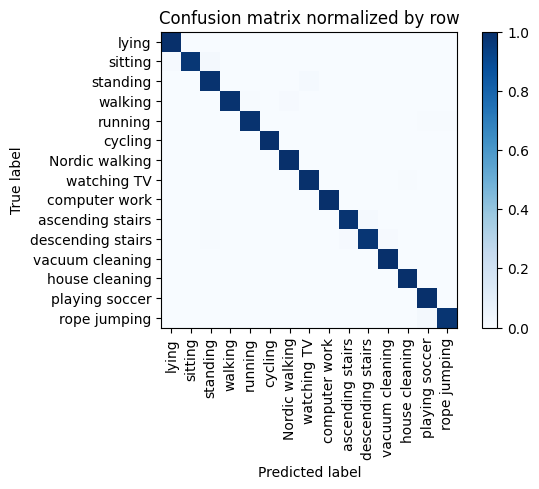

Overall accuracy: 0.992




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.12batch/s]


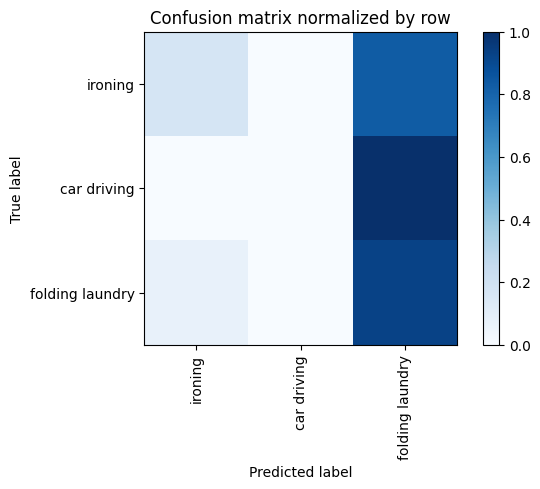

 32%|███▏      | 6/19 [15:49<34:25, 158.90s/it]

Overall accuracy: 0.337

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.847      0.168      0.281      0.607       2332|	 folding laundry: 0.830,	car driving: 0.002,	
folding laundry       0.267      0.927      0.415      0.253        972|	 ironing: 0.073,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.582      0.337      0.275        1.0       3840|	      

{'accuracy': 0.33671875, 'precision': 0.37128424743814087, 'recall': 0.36501692913293193, 'f1': 0.23177531349829952}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.59batch/s]


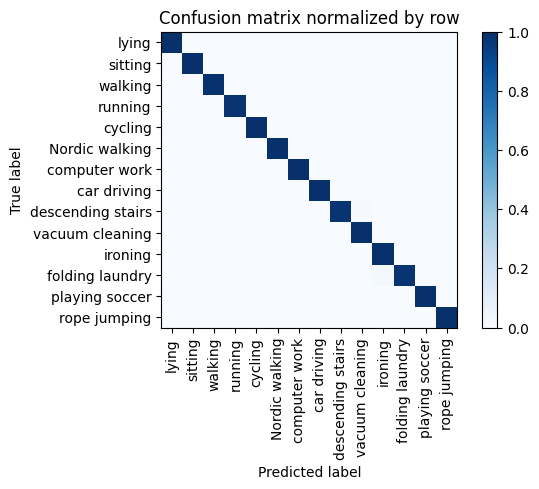

Overall accuracy: 0.997




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.51batch/s]


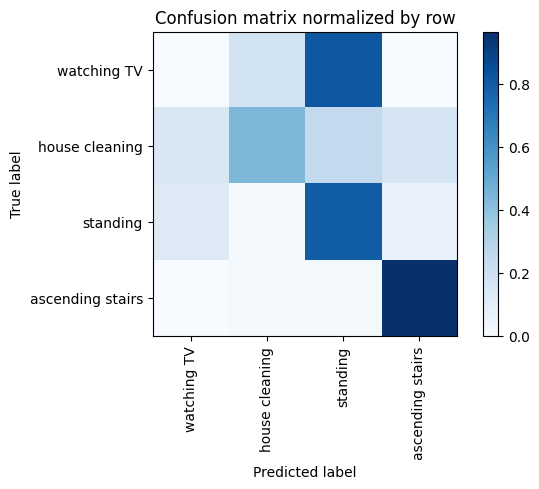

Overall accuracy: 0.594

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.562      0.798      0.659      0.331       1844|	 watching TV: 0.121,	ascending stairs: 0.066,	
  house cleaning       0.802      0.438      0.566      0.328       1825|	 standing: 0.251,	ascending stairs: 0.164,	
ascending stairs       0.710      0.965      0.818      0.193       1075|	 house cleaning: 0.019,	standing: 0.017,	
     watching TV       0.000      0.000      0.000      0.148        824|	 standing: 0.816,	house cleaning: 0.183,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.586      0.594      0.562        1.0       5568|	      

{'accuracy': 0.5941091954022989, 'precision': 0.5185787172532018, 'recall': 0.5501810060128024, 'f1': 0.511027489191261}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runnin

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.48batch/s]


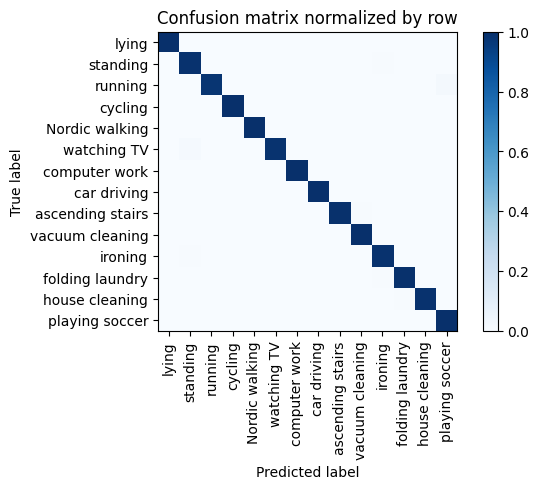

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.04batch/s]


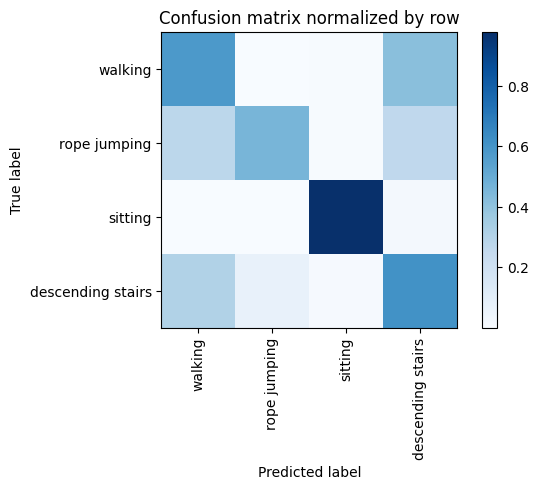

Overall accuracy: 0.704

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.763      0.579      0.658      0.421       2316|	 descending stairs: 0.415,	sitting: 0.005,	
          sitting       0.987      0.979      0.983      0.324       1786|	 descending stairs: 0.020,	walking: 0.001,	
descending stairs       0.341      0.611      0.437      0.172        945|	 walking: 0.307,	rope jumping: 0.073,	
     rope jumping       0.741      0.457      0.566      0.083        457|	 walking: 0.274,	descending stairs: 0.263,	

----------------------------------------------------------------------------------------------------
      avg / total       0.761      0.704      0.718        1.0       5504|	      

{'accuracy': 0.7040334302325582, 'precision': 0.7079403736712879, 'recall': 0.656412843658426, 'f1': 0.6610634053961212}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.45batch/s]


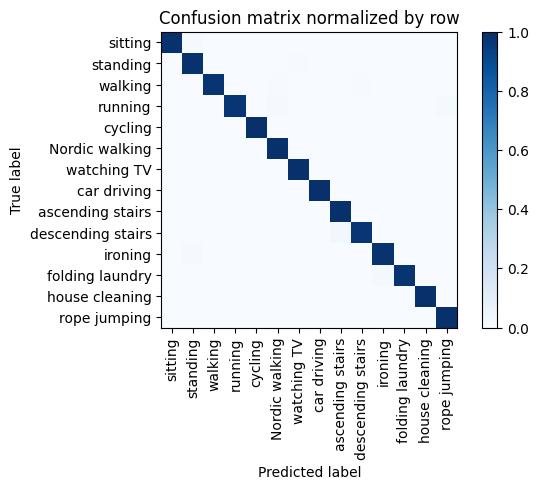

Overall accuracy: 0.991




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.18batch/s]


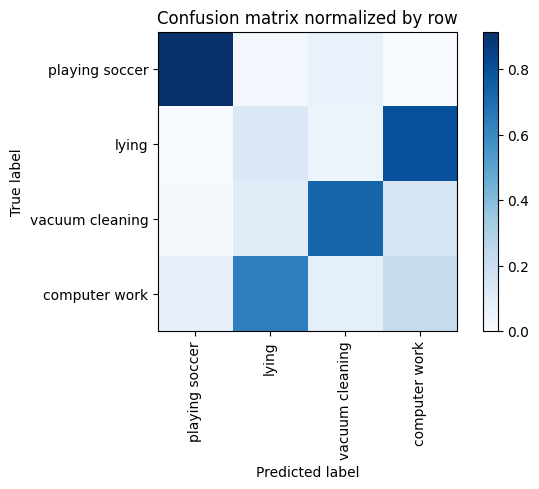

Overall accuracy: 0.365

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.277      0.220      0.246      0.432       3068|	 lying: 0.635,	vacuum cleaning: 0.079,	
          lying       0.106      0.135      0.119      0.264       1877|	 computer work: 0.803,	vacuum cleaning: 0.056,	
vacuum cleaning       0.768      0.732      0.749      0.240       1702|	 computer work: 0.150,	lying: 0.109,	
 playing soccer       0.649      0.915      0.759      0.064        457|	 vacuum cleaning: 0.061,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.373      0.365      0.366        1.0       7104|	      

{'accuracy': 0.3651463963963964, 'precision': 0.44996670140424305, 'recall': 0.500600510852316, 'f1': 0.468279882999443}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.38batch/s]


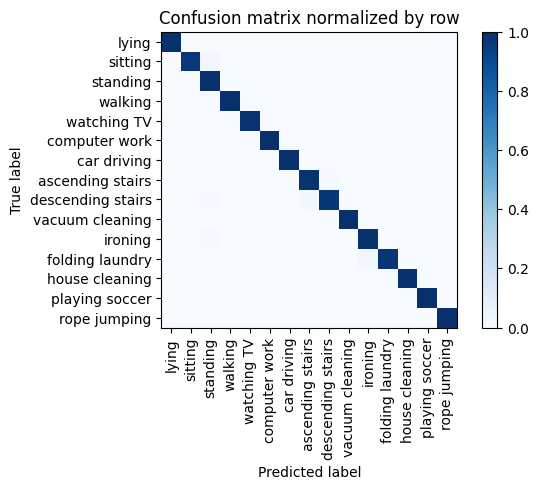

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.42batch/s]


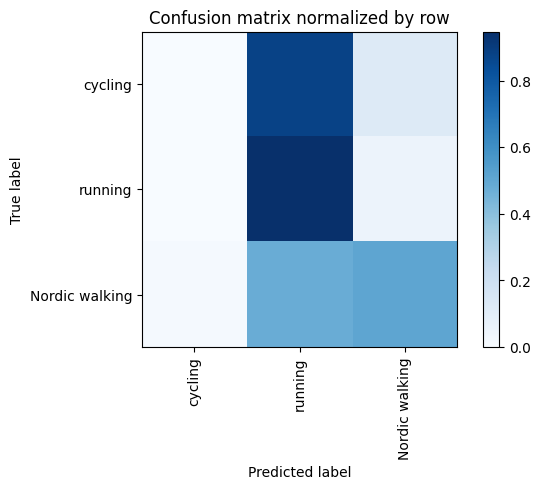

Overall accuracy: 0.418

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.793      0.509      0.620      0.420       1827|	 running: 0.478,	cycling: 0.013,	
       cycling       0.000      0.000      0.000      0.365       1587|	 running: 0.878,	Nordic walking: 0.122,	
       running       0.281      0.947      0.434      0.216        938|	 Nordic walking: 0.053,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.393      0.418      0.354        1.0       4352|	      

{'accuracy': 0.4177389705882353, 'precision': 0.3580692319910275, 'recall': 0.48524209821173275, 'f1': 0.3512685230418499}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.65batch/s]


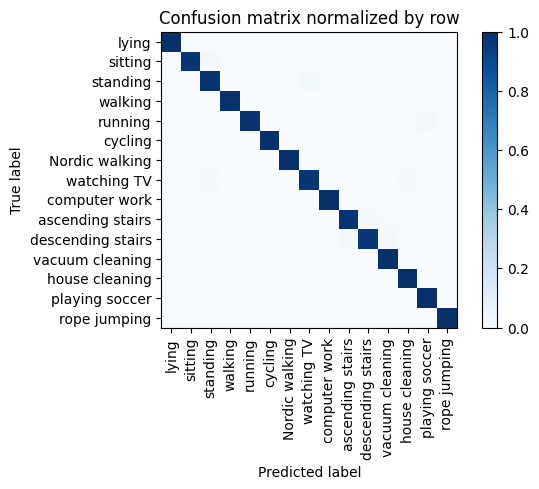

Overall accuracy: 0.991




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.14batch/s]


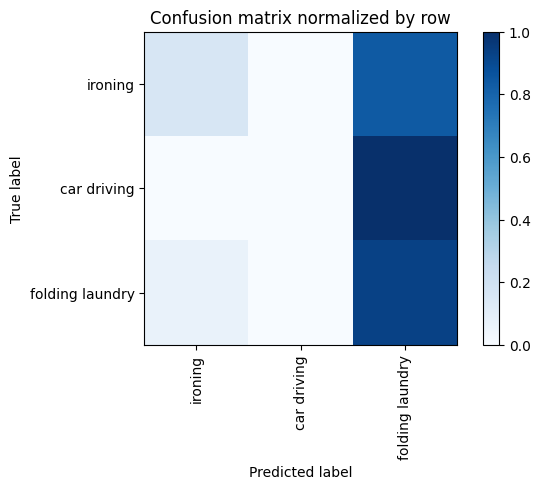

 37%|███▋      | 7/19 [18:30<31:53, 159.44s/it]

Overall accuracy: 0.331

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.845      0.159      0.267      0.608       2333|	 folding laundry: 0.839,	car driving: 0.002,	
folding laundry       0.266      0.930      0.413      0.253        970|	 ironing: 0.070,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.580      0.331      0.267        1.0       3840|	      

{'accuracy': 0.33125, 'precision': 0.3700924219552663, 'recall': 0.362830330695254, 'f1': 0.2267166142314199}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, '

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.28batch/s]


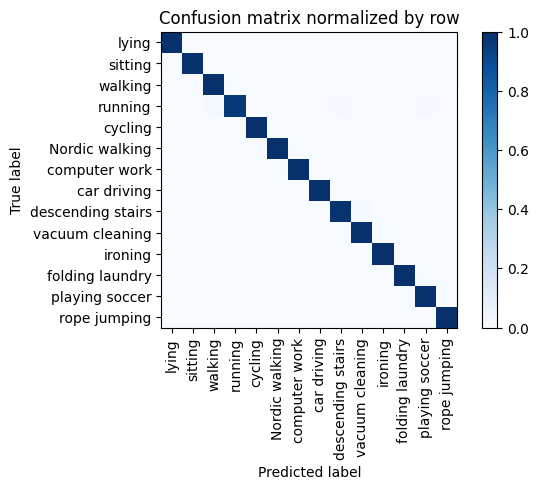

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.51batch/s]


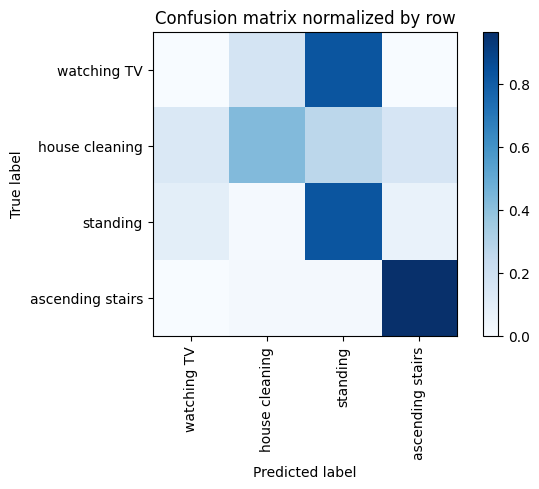

Overall accuracy: 0.600

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.561      0.827      0.668      0.331       1841|	 watching TV: 0.098,	ascending stairs: 0.064,	
  house cleaning       0.811      0.429      0.561      0.328       1825|	 standing: 0.268,	ascending stairs: 0.160,	
ascending stairs       0.716      0.964      0.822      0.193       1077|	 house cleaning: 0.019,	standing: 0.018,	
     watching TV       0.000      0.000      0.000      0.148        825|	 standing: 0.827,	house cleaning: 0.172,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.590      0.600      0.564        1.0       5568|	      

{'accuracy': 0.6003951149425287, 'precision': 0.5219794235102974, 'recall': 0.5548885007295881, 'f1': 0.5128413277504981}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.66batch/s]


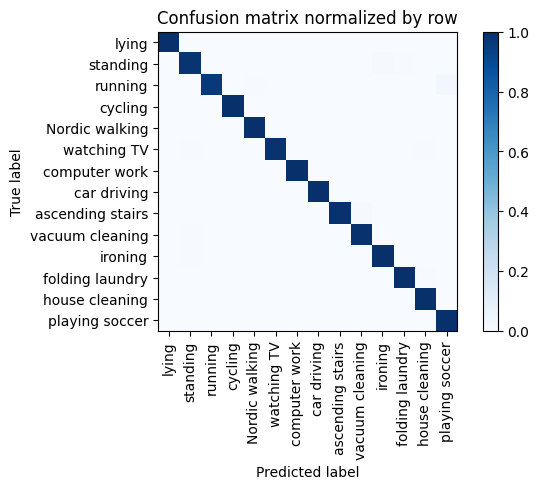

Overall accuracy: 0.994




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.21batch/s]


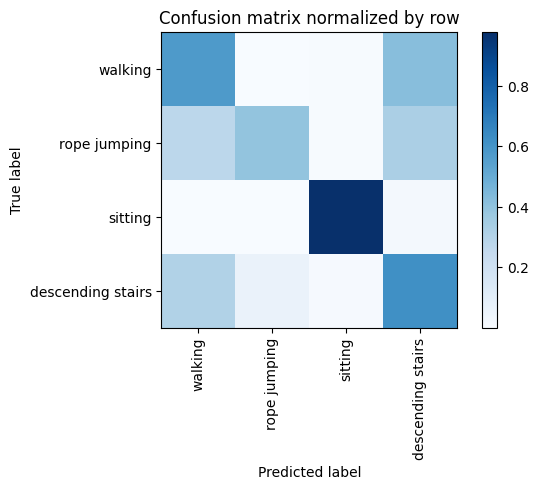

Overall accuracy: 0.698

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.762      0.574      0.655      0.421       2317|	 descending stairs: 0.420,	sitting: 0.005,	
          sitting       0.987      0.979      0.983      0.325       1789|	 descending stairs: 0.020,	walking: 0.001,	
descending stairs       0.335      0.619      0.435      0.172        944|	 walking: 0.307,	rope jumping: 0.065,	
     rope jumping       0.733      0.392      0.511      0.082        454|	 descending stairs: 0.328,	walking: 0.273,	

----------------------------------------------------------------------------------------------------
      avg / total       0.759      0.698      0.712 0.9999999999999999       5504|	      

{'accuracy': 0.698219476744186, 'precision': 0.7041814406352652, 'recall': 0.6408729406382695, 'f1': 0.6458344905647463}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.56batch/s]


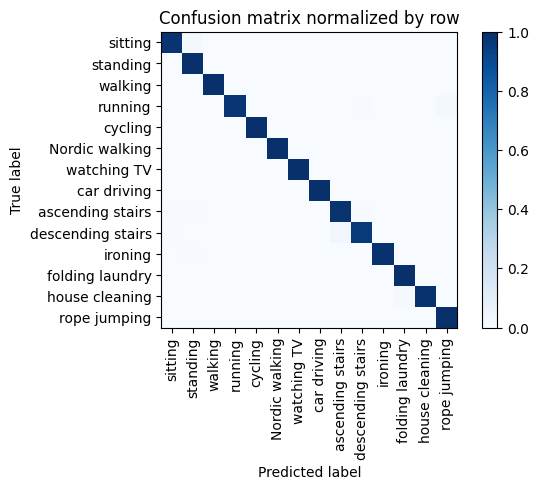

Overall accuracy: 0.992




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.23batch/s]


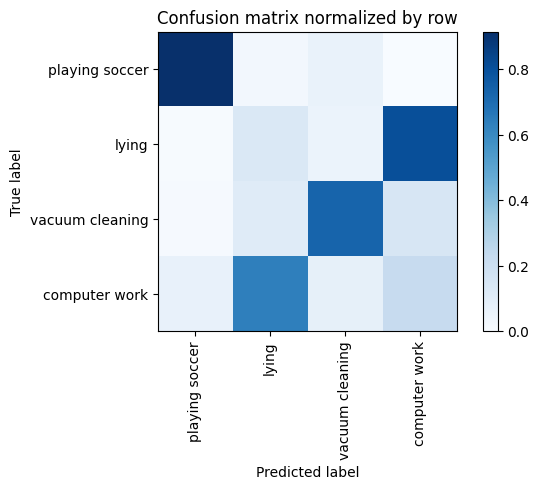

Overall accuracy: 0.365

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.279      0.223      0.248      0.432       3068|	 lying: 0.633,	vacuum cleaning: 0.077,	
          lying       0.104      0.132      0.116      0.264       1876|	 computer work: 0.807,	vacuum cleaning: 0.057,	
vacuum cleaning       0.771      0.732      0.751      0.240       1704|	 computer work: 0.150,	lying: 0.109,	
 playing soccer       0.643      0.914      0.755      0.064        456|	 vacuum cleaning: 0.061,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.374      0.365      0.366        1.0       7104|	      

{'accuracy': 0.36528716216216217, 'precision': 0.44904616377479795, 'recall': 0.5002227134836138, 'f1': 0.46736596586931267}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.35batch/s]


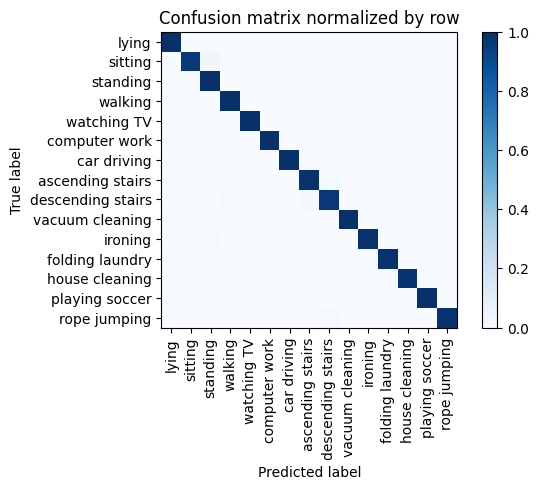

Overall accuracy: 0.991




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.12batch/s]


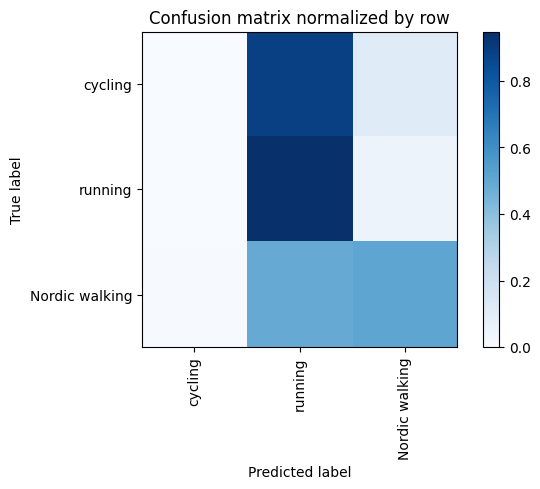

Overall accuracy: 0.419

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.804      0.510      0.624      0.420       1830|	 running: 0.485,	cycling: 0.005,	
       cycling       0.000      0.000      0.000      0.364       1584|	 running: 0.888,	Nordic walking: 0.112,	
       running       0.279      0.948      0.431      0.216        938|	 Nordic walking: 0.052,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.398      0.419      0.355        1.0       4352|	      

{'accuracy': 0.4186580882352941, 'precision': 0.3612022020720711, 'recall': 0.485865753201207, 'f1': 0.35184298168799605}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.63batch/s]


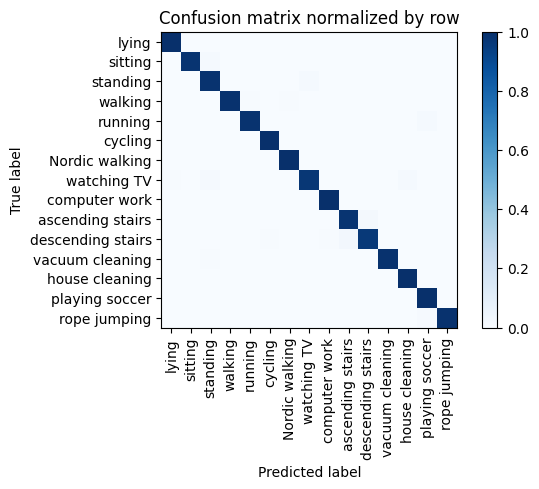

Overall accuracy: 0.991




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.44batch/s]


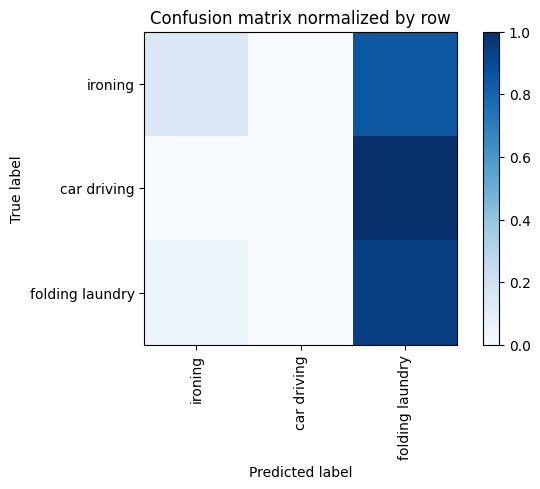

 42%|████▏     | 8/19 [21:11<29:18, 159.83s/it]

Overall accuracy: 0.328

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.852      0.148      0.252      0.607       2329|	 folding laundry: 0.850,	car driving: 0.002,	
folding laundry       0.267      0.938      0.415      0.254        975|	 ironing: 0.062,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.584      0.328      0.259        1.0       3840|	      

{'accuracy': 0.328125, 'precision': 0.3728719000827844, 'recall': 0.3621979280201693, 'f1': 0.22260482410508112}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.29batch/s]


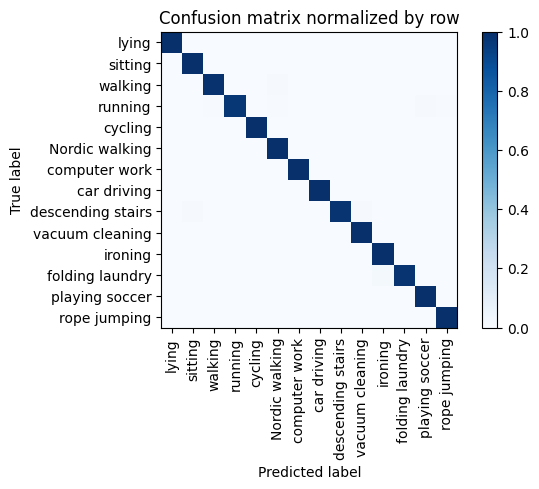

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.63batch/s]


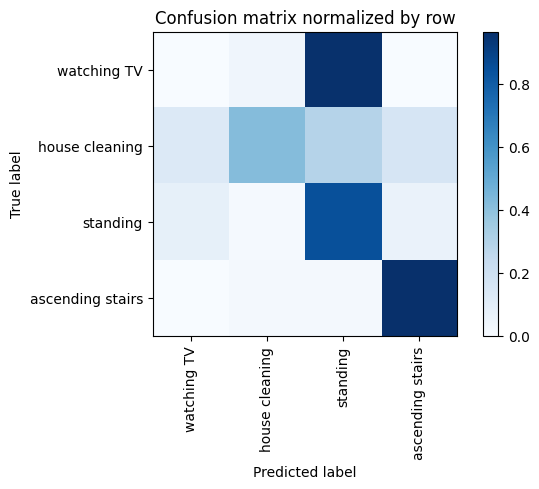

Overall accuracy: 0.603

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.536      0.844      0.656      0.330       1839|	 watching TV: 0.083,	ascending stairs: 0.061,	
  house cleaning       0.913      0.419      0.575      0.329       1831|	 standing: 0.291,	ascending stairs: 0.159,	
ascending stairs       0.719      0.964      0.824      0.193       1075|	 standing: 0.019,	house cleaning: 0.018,	
     watching TV       0.000      0.000      0.000      0.148        823|	 standing: 0.959,	house cleaning: 0.040,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.616      0.603      0.565 0.9999999999999999       5568|	      

{'accuracy': 0.6029094827586207, 'precision': 0.5421464729277906, 'recall': 0.5569111384062766, 'f1': 0.51362112128535}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.41batch/s]


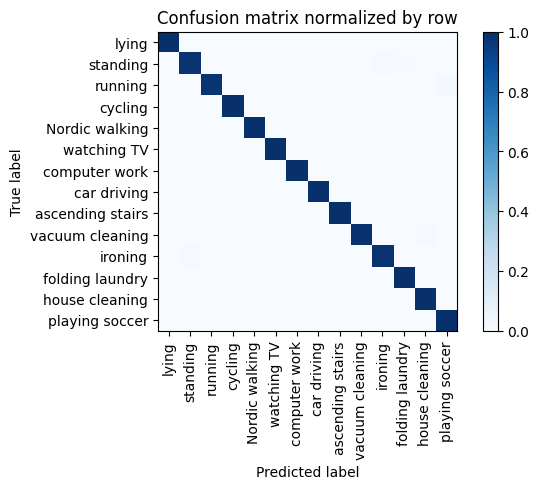

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.20batch/s]


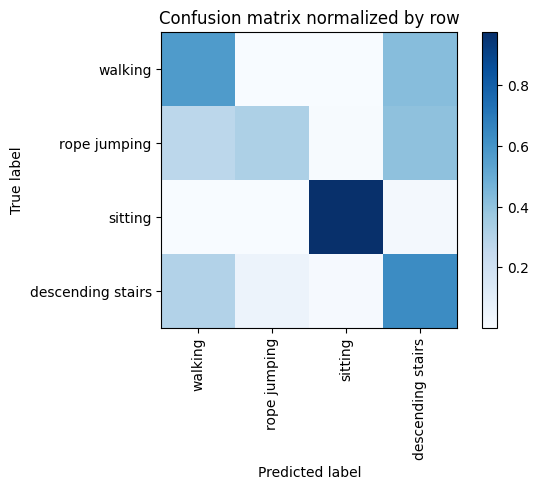

Overall accuracy: 0.693

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.762      0.572      0.654      0.421       2316|	 descending stairs: 0.423,	sitting: 0.004,	
          sitting       0.988      0.977      0.983      0.325       1788|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.332      0.632      0.435      0.171        943|	 walking: 0.303,	rope jumping: 0.056,	
     rope jumping       0.721      0.317      0.441      0.083        457|	 descending stairs: 0.403,	walking: 0.274,	

----------------------------------------------------------------------------------------------------
      avg / total       0.759      0.693      0.705        1.0       5504|	      

{'accuracy': 0.6927688953488372, 'precision': 0.700887407968664, 'recall': 0.624622133793232, 'f1': 0.628001510346636}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nor

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.45batch/s]


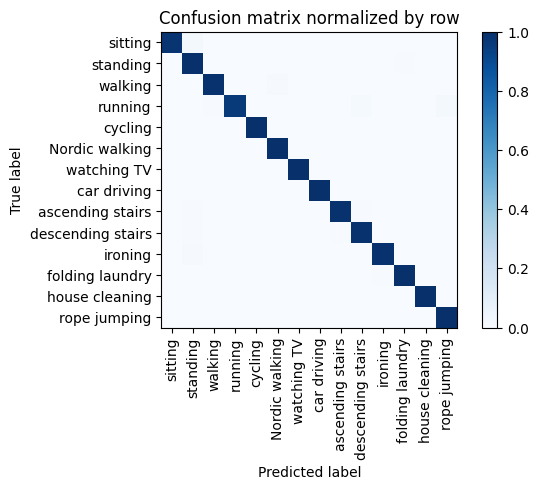

Overall accuracy: 0.991




unseen: 100%|██████████| 111/111 [00:07<00:00, 13.92batch/s]


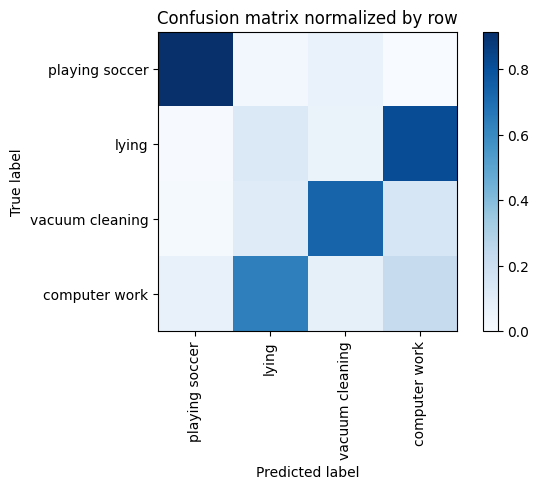

Overall accuracy: 0.364

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.278      0.223      0.248      0.432       3066|	 lying: 0.633,	vacuum cleaning: 0.075,	
          lying       0.099      0.125      0.111      0.264       1876|	 computer work: 0.812,	vacuum cleaning: 0.059,	
vacuum cleaning       0.772      0.732      0.752      0.240       1706|	 computer work: 0.148,	lying: 0.108,	
 playing soccer       0.640      0.914      0.753      0.064        456|	 vacuum cleaning: 0.061,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.373      0.364      0.365        1.0       7104|	      

{'accuracy': 0.3640202702702703, 'precision': 0.44731211376856905, 'recall': 0.4988200664334616, 'f1': 0.46572036013280776}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.51batch/s]


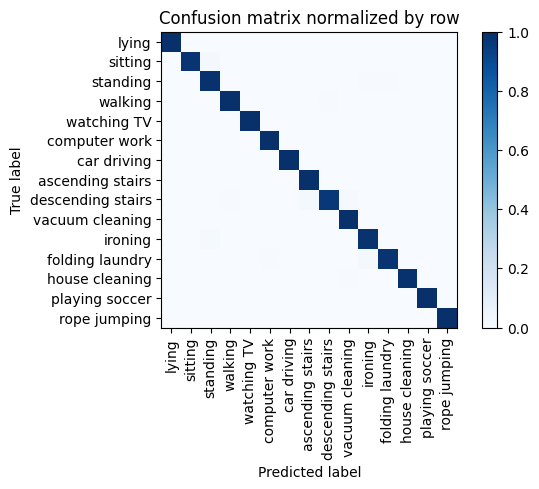

Overall accuracy: 0.992




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.43batch/s]


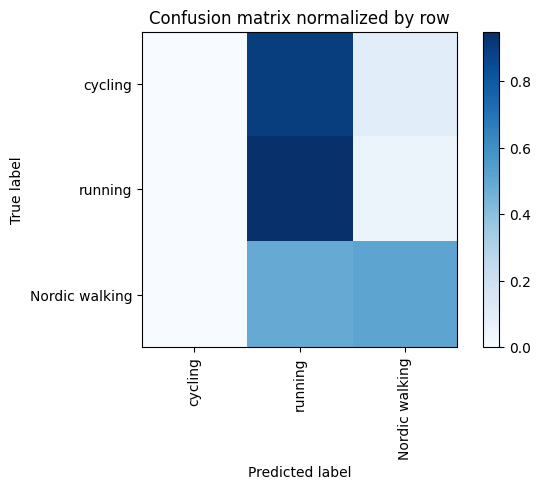

Overall accuracy: 0.420

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.816      0.512      0.629      0.419       1823|	 running: 0.488,	cycling: 0.001,	
       cycling       0.000      0.000      0.000      0.365       1588|	 running: 0.897,	Nordic walking: 0.103,	
       running       0.278      0.949      0.431      0.216        941|	 Nordic walking: 0.051,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.402      0.420      0.357        1.0       4352|	      

{'accuracy': 0.4195772058823529, 'precision': 0.3646709412612125, 'recall': 0.4869280607594268, 'f1': 0.35316234932700724}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.37batch/s]


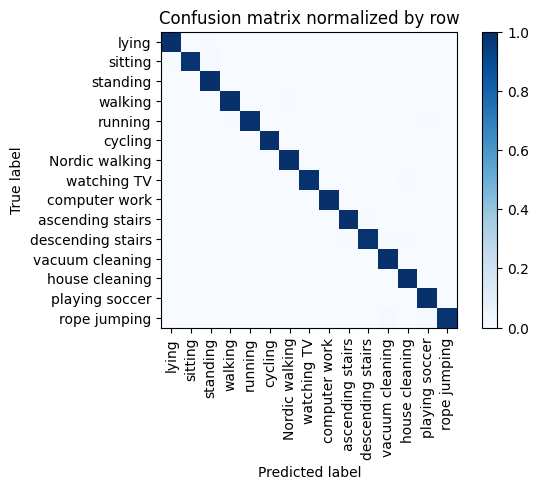

Overall accuracy: 0.994




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.45batch/s]


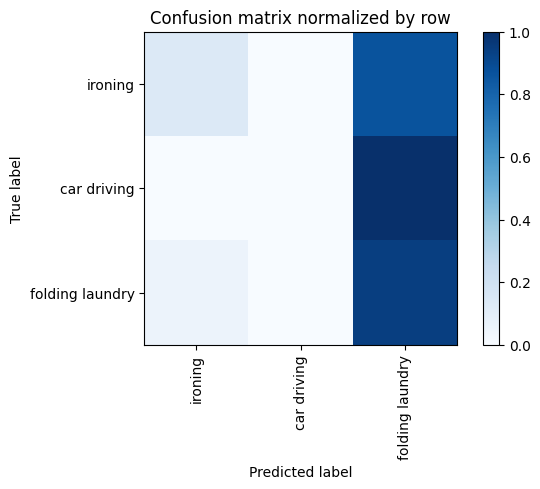

 47%|████▋     | 9/19 [23:51<26:41, 160.13s/it]

Overall accuracy: 0.321

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.853      0.135      0.233      0.607       2331|	 folding laundry: 0.864,	car driving: 0.001,	
folding laundry       0.265      0.944      0.413      0.253        972|	 ironing: 0.056,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.585      0.321      0.246        1.0       3840|	      

{'accuracy': 0.32083333333333336, 'precision': 0.37260472789541826, 'recall': 0.3597168597168597, 'f1': 0.21533536664876685}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.75batch/s]


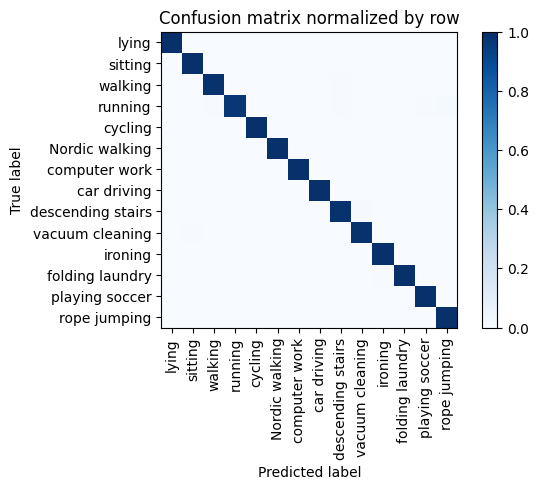

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.19batch/s]


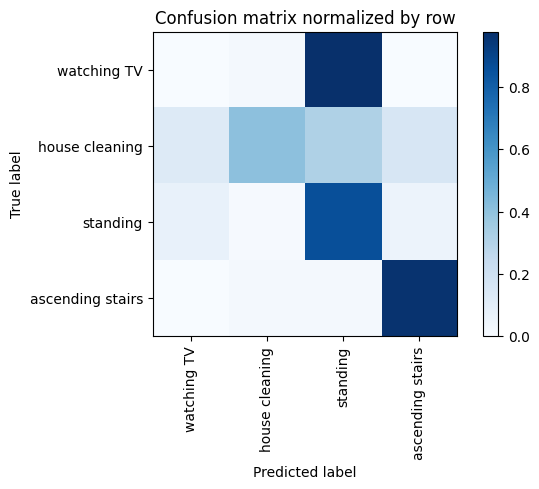

Overall accuracy: 0.604

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.531      0.862      0.657      0.330       1839|	 watching TV: 0.072,	ascending stairs: 0.057,	
  house cleaning       0.931      0.407      0.566      0.329       1830|	 standing: 0.314,	ascending stairs: 0.155,	
ascending stairs       0.726      0.963      0.828      0.193       1073|	 standing: 0.019,	house cleaning: 0.019,	
     watching TV       0.000      0.000      0.000      0.148        826|	 standing: 0.977,	house cleaning: 0.022,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.621      0.604      0.563        1.0       5568|	      

{'accuracy': 0.6038074712643678, 'precision': 0.5470595820825221, 'recall': 0.5577900440986562, 'f1': 0.5127273672860378}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.28batch/s]


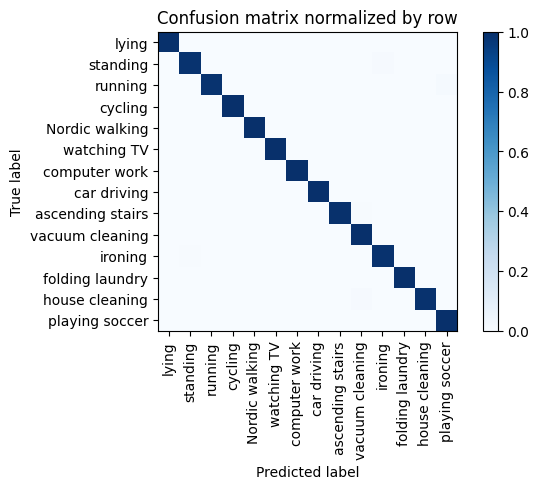

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.47batch/s]


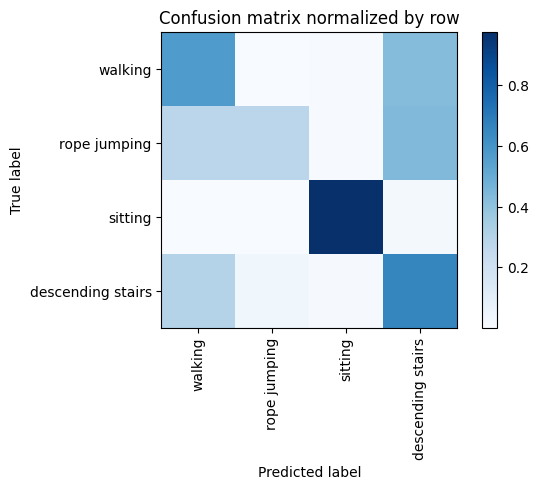

Overall accuracy: 0.692

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.762      0.569      0.652      0.421       2319|	 descending stairs: 0.426,	sitting: 0.005,	
          sitting       0.988      0.977      0.982      0.324       1785|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.334      0.654      0.443      0.171        942|	 walking: 0.300,	rope jumping: 0.037,	
     rope jumping       0.774      0.277      0.408      0.083        458|	 descending stairs: 0.439,	walking: 0.277,	

----------------------------------------------------------------------------------------------------
      avg / total       0.763      0.692      0.703        1.0       5504|	      

{'accuracy': 0.6916787790697675, 'precision': 0.7146191334346045, 'recall': 0.6193655171651341, 'f1': 0.6212095808712956}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.23batch/s]


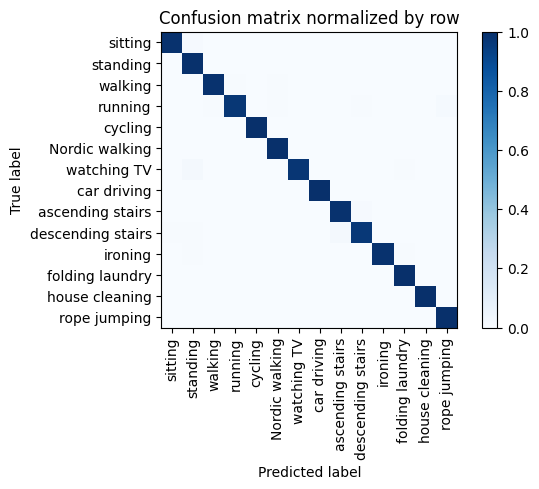

Overall accuracy: 0.992




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.19batch/s]


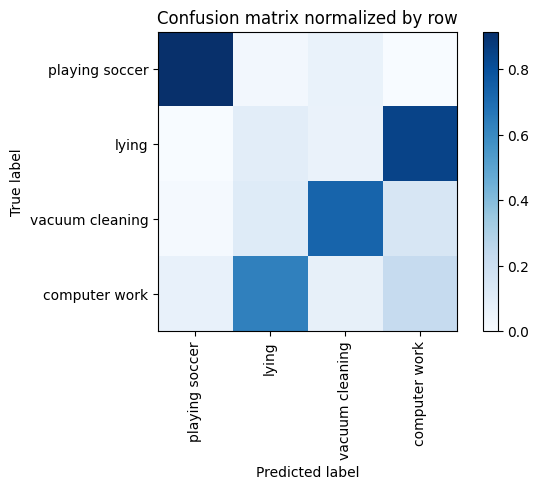

Overall accuracy: 0.356

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.274      0.226      0.247      0.432       3068|	 lying: 0.631,	vacuum cleaning: 0.074,	
          lying       0.076      0.094      0.084      0.264       1876|	 computer work: 0.843,	vacuum cleaning: 0.059,	
vacuum cleaning       0.772      0.729      0.750      0.240       1705|	 computer work: 0.149,	lying: 0.111,	
 playing soccer       0.638      0.914      0.752      0.064        455|	 vacuum cleaning: 0.062,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.365      0.356      0.357        1.0       7104|	      

{'accuracy': 0.35585585585585583, 'precision': 0.4400779003194165, 'recall': 0.4908054398577113, 'f1': 0.4583279554518521}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.37batch/s]


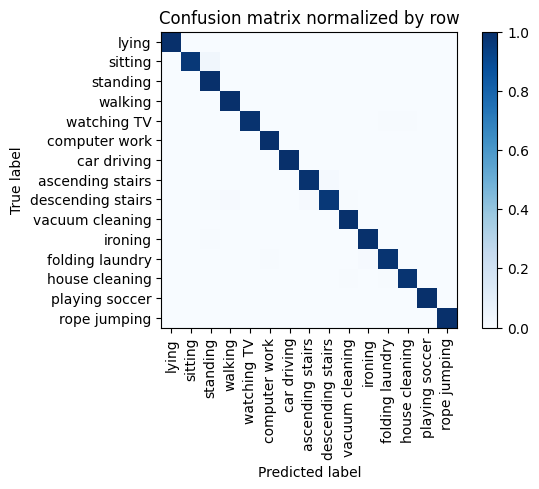

Overall accuracy: 0.991




unseen: 100%|██████████| 68/68 [00:05<00:00, 13.31batch/s]


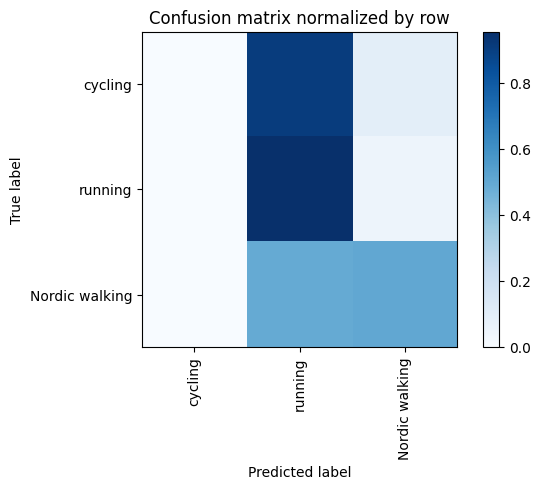

Overall accuracy: 0.417

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.828      0.506      0.628      0.421       1833|	 running: 0.494,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1588|	 running: 0.906,	Nordic walking: 0.094,	
       running       0.275      0.954      0.427      0.214        931|	 Nordic walking: 0.046,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.407      0.417      0.356        1.0       4352|	      

{'accuracy': 0.4170496323529412, 'precision': 0.36747701555869866, 'recall': 0.48651380614266554, 'f1': 0.35148384015115836}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.45batch/s]


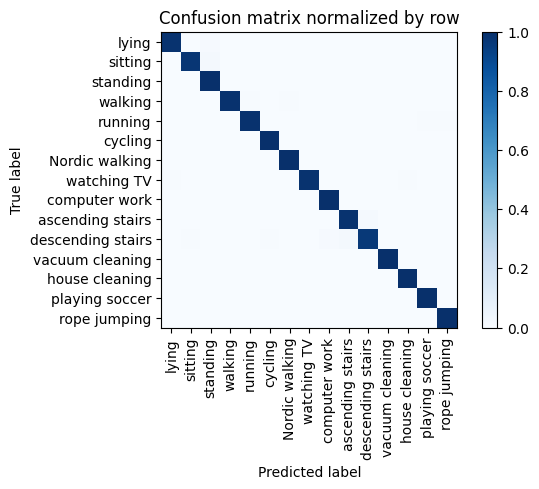

Overall accuracy: 0.992




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.22batch/s]


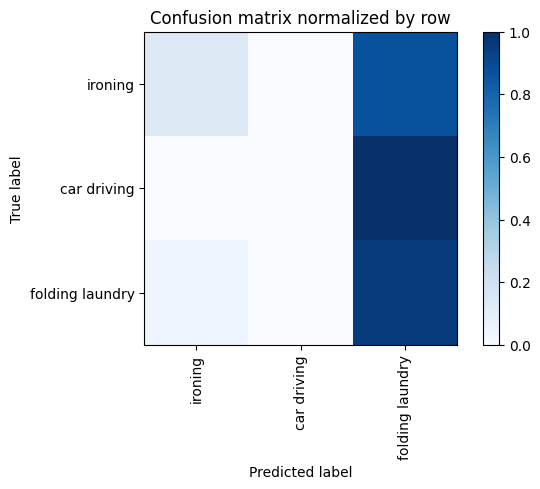

 53%|█████▎    | 10/19 [26:34<24:07, 160.80s/it]

Overall accuracy: 0.318

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.867      0.126      0.220      0.607       2332|	 folding laundry: 0.873,	car driving: 0.000,	
folding laundry       0.265      0.954      0.414      0.253        971|	 ironing: 0.046,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.594      0.318      0.238        1.0       3840|	      

{'accuracy': 0.3177083333333333, 'precision': 0.3772760219131901, 'recall': 0.3599093552943892, 'f1': 0.21145575813492293}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.37batch/s]


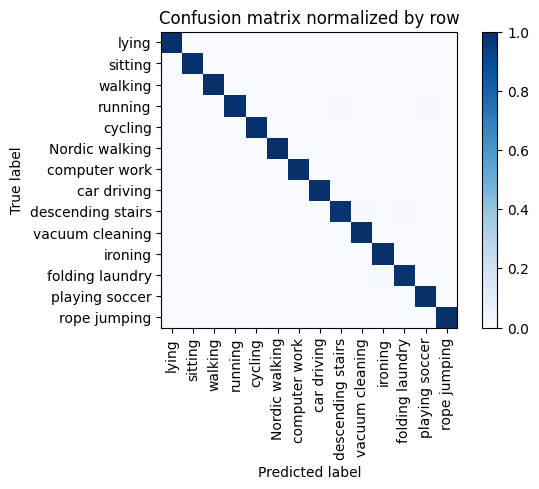

Overall accuracy: 0.997




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.52batch/s]


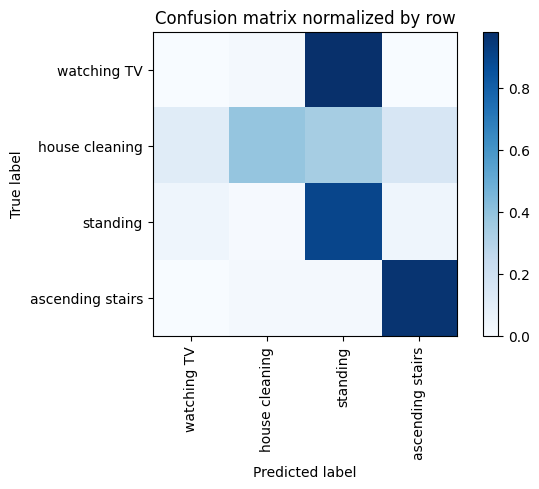

Overall accuracy: 0.611

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.533      0.901      0.669      0.331       1842|	 watching TV: 0.046,	ascending stairs: 0.045,	
  house cleaning       0.937      0.387      0.548      0.329       1830|	 standing: 0.343,	ascending stairs: 0.156,	
ascending stairs       0.737      0.964      0.835      0.193       1072|	 standing: 0.019,	house cleaning: 0.018,	
     watching TV       0.000      0.000      0.000      0.148        824|	 standing: 0.982,	house cleaning: 0.017,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.626      0.611      0.562        1.0       5568|	      

{'accuracy': 0.6109913793103449, 'precision': 0.5514899342224888, 'recall': 0.5630613627343073, 'f1': 0.5131749852171902}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.42batch/s]


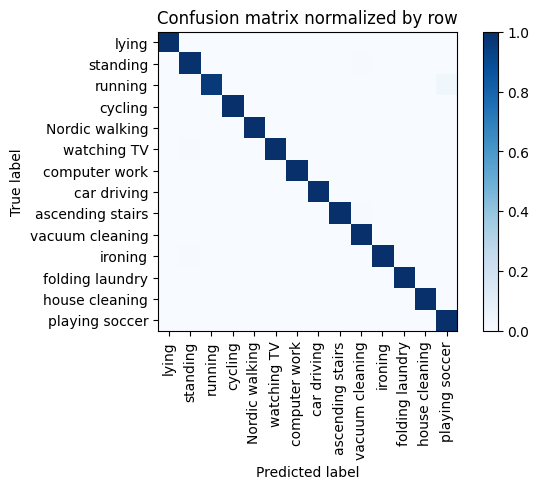

Overall accuracy: 0.996




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.25batch/s]


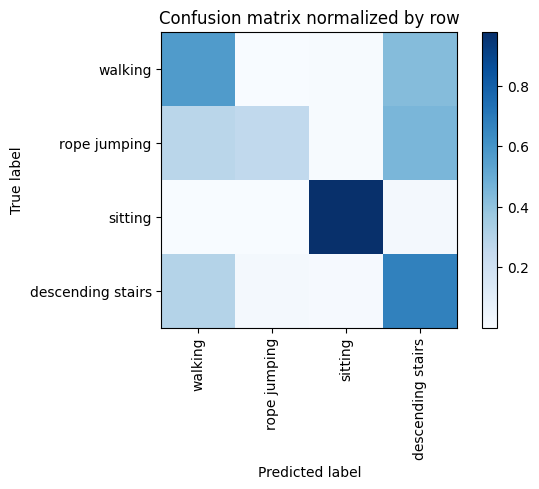

Overall accuracy: 0.692

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.760      0.567      0.649      0.420       2314|	 descending stairs: 0.428,	sitting: 0.005,	
          sitting       0.988      0.978      0.983      0.325       1789|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.339      0.669      0.450      0.172        945|	 walking: 0.301,	rope jumping: 0.022,	
     rope jumping       0.837      0.259      0.395      0.083        456|	 descending stairs: 0.452,	walking: 0.283,	

----------------------------------------------------------------------------------------------------
      avg / total       0.768      0.692      0.702        1.0       5504|	      

{'accuracy': 0.692405523255814, 'precision': 0.730757491710006, 'recall': 0.6180449292822521, 'f1': 0.6192651095485562}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'No

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.54batch/s]


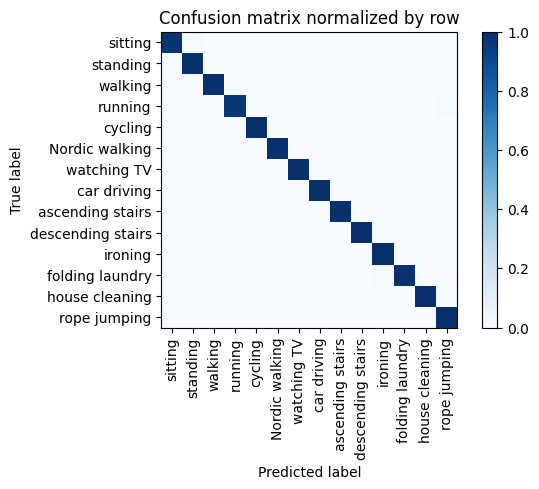

Overall accuracy: 0.994




unseen: 100%|██████████| 111/111 [00:08<00:00, 13.70batch/s]


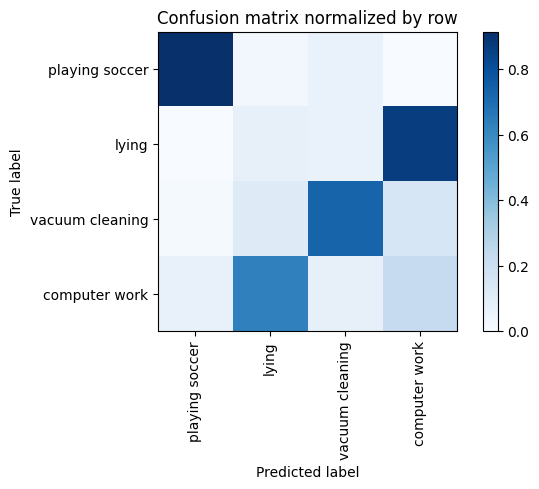

Overall accuracy: 0.352

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.273      0.228      0.248      0.432       3069|	 lying: 0.630,	vacuum cleaning: 0.073,	
          lying       0.061      0.074      0.067      0.264       1875|	 computer work: 0.862,	vacuum cleaning: 0.061,	
vacuum cleaning       0.773      0.730      0.751      0.240       1705|	 computer work: 0.145,	lying: 0.112,	
 playing soccer       0.635      0.914      0.750      0.064        455|	 vacuum cleaning: 0.062,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.360      0.352      0.353        1.0       7104|	      

{'accuracy': 0.35177364864864863, 'precision': 0.43555143956223025, 'recall': 0.4865964530093562, 'f1': 0.4539692542769766}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.38batch/s]


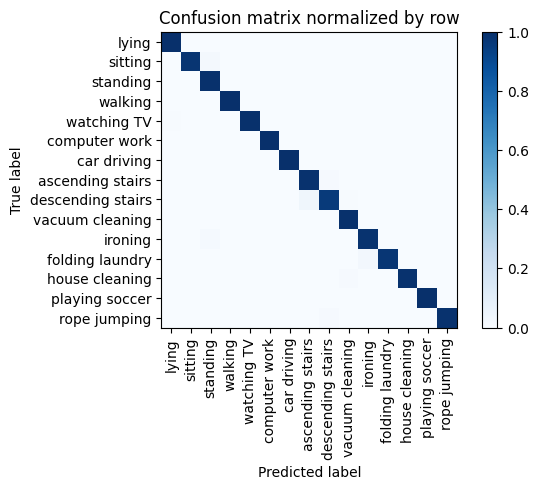

Overall accuracy: 0.991




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.33batch/s]


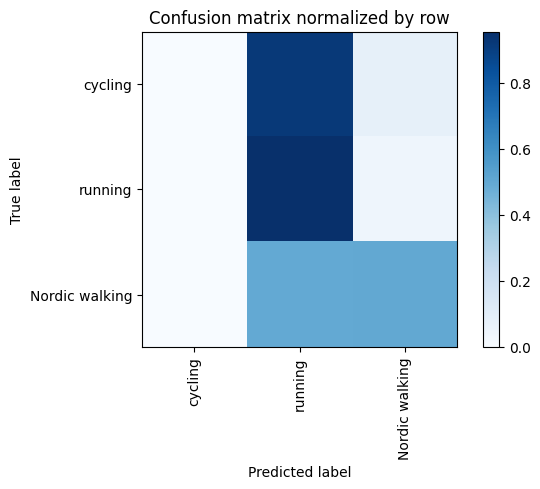

Overall accuracy: 0.416

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.845      0.501      0.629      0.418       1820|	 running: 0.499,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1593|	 running: 0.921,	Nordic walking: 0.079,	
       running       0.274      0.956      0.426      0.216        939|	 Nordic walking: 0.044,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.413      0.416      0.355        1.0       4352|	      

{'accuracy': 0.41590073529411764, 'precision': 0.3731976957159999, 'recall': 0.4858118097734711, 'f1': 0.351861078816734}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.38batch/s]


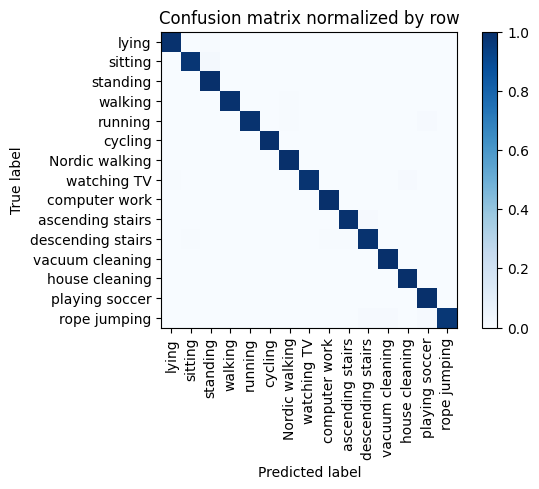

Overall accuracy: 0.993




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.42batch/s]


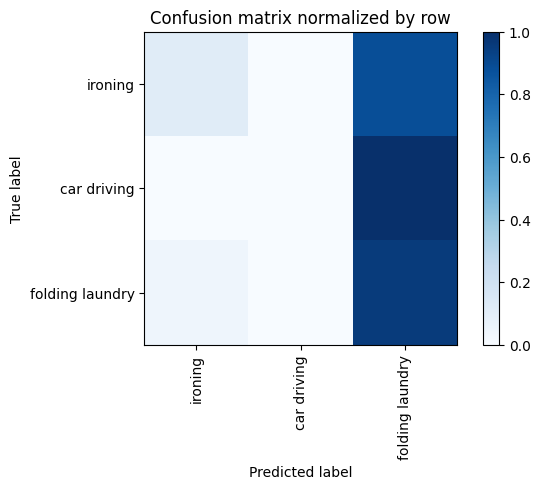

 58%|█████▊    | 11/19 [29:15<21:27, 160.96s/it]

Overall accuracy: 0.313

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.866      0.116      0.205      0.607       2330|	 folding laundry: 0.883,	car driving: 0.000,	
folding laundry       0.264      0.957      0.414      0.253        972|	 ironing: 0.043,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.592      0.313      0.229        1.0       3840|	      

{'accuracy': 0.31276041666666665, 'precision': 0.3765232198722166, 'recall': 0.3576997121107755, 'f1': 0.20619570497861717}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.45batch/s]


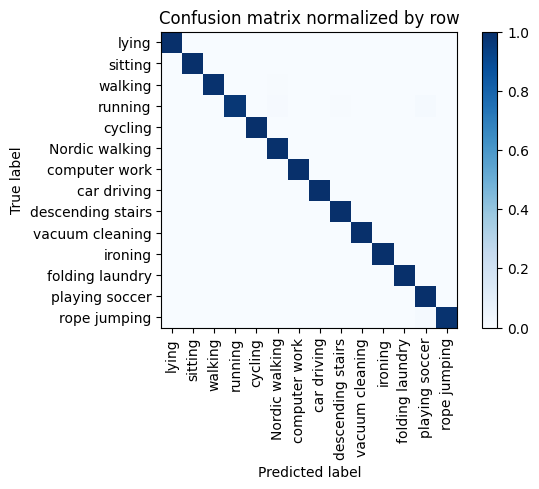

Overall accuracy: 0.995




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.19batch/s]


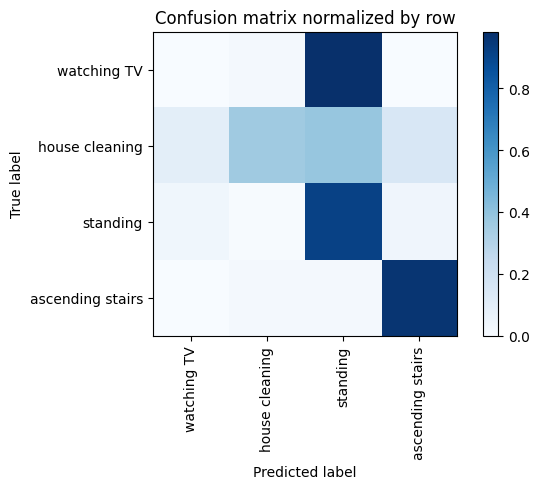

Overall accuracy: 0.607

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.522      0.916      0.665      0.330       1839|	 ascending stairs: 0.039,	watching TV: 0.038,	
  house cleaning       0.935      0.364      0.524      0.329       1830|	 standing: 0.386,	ascending stairs: 0.152,	
ascending stairs       0.746      0.961      0.840      0.193       1073|	 standing: 0.021,	house cleaning: 0.018,	
     watching TV       0.000      0.000      0.000      0.148        826|	 standing: 0.983,	house cleaning: 0.016,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.624      0.607      0.554        1.0       5568|	      

{'accuracy': 0.6072198275862069, 'precision': 0.5508960153886664, 'recall': 0.5601267244741913, 'f1': 0.5072505685780864}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.48batch/s]


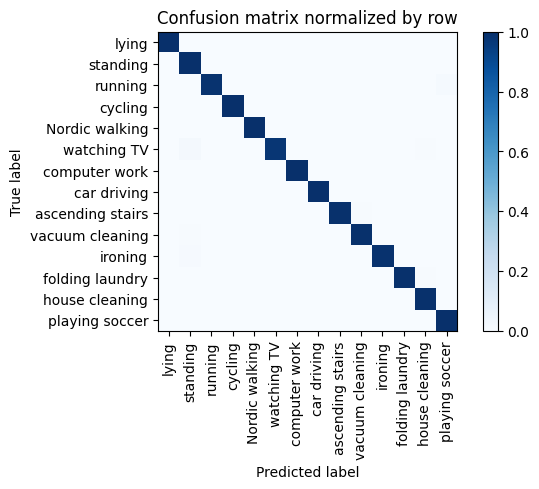

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.52batch/s]


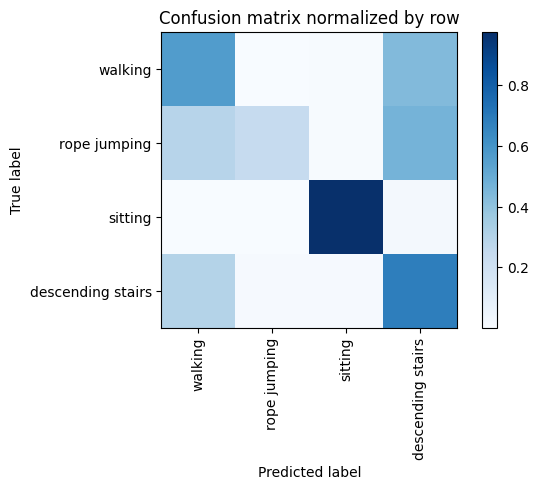

Overall accuracy: 0.690

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.757      0.562      0.645      0.421       2317|	 descending stairs: 0.433,	sitting: 0.005,	
          sitting       0.988      0.977      0.982      0.325       1787|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.338      0.680      0.452      0.171        942|	 walking: 0.301,	rope jumping: 0.010,	
     rope jumping       0.910      0.242      0.383      0.083        458|	 descending stairs: 0.463,	walking: 0.288,	

----------------------------------------------------------------------------------------------------
      avg / total       0.773      0.690      0.700        1.0       5504|	      

{'accuracy': 0.690406976744186, 'precision': 0.7482016352140874, 'recall': 0.6154538059867597, 'f1': 0.6155289190919047}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.33batch/s]


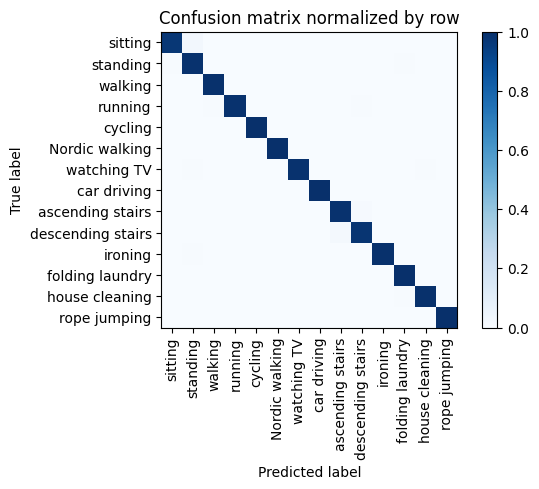

Overall accuracy: 0.992




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.20batch/s]


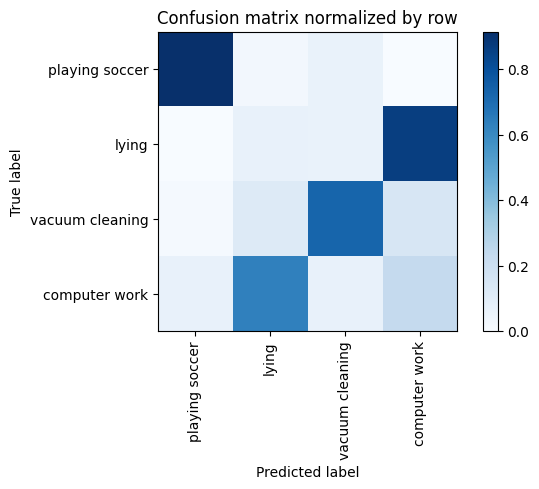

Overall accuracy: 0.350

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.274      0.229      0.249      0.432       3070|	 lying: 0.630,	vacuum cleaning: 0.071,	
          lying       0.058      0.070      0.064      0.264       1874|	 computer work: 0.862,	vacuum cleaning: 0.064,	
vacuum cleaning       0.771      0.726      0.748      0.240       1702|	 computer work: 0.146,	lying: 0.116,	
 playing soccer       0.634      0.915      0.749      0.064        458|	 vacuum cleaning: 0.061,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.359      0.350      0.352        1.0       7104|	      

{'accuracy': 0.35036599099099097, 'precision': 0.4341768600516784, 'recall': 0.4849729693891045, 'f1': 0.45238255151415263}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.27batch/s]


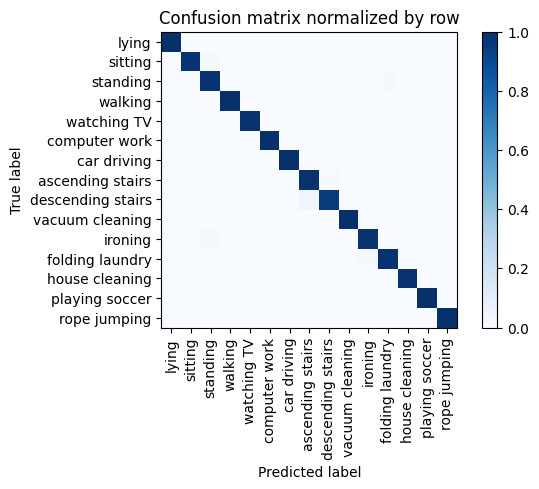

Overall accuracy: 0.991




unseen: 100%|██████████| 68/68 [00:05<00:00, 13.21batch/s]


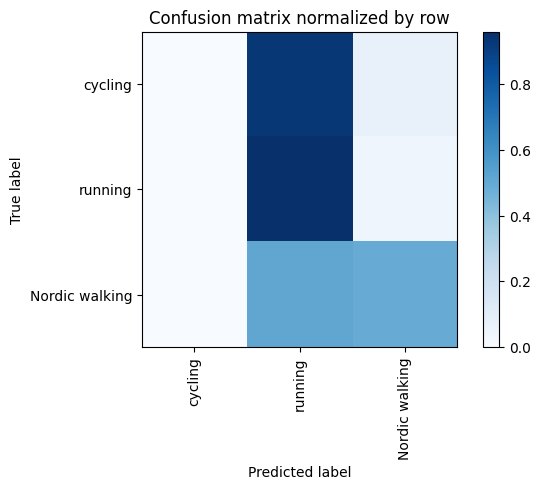

Overall accuracy: 0.412

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.857      0.490      0.624      0.418       1819|	 running: 0.510,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1593|	 running: 0.931,	Nordic walking: 0.069,	
       running       0.272      0.959      0.424      0.216        940|	 Nordic walking: 0.041,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.417      0.412      0.352        1.0       4352|	      

{'accuracy': 0.41199448529411764, 'precision': 0.37633054046163084, 'recall': 0.4829633225332288, 'f1': 0.3492254941796226}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.43batch/s]


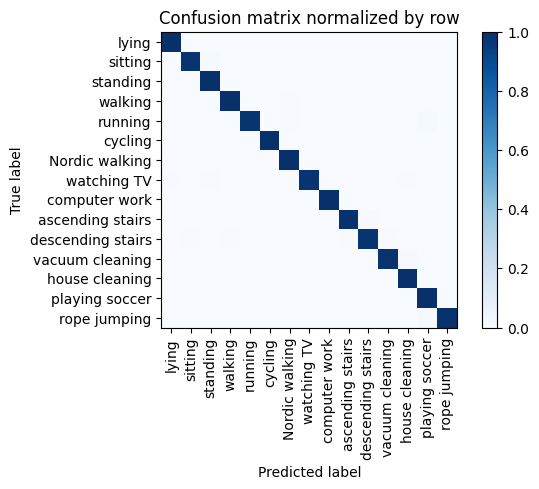

Overall accuracy: 0.993




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.90batch/s]


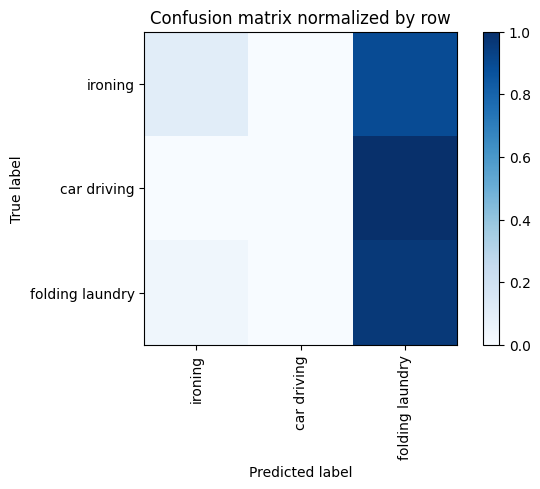

 63%|██████▎   | 12/19 [31:57<18:48, 161.15s/it]

Overall accuracy: 0.309

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.873      0.109      0.194      0.608       2333|	 folding laundry: 0.891,	car driving: 0.000,	
folding laundry       0.263      0.962      0.413      0.253        971|	 ironing: 0.038,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.597      0.309      0.222        1.0       3840|	      

{'accuracy': 0.309375, 'precision': 0.37869971111291906, 'recall': 0.35692254991848915, 'f1': 0.2023211166223191}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.22batch/s]


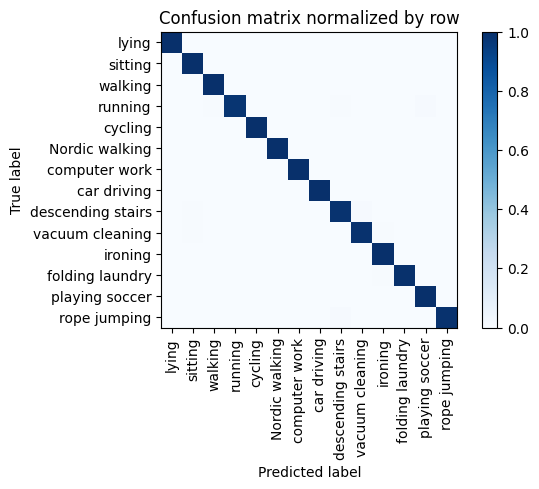

Overall accuracy: 0.996




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.62batch/s]


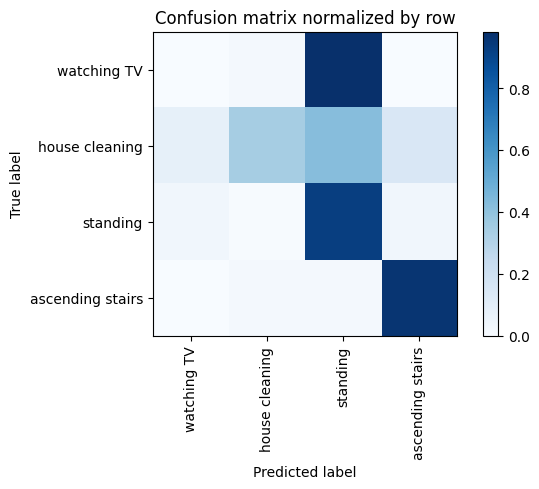

Overall accuracy: 0.606

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.516      0.927      0.663      0.331       1845|	 watching TV: 0.034,	ascending stairs: 0.031,	
  house cleaning       0.932      0.344      0.502      0.328       1829|	 standing: 0.424,	ascending stairs: 0.149,	
ascending stairs       0.757      0.960      0.847      0.193       1076|	 standing: 0.022,	house cleaning: 0.018,	
     watching TV       0.000      0.000      0.000      0.147        818|	 standing: 0.983,	house cleaning: 0.016,	ascending stairs: 0.001,	

----------------------------------------------------------------------------------------------------
     avg / total       0.624      0.606      0.548        1.0       5568|	      

{'accuracy': 0.6057830459770115, 'precision': 0.5513694345745566, 'recall': 0.5578280552468087, 'f1': 0.5031060800052288}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.37batch/s]


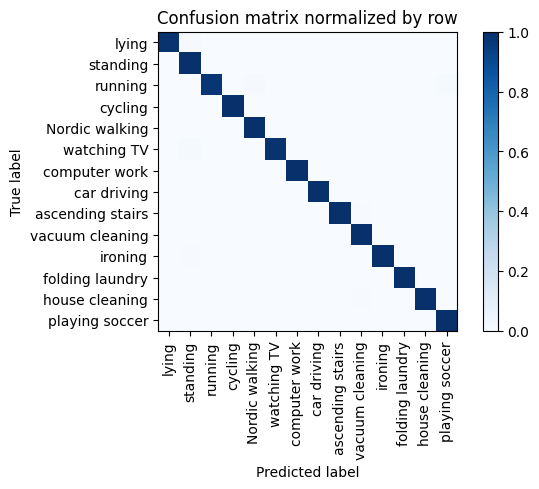

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.13batch/s]


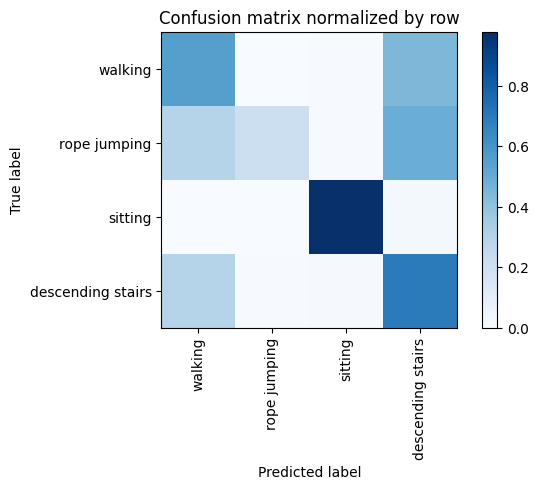

Overall accuracy: 0.687

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.755      0.553      0.638      0.420       2309|	 descending stairs: 0.443,	sitting: 0.004,	
          sitting       0.988      0.978      0.983      0.326       1793|	 descending stairs: 0.021,	walking: 0.001,	
descending stairs       0.338      0.693      0.454      0.172        945|	 walking: 0.294,	sitting: 0.008,	
     rope jumping       0.960      0.210      0.345      0.083        457|	 descending stairs: 0.490,	walking: 0.293,	

----------------------------------------------------------------------------------------------------
      avg / total       0.776      0.687      0.694        1.0       5504|	      

{'accuracy': 0.6867732558139535, 'precision': 0.7602051991903218, 'recall': 0.6083746352921618, 'f1': 0.6049587237205679}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.41batch/s]


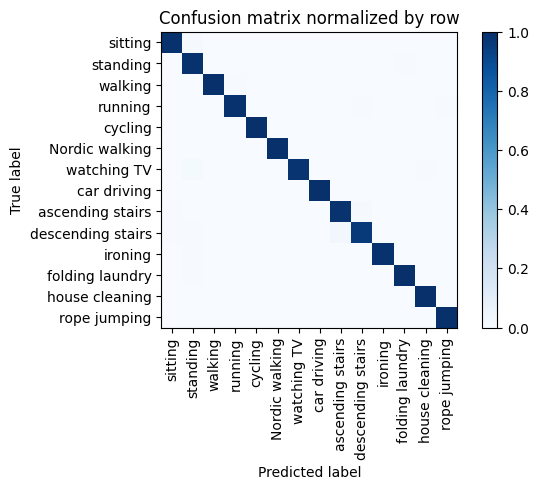

Overall accuracy: 0.992




unseen: 100%|██████████| 111/111 [00:08<00:00, 13.81batch/s]


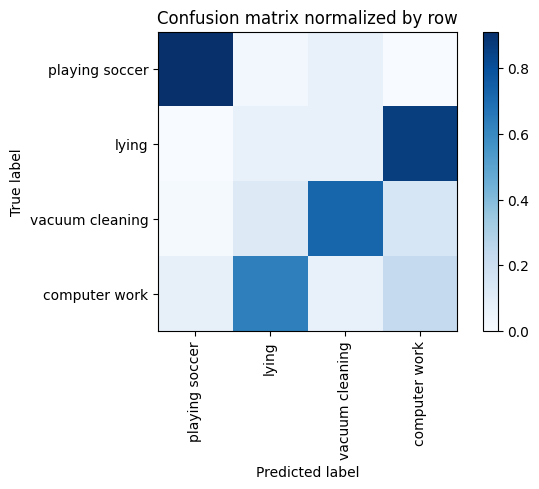

Overall accuracy: 0.350

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.274      0.229      0.250      0.431       3064|	 lying: 0.632,	playing soccer: 0.071,	
          lying       0.057      0.070      0.063      0.264       1875|	 computer work: 0.862,	vacuum cleaning: 0.065,	
vacuum cleaning       0.774      0.722      0.747      0.240       1707|	 computer work: 0.144,	lying: 0.120,	
 playing soccer       0.628      0.910      0.743      0.064        458|	 vacuum cleaning: 0.066,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.360      0.350      0.352        1.0       7104|	      

{'accuracy': 0.34966216216216217, 'precision': 0.4334706460635201, 'recall': 0.48302637942793886, 'f1': 0.45089363530204596}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.68batch/s]


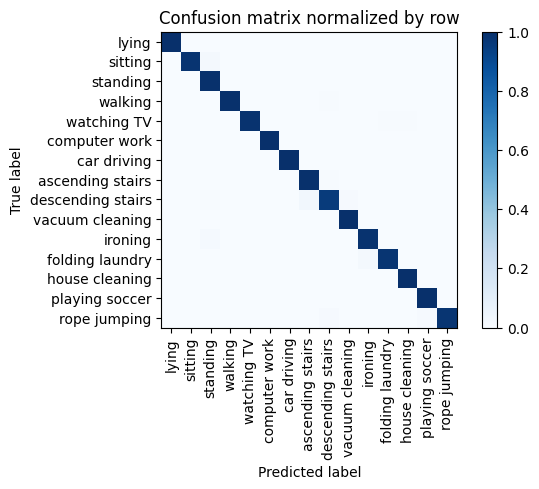

Overall accuracy: 0.992




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.02batch/s]


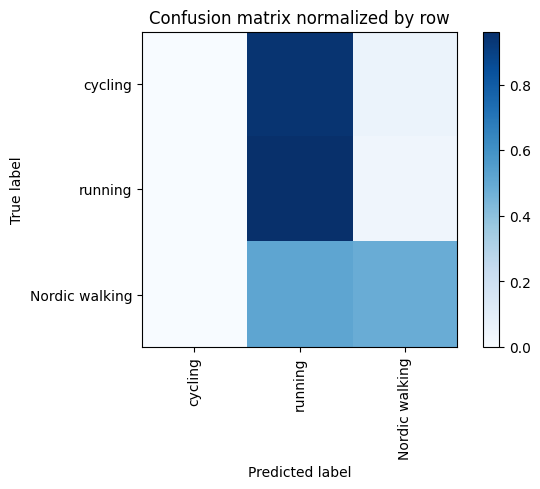

Overall accuracy: 0.411

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.874      0.485      0.624      0.418       1819|	 running: 0.515,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1591|	 running: 0.943,	Nordic walking: 0.057,	
       running       0.271      0.961      0.422      0.216        942|	 Nordic walking: 0.039,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.424      0.411      0.352        1.0       4352|	      

{'accuracy': 0.41061580882352944, 'precision': 0.38161591048990634, 'recall': 0.48186789051791523, 'f1': 0.34872203673109436}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.51batch/s]


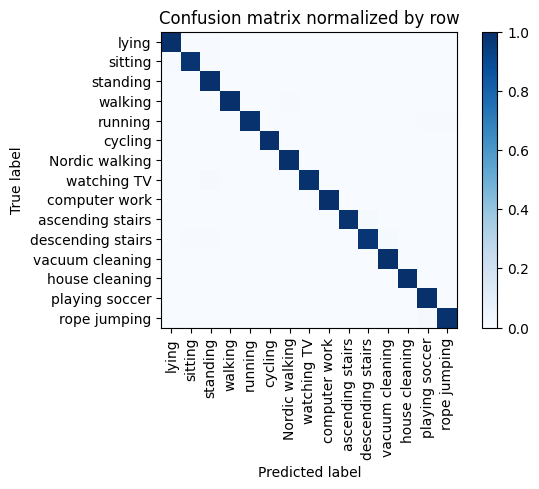

Overall accuracy: 0.994




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.13batch/s]


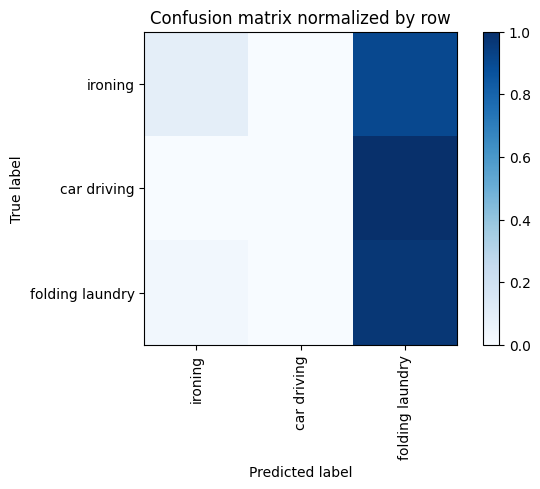

 68%|██████▊   | 13/19 [34:39<16:09, 161.64s/it]

Overall accuracy: 0.303

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.884      0.095      0.172      0.607       2331|	 folding laundry: 0.904,	car driving: 0.000,	
folding laundry       0.262      0.970      0.413      0.253        970|	 ironing: 0.030,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        539|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.603      0.303      0.209        1.0       3840|	      

{'accuracy': 0.3028645833333333, 'precision': 0.3822417502046811, 'recall': 0.3551137293405335, 'f1': 0.19495337201881544}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.46batch/s]


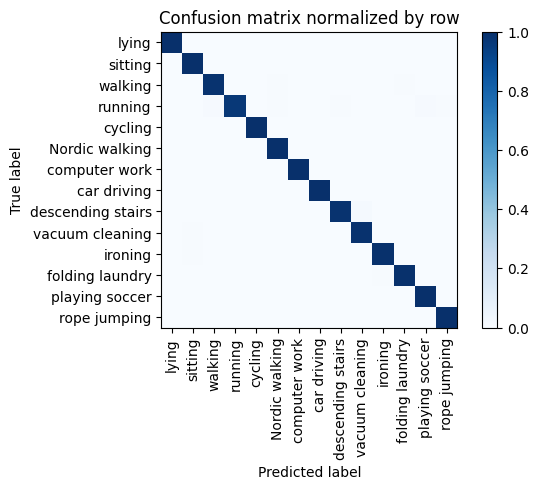

Overall accuracy: 0.994




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.28batch/s]


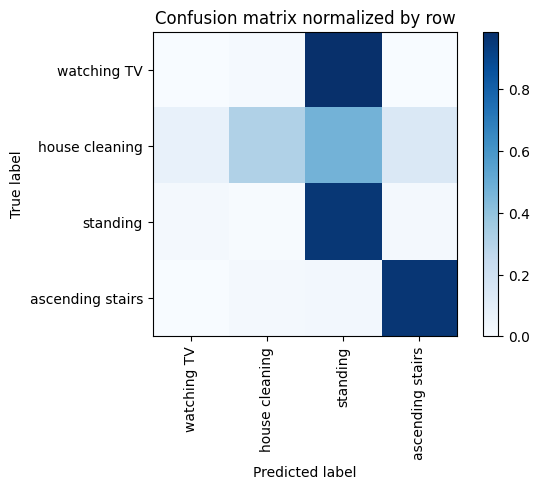

Overall accuracy: 0.604

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.508      0.957      0.664      0.331       1841|	 watching TV: 0.022,	ascending stairs: 0.016,	
  house cleaning       0.935      0.313      0.469      0.329       1832|	 standing: 0.473,	ascending stairs: 0.141,	
ascending stairs       0.780      0.960      0.861      0.192       1070|	 standing: 0.023,	house cleaning: 0.017,	
     watching TV       0.000      0.000      0.000      0.148        825|	 standing: 0.985,	house cleaning: 0.015,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.626      0.604      0.539        1.0       5568|	      

{'accuracy': 0.6036278735632183, 'precision': 0.5558051896489596, 'recall': 0.5572828414153104, 'f1': 0.4983046061338542}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.14batch/s]


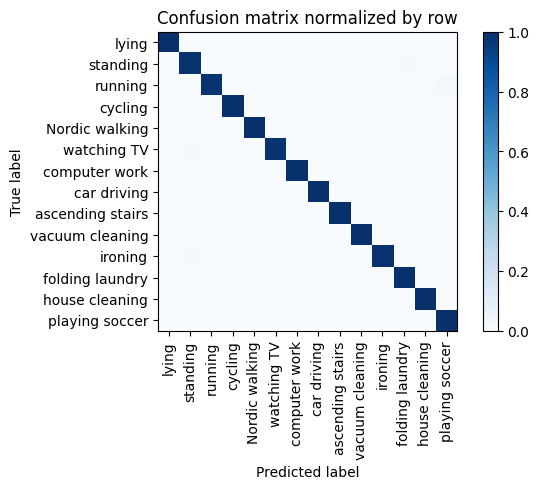

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.28batch/s]


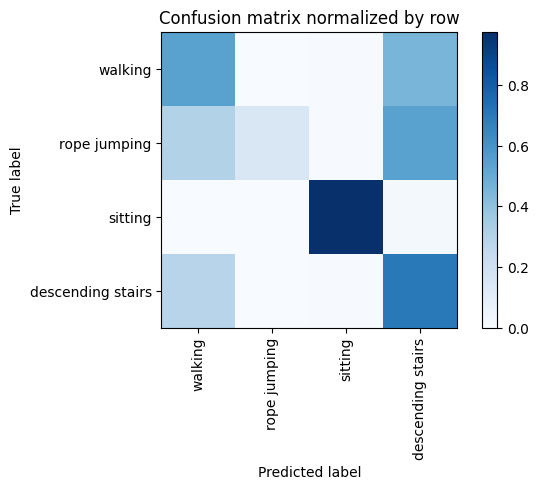

Overall accuracy: 0.678

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.751      0.541      0.629      0.421       2317|	 descending stairs: 0.454,	sitting: 0.004,	
          sitting       0.989      0.977      0.983      0.325       1791|	 descending stairs: 0.022,	walking: 0.002,	
descending stairs       0.330      0.701      0.449      0.171        941|	 walking: 0.289,	sitting: 0.007,	
     rope jumping       0.971      0.147      0.256      0.083        455|	 descending stairs: 0.538,	walking: 0.308,	

----------------------------------------------------------------------------------------------------
      avg / total       0.775      0.678      0.683        1.0       5504|	      

{'accuracy': 0.6776889534883721, 'precision': 0.7603881316281901, 'recall': 0.591600190271767, 'f1': 0.5791992240689876}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.27batch/s]


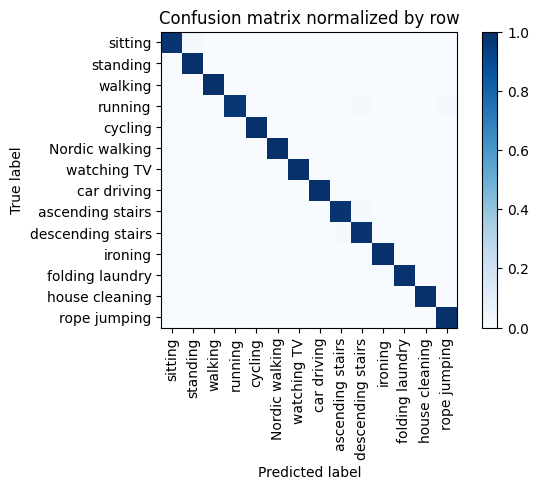

Overall accuracy: 0.993




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.05batch/s]


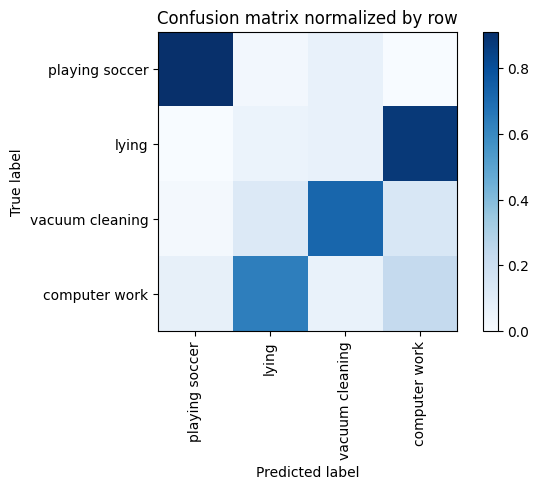

Overall accuracy: 0.345

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.272      0.229      0.248      0.432       3070|	 lying: 0.636,	playing soccer: 0.072,	
          lying       0.046      0.056      0.051      0.264       1874|	 computer work: 0.876,	vacuum cleaning: 0.066,	
vacuum cleaning       0.780      0.721      0.749      0.240       1702|	 computer work: 0.142,	lying: 0.123,	
 playing soccer       0.623      0.910      0.740      0.064        458|	 vacuum cleaning: 0.066,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.357      0.345      0.348        1.0       7104|	      

{'accuracy': 0.3450168918918919, 'precision': 0.43016152149187625, 'recall': 0.4790228239514239, 'f1': 0.4470029970372653}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.40batch/s]


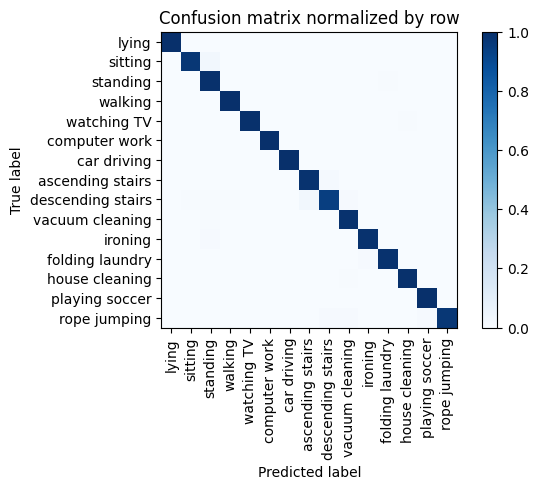

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.02batch/s]


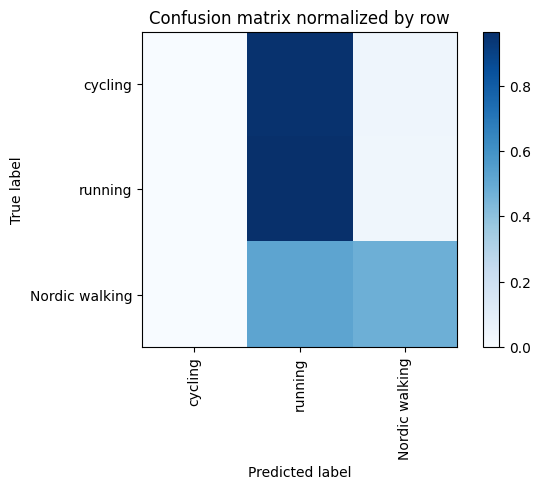

Overall accuracy: 0.409

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.894      0.476      0.622      0.421       1831|	 running: 0.524,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1582|	 running: 0.956,	Nordic walking: 0.044,	
       running       0.268      0.965      0.420      0.216        939|	 Nordic walking: 0.035,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.434      0.409      0.352        1.0       4352|	      

{'accuracy': 0.4085477941176471, 'precision': 0.38754814494228174, 'recall': 0.4803662401581101, 'f1': 0.34711949393054425}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.28batch/s]


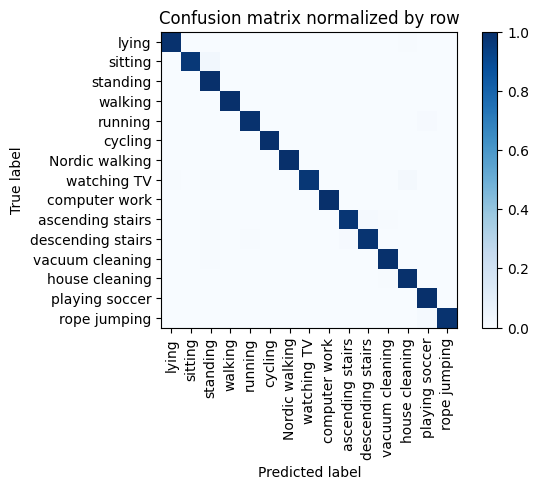

Overall accuracy: 0.991




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.18batch/s]


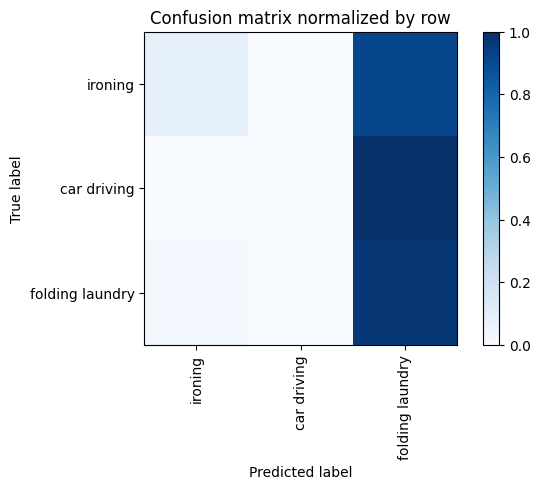

 74%|███████▎  | 14/19 [37:23<13:30, 162.16s/it]

Overall accuracy: 0.300

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.880      0.088      0.160      0.607       2329|	 folding laundry: 0.912,	car driving: 0.000,	
folding laundry       0.262      0.971      0.413      0.254        974|	 ironing: 0.029,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.600      0.300      0.202        1.0       3840|	      

{'accuracy': 0.29973958333333334, 'precision': 0.38069871292229823, 'recall': 0.3530910588129495, 'f1': 0.19101382845786855}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.25batch/s]


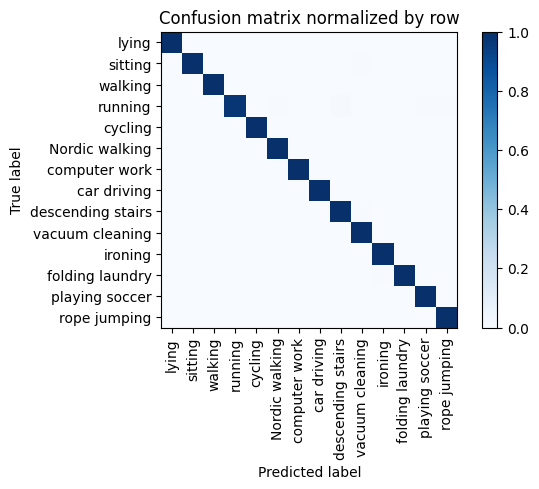

Overall accuracy: 0.997




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.13batch/s]


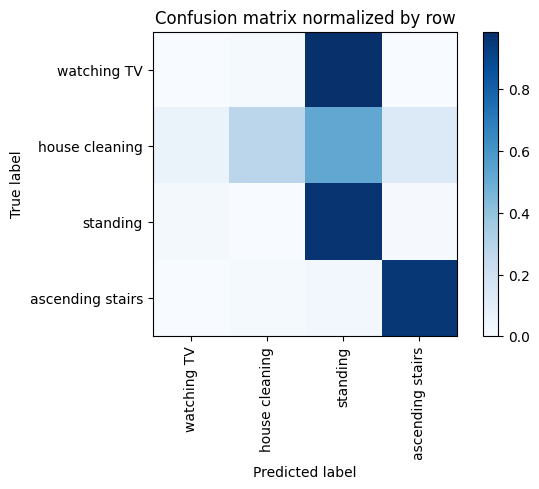

Overall accuracy: 0.596

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.497      0.967      0.656      0.330       1840|	 watching TV: 0.020,	ascending stairs: 0.010,	
  house cleaning       0.943      0.280      0.432      0.329       1830|	 standing: 0.524,	ascending stairs: 0.133,	
ascending stairs       0.797      0.958      0.870      0.193       1073|	 standing: 0.028,	house cleaning: 0.014,	
     watching TV       0.000      0.000      0.000      0.148        825|	 standing: 0.987,	house cleaning: 0.013,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.628      0.596      0.526        1.0       5568|	      

{'accuracy': 0.5962643678160919, 'precision': 0.5591498461256035, 'recall': 0.5513085587246253, 'f1': 0.48951622489654323}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runn

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.48batch/s]


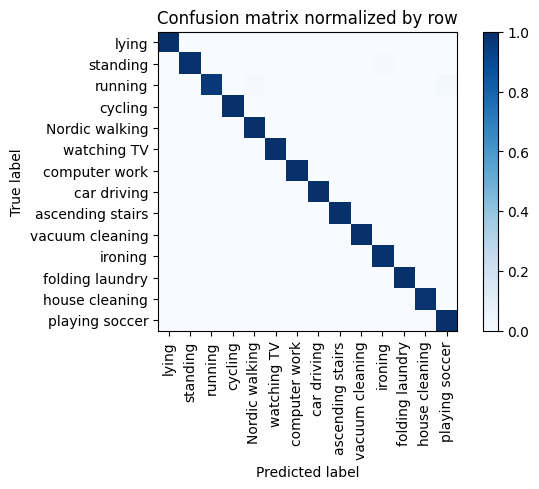

Overall accuracy: 0.995




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.38batch/s]


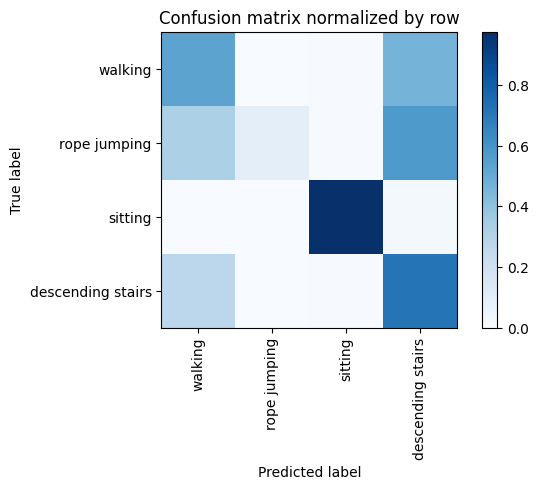

Overall accuracy: 0.673

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.750      0.533      0.623      0.422       2320|	 descending stairs: 0.463,	sitting: 0.004,	
          sitting       0.989      0.976      0.983      0.324       1782|	 descending stairs: 0.021,	walking: 0.003,	
descending stairs       0.332      0.718      0.454      0.172        947|	 walking: 0.275,	sitting: 0.007,	
     rope jumping       1.000      0.099      0.180      0.083        455|	 descending stairs: 0.574,	walking: 0.323,	

----------------------------------------------------------------------------------------------------
      avg / total       0.776      0.673      0.674        1.0       5504|	      

{'accuracy': 0.6726017441860465, 'precision': 0.76772390068483, 'recall': 0.5816446881699449, 'f1': 0.5599349497200437}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.46batch/s]


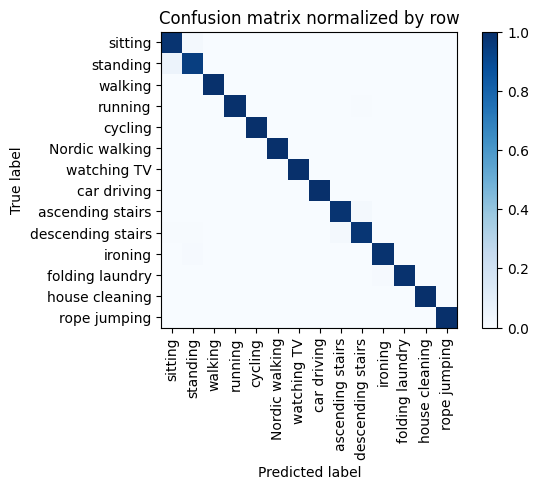

Overall accuracy: 0.988




unseen: 100%|██████████| 111/111 [00:07<00:00, 13.92batch/s]


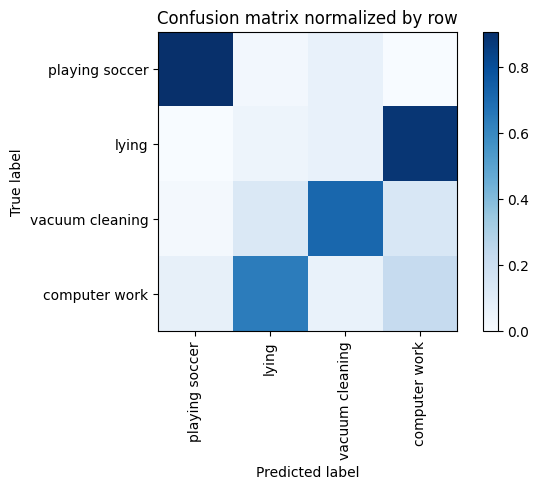

Overall accuracy: 0.340

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.268      0.227      0.246      0.432       3068|	 lying: 0.639,	playing soccer: 0.073,	
          lying       0.037      0.045      0.040      0.264       1875|	 computer work: 0.886,	vacuum cleaning: 0.067,	
vacuum cleaning       0.781      0.716      0.747      0.240       1705|	 computer work: 0.139,	lying: 0.130,	
 playing soccer       0.619      0.908      0.736      0.064        456|	 vacuum cleaning: 0.068,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.353      0.340      0.343        1.0       7104|	      

{'accuracy': 0.33980855855855857, 'precision': 0.4261425609920557, 'recall': 0.4737737866777693, 'f1': 0.4422340587176624}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 13.91batch/s]


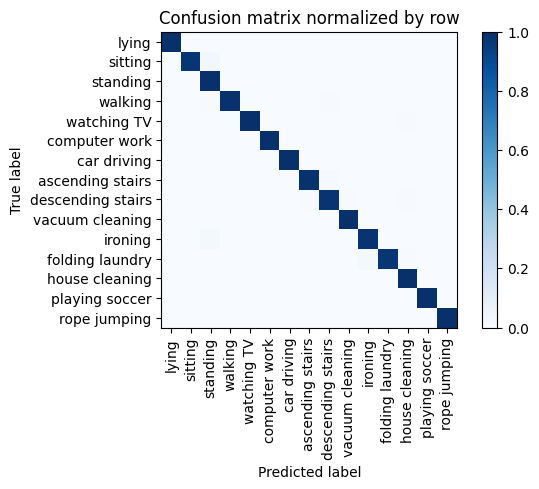

Overall accuracy: 0.992




unseen: 100%|██████████| 68/68 [00:04<00:00, 13.84batch/s]


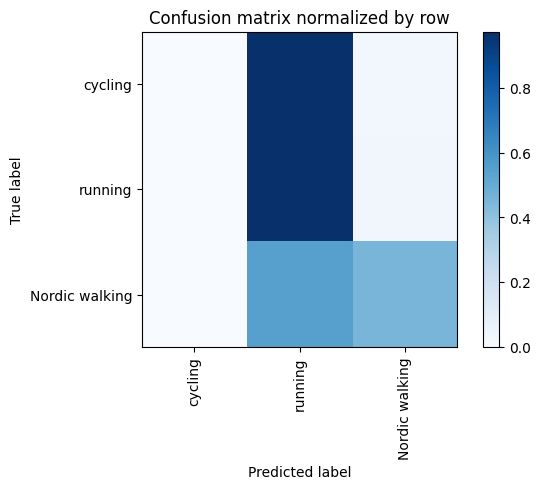

Overall accuracy: 0.399

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.918      0.455      0.608      0.419       1823|	 running: 0.545,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1592|	 running: 0.973,	Nordic walking: 0.027,	
       running       0.263      0.967      0.413      0.215        937|	 Nordic walking: 0.033,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.441      0.399      0.344        1.0       4352|	      

{'accuracy': 0.3986672794117647, 'precision': 0.3935785924970521, 'recall': 0.47388687143779057, 'f1': 0.34044995431672637}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.20batch/s]


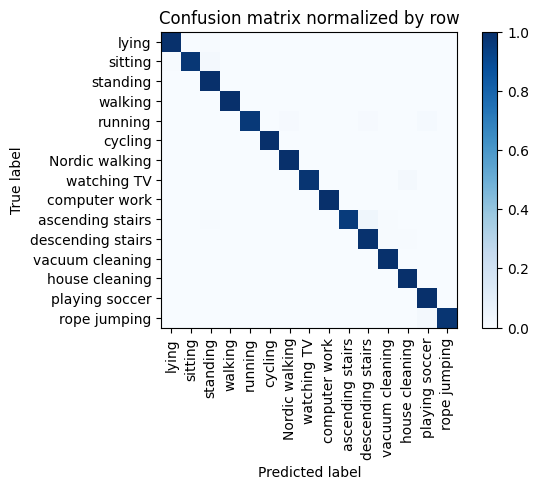

Overall accuracy: 0.991




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.23batch/s]


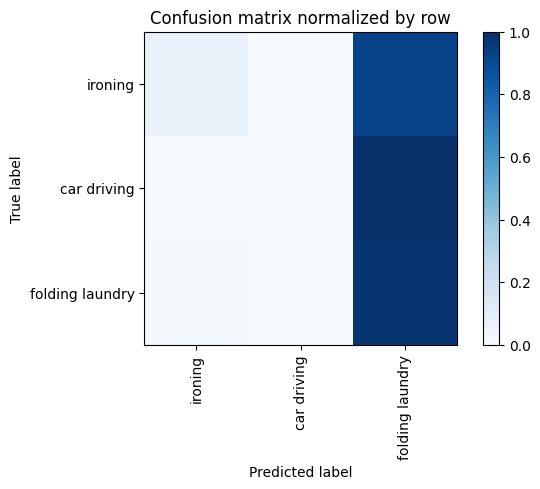

 79%|███████▉  | 15/19 [40:06<10:50, 162.56s/it]

Overall accuracy: 0.291

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.883      0.071      0.132      0.607       2331|	 folding laundry: 0.929,	car driving: 0.000,	
folding laundry       0.260      0.977      0.411      0.253        972|	 ironing: 0.023,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.602      0.291      0.184        1.0       3840|	      

{'accuracy': 0.290625, 'precision': 0.38103671941149514, 'recall': 0.3495267754527014, 'f1': 0.1808993288836446}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.17batch/s]


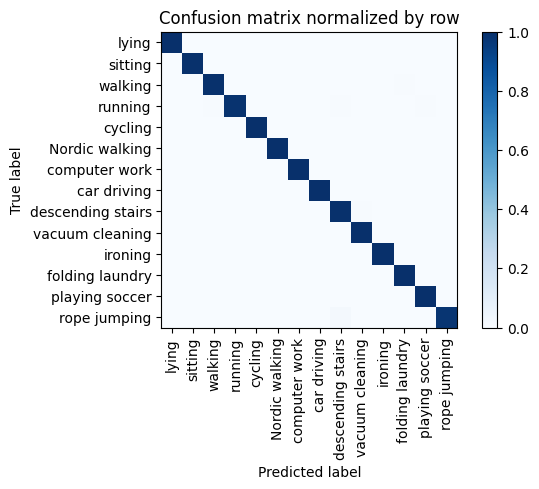

Overall accuracy: 0.997




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.93batch/s]


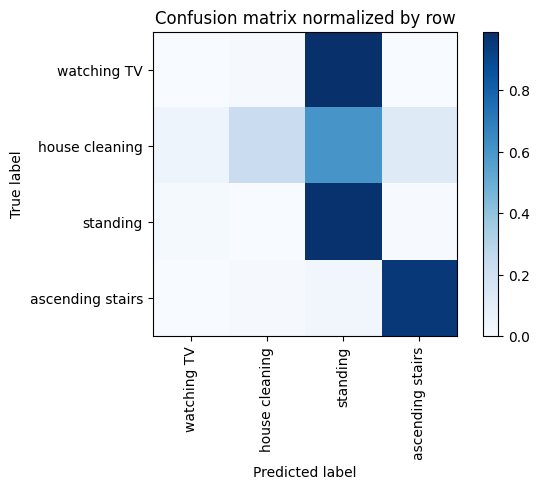

Overall accuracy: 0.581

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.479      0.979      0.643      0.330       1838|	 watching TV: 0.014,	ascending stairs: 0.006,	
  house cleaning       0.949      0.226      0.365      0.329       1831|	 standing: 0.601,	ascending stairs: 0.123,	
ascending stairs       0.812      0.956      0.878      0.192       1071|	 standing: 0.034,	house cleaning: 0.010,	
     watching TV       0.000      0.000      0.000      0.149        828|	 standing: 0.989,	house cleaning: 0.011,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.627      0.581      0.501        1.0       5568|	      

{'accuracy': 0.5811781609195402, 'precision': 0.5601434383562065, 'recall': 0.540114216758918, 'f1': 0.4715098074578269}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runnin

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.21batch/s]


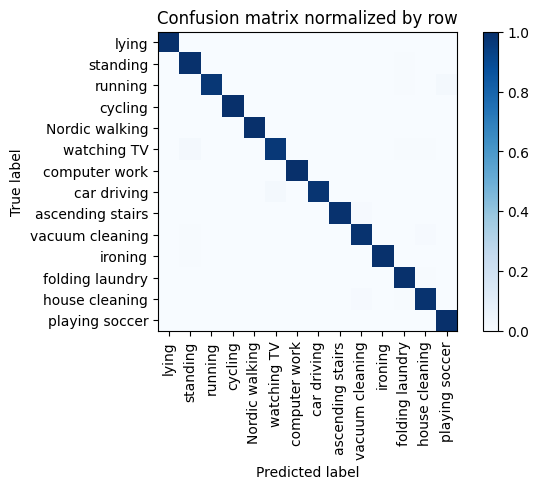

Overall accuracy: 0.993




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.01batch/s]


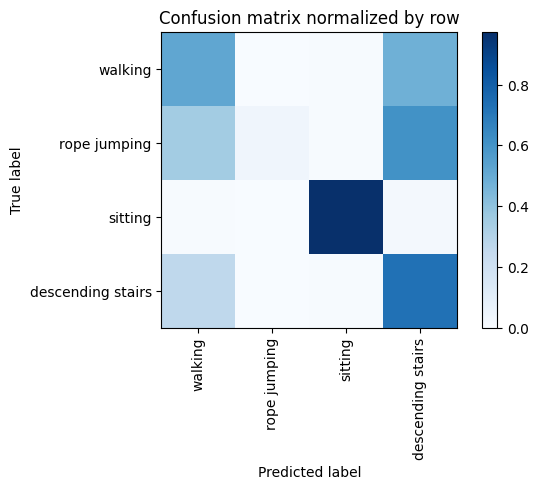

Overall accuracy: 0.662

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.744      0.518      0.611      0.422       2323|	 descending stairs: 0.478,	sitting: 0.004,	
          sitting       0.989      0.974      0.981      0.324       1784|	 descending stairs: 0.022,	walking: 0.004,	
descending stairs       0.325      0.729      0.450      0.171        941|	 walking: 0.264,	sitting: 0.007,	
     rope jumping       1.000      0.039      0.076      0.083        456|	 descending stairs: 0.605,	walking: 0.349,	

----------------------------------------------------------------------------------------------------
      avg / total       0.773      0.662      0.659        1.0       5504|	      

{'accuracy': 0.6620639534883721, 'precision': 0.7642729848353342, 'recall': 0.565001228095945, 'f1': 0.5292685976942286}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.30batch/s]


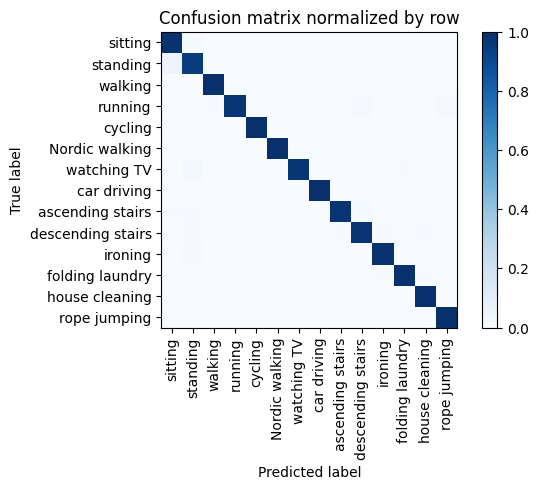

Overall accuracy: 0.987




unseen: 100%|██████████| 111/111 [00:08<00:00, 13.59batch/s]


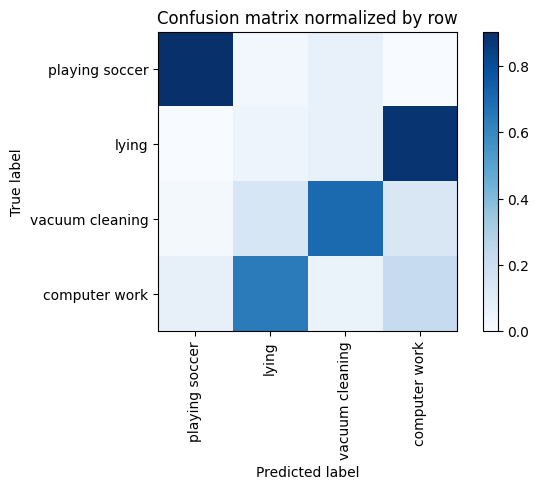

Overall accuracy: 0.335

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.268      0.225      0.245      0.432       3070|	 lying: 0.642,	playing soccer: 0.073,	
          lying       0.035      0.043      0.038      0.264       1874|	 computer work: 0.885,	vacuum cleaning: 0.069,	
vacuum cleaning       0.776      0.702      0.737      0.240       1704|	 lying: 0.146,	computer work: 0.135,	
 playing soccer       0.615      0.904      0.732      0.064        456|	 vacuum cleaning: 0.070,	lying: 0.026,	

----------------------------------------------------------------------------------------------------
    avg / total       0.351      0.335      0.340        1.0       7104|	      

{'accuracy': 0.3350225225225225, 'precision': 0.4234399966719961, 'recall': 0.46837082667272456, 'f1': 0.43801576627857597}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.17batch/s]


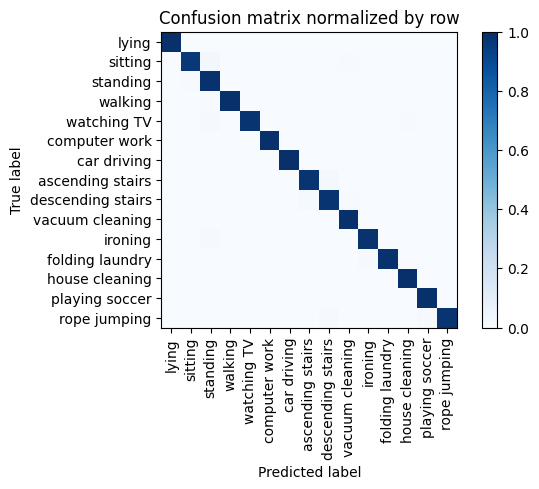

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.11batch/s]


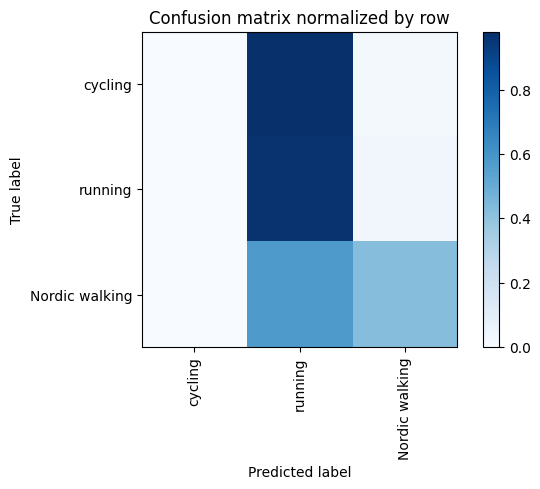

Overall accuracy: 0.386

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.925      0.422      0.580      0.419       1824|	 running: 0.578,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1590|	 running: 0.980,	Nordic walking: 0.020,	
       running       0.258      0.968      0.407      0.216        938|	 Nordic walking: 0.032,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.443      0.386      0.331        1.0       4352|	      

{'accuracy': 0.38556985294117646, 'precision': 0.39447843822843826, 'recall': 0.46338872679210463, 'f1': 0.32905894551737686}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.11batch/s]


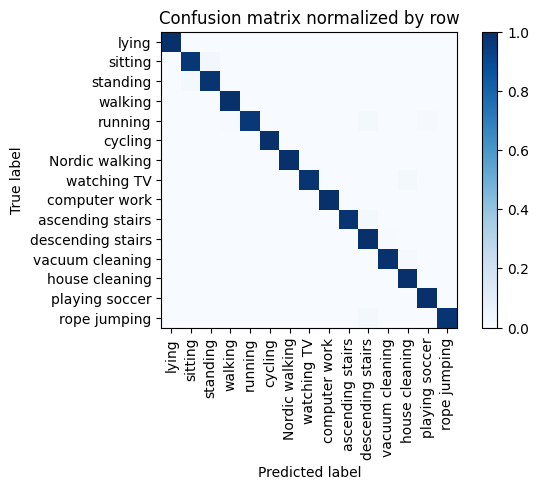

Overall accuracy: 0.991




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.11batch/s]


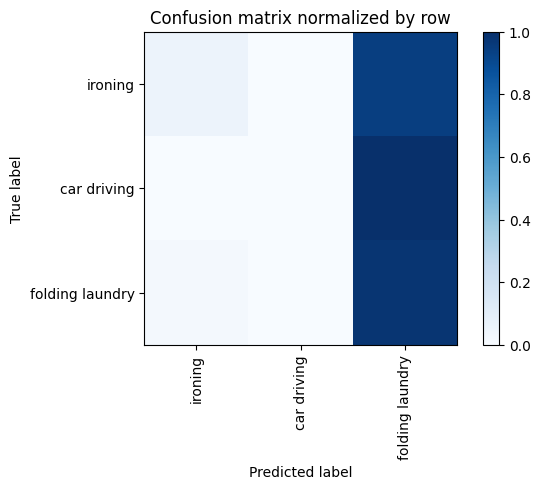

 84%|████████▍ | 16/19 [42:50<08:08, 162.98s/it]

Overall accuracy: 0.282

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.872      0.056      0.105      0.607       2331|	 folding laundry: 0.944,	car driving: 0.000,	
folding laundry       0.258      0.980      0.408      0.253        971|	 ironing: 0.020,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.595      0.282      0.167        1.0       3840|	      

{'accuracy': 0.28177083333333336, 'precision': 0.3768026343781991, 'recall': 0.3454008665131219, 'f1': 0.1710823726952759}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.10batch/s]


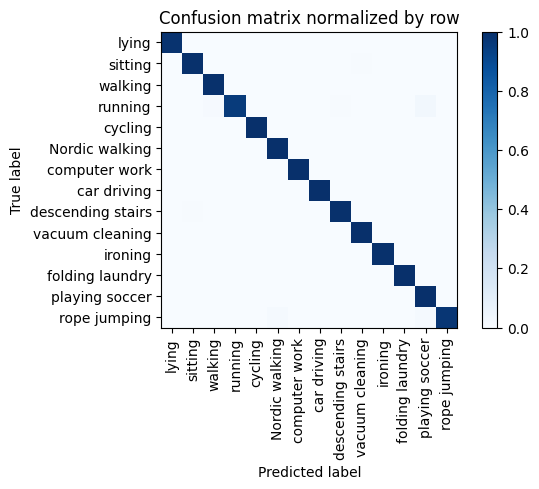

Overall accuracy: 0.994




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.48batch/s]


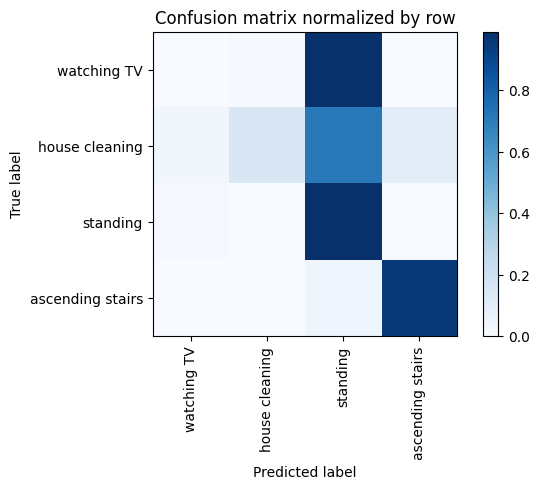

Overall accuracy: 0.558

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.455      0.985      0.622      0.330       1838|	 watching TV: 0.010,	ascending stairs: 0.004,	
  house cleaning       0.945      0.150      0.260      0.329       1834|	 standing: 0.714,	ascending stairs: 0.101,	
ascending stairs       0.841      0.949      0.891      0.193       1073|	 standing: 0.044,	house cleaning: 0.007,	
     watching TV       0.000      0.000      0.000      0.148        823|	 standing: 0.990,	house cleaning: 0.010,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.623      0.558      0.463        1.0       5568|	      

{'accuracy': 0.5576508620689655, 'precision': 0.5601288650412205, 'recall': 0.5211356739080732, 'f1': 0.44332273562556695}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runn

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.10batch/s]


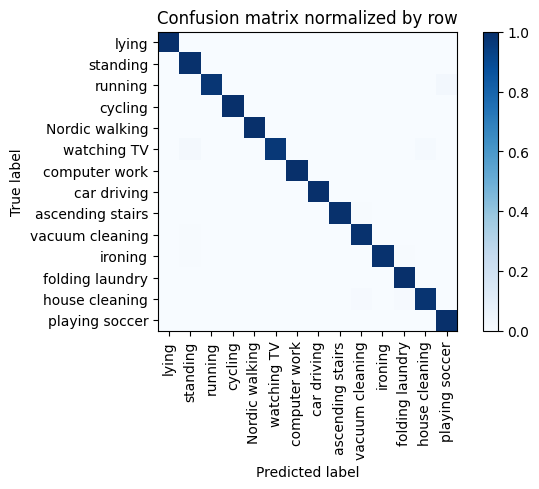

Overall accuracy: 0.993




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.12batch/s]


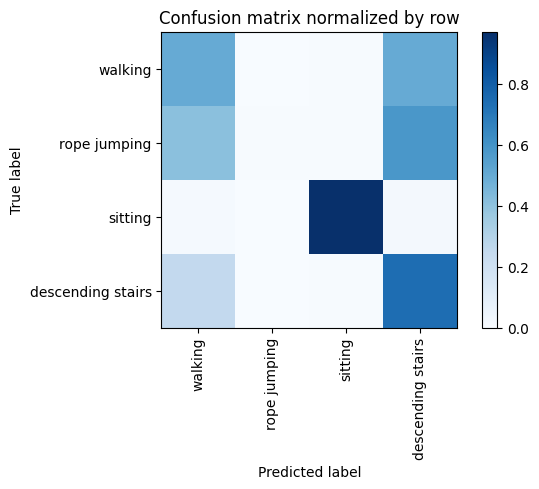

Overall accuracy: 0.653

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.723      0.498      0.590      0.421       2319|	 descending stairs: 0.498,	sitting: 0.004,	
          sitting       0.989      0.970      0.980      0.325       1789|	 descending stairs: 0.017,	walking: 0.012,	
descending stairs       0.326      0.742      0.453      0.172        945|	 walking: 0.251,	sitting: 0.007,	
     rope jumping       1.000      0.007      0.013      0.082        451|	 descending stairs: 0.581,	walking: 0.406,	sitting: 0.007,	

----------------------------------------------------------------------------------------------------
      avg / total       0.764      0.653      0.646        1.0       5504|	      

{'accuracy': 0.6529796511627907, 'precision': 0.7595694862279929, 'recall': 0.5541134063636868, 'f1': 0.5088539954683949}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cyc

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.01batch/s]


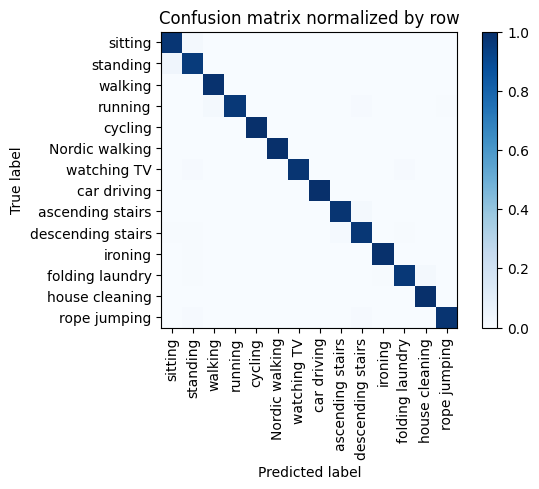

Overall accuracy: 0.984




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.08batch/s]


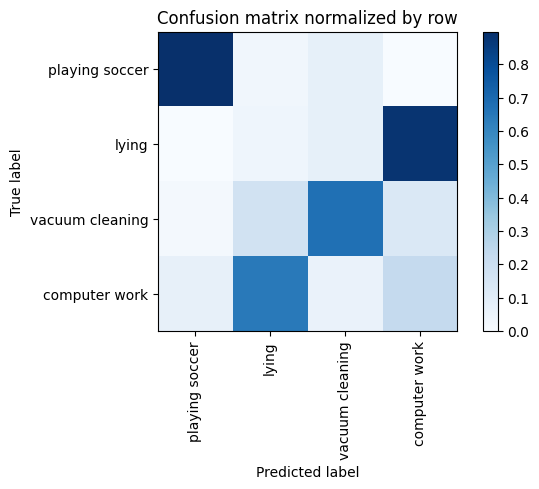

Overall accuracy: 0.328

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.269      0.226      0.245      0.431       3063|	 lying: 0.644,	playing soccer: 0.072,	
          lying       0.033      0.041      0.036      0.264       1878|	 computer work: 0.882,	vacuum cleaning: 0.075,	
vacuum cleaning       0.766      0.676      0.718      0.240       1705|	 lying: 0.174,	computer work: 0.131,	
 playing soccer       0.613      0.897      0.728      0.064        458|	 vacuum cleaning: 0.074,	lying: 0.028,	

----------------------------------------------------------------------------------------------------
    avg / total       0.348      0.328      0.335        1.0       7104|	      

{'accuracy': 0.32826576576576577, 'precision': 0.42003949331255475, 'recall': 0.46005578325694163, 'f1': 0.4320382550674161}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.10batch/s]


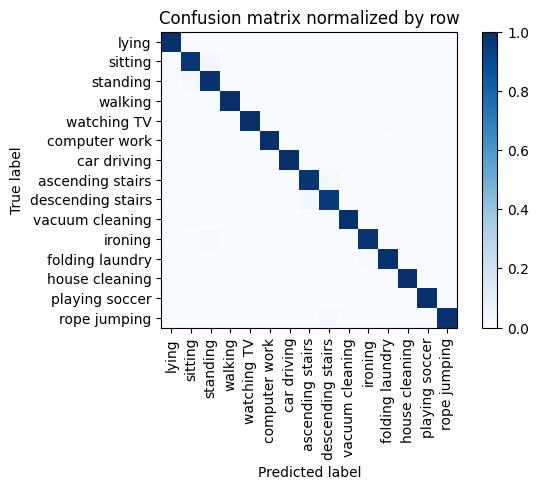

Overall accuracy: 0.989




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.04batch/s]


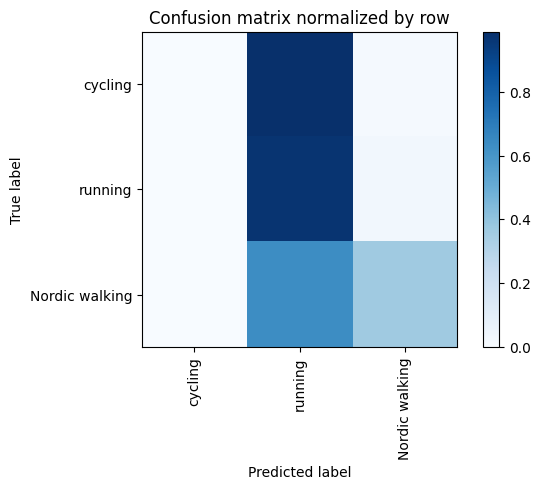

Overall accuracy: 0.361

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.934      0.364      0.524      0.420       1827|	 running: 0.636,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1590|	 running: 0.988,	Nordic walking: 0.012,	
       running       0.249      0.970      0.397      0.215        935|	 Nordic walking: 0.030,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.446      0.361      0.305        1.0       4352|	      

{'accuracy': 0.36121323529411764, 'precision': 0.3943881960735893, 'recall': 0.444679383421777, 'f1': 0.3067770036967927}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.37batch/s]


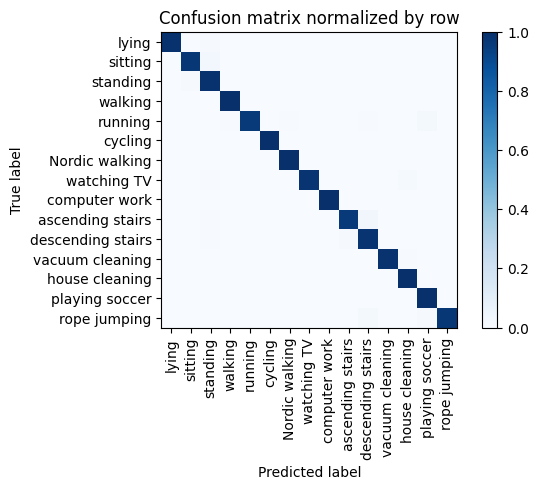

Overall accuracy: 0.989




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.34batch/s]


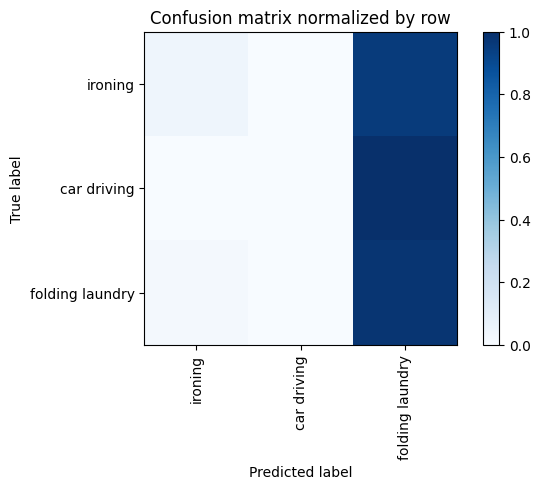

 89%|████████▉ | 17/19 [45:34<05:26, 163.26s/it]

Overall accuracy: 0.275

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.839      0.045      0.085      0.607       2330|	 folding laundry: 0.955,	car driving: 0.000,	
folding laundry       0.256      0.979      0.406      0.253        972|	 ironing: 0.021,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.574      0.275      0.154        1.0       3840|	      

{'accuracy': 0.275, 'precision': 0.3649663761473199, 'recall': 0.34135302048193483, 'f1': 0.1636343069706722}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, '

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.63batch/s]


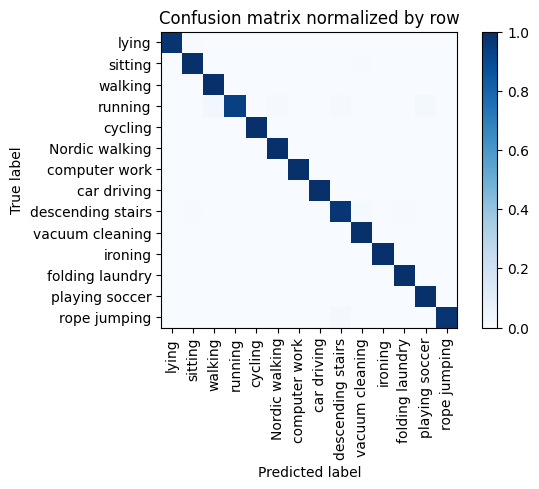

Overall accuracy: 0.992




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.08batch/s]


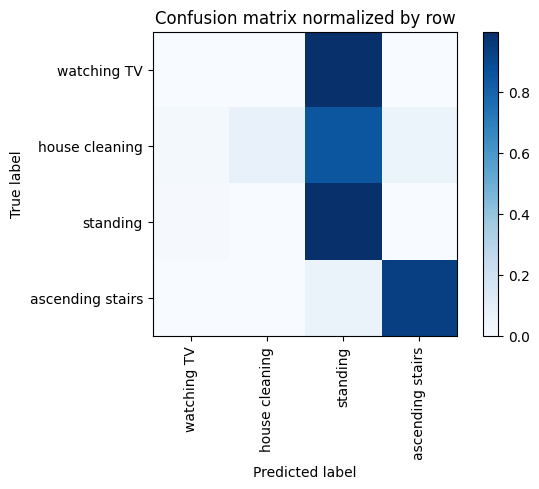

Overall accuracy: 0.531

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.427      0.991      0.597      0.331       1841|	 watching TV: 0.009,	ascending stairs: 0.001,	
  house cleaning       0.963      0.071      0.132      0.329       1830|	 standing: 0.851,	ascending stairs: 0.061,	
ascending stairs       0.900      0.936      0.917      0.193       1072|	 standing: 0.062,	house cleaning: 0.002,	
     watching TV       0.000      0.000      0.000      0.148        825|	 standing: 0.996,	house cleaning: 0.004,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.631      0.531      0.417        1.0       5568|	      

{'accuracy': 0.5310704022988506, 'precision': 0.5724202022040734, 'recall': 0.4993596169571551, 'f1': 0.4116275139513036}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.23batch/s]


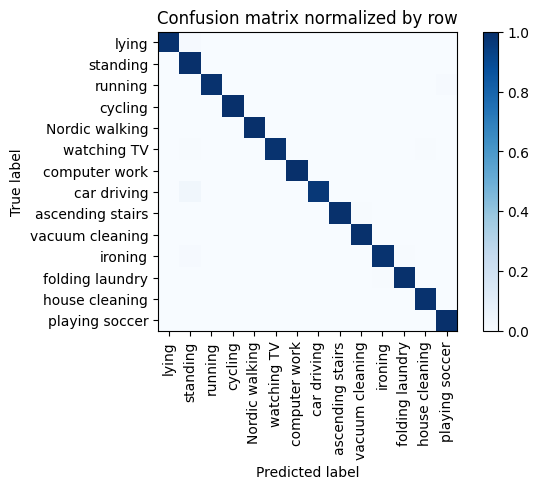

Overall accuracy: 0.994




unseen: 100%|██████████| 86/86 [00:06<00:00, 14.09batch/s]


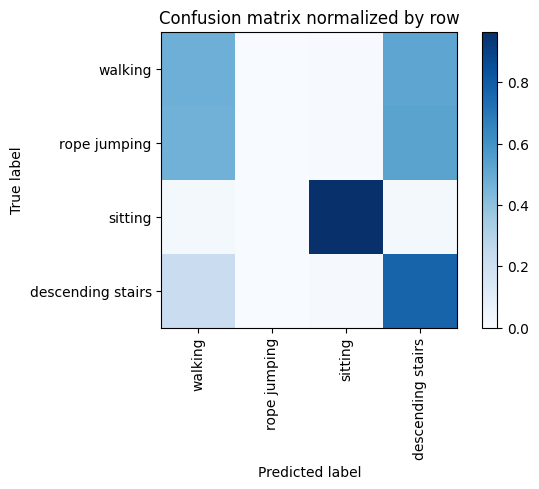

Overall accuracy: 0.646

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.709      0.477      0.570      0.422       2321|	 descending stairs: 0.520,	sitting: 0.004,	
          sitting       0.989      0.965      0.977      0.324       1784|	 walking: 0.018,	descending stairs: 0.016,	
descending stairs       0.330      0.771      0.462      0.171        943|	 walking: 0.221,	sitting: 0.008,	
     rope jumping       0.000      0.000      0.000      0.083        456|	 descending stairs: 0.529,	walking: 0.467,	sitting: 0.004,	

----------------------------------------------------------------------------------------------------
      avg / total       0.676      0.646      0.636        1.0       5504|	      

{'accuracy': 0.6458938953488372, 'precision': 0.5070164075005881, 'recall': 0.5531772937718429, 'f1': 0.5022879157247854}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cyc

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.55batch/s]


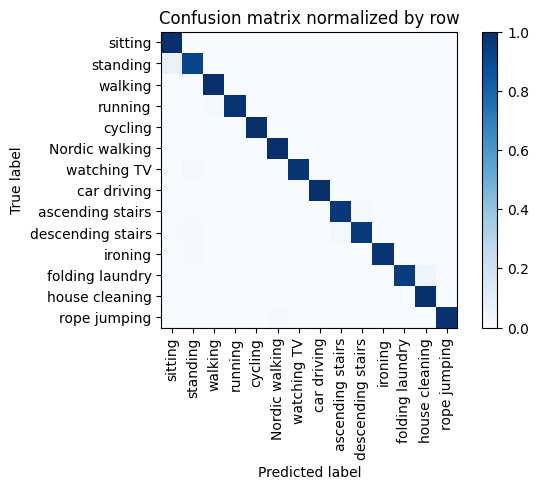

Overall accuracy: 0.981




unseen: 100%|██████████| 111/111 [00:07<00:00, 13.96batch/s]


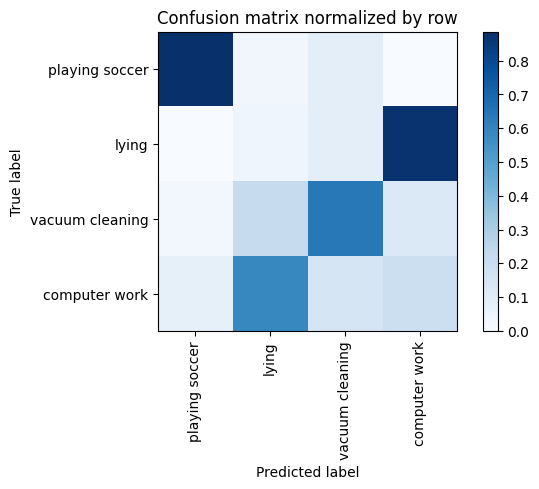

Overall accuracy: 0.304

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.243      0.193      0.215      0.432       3068|	 lying: 0.585,	vacuum cleaning: 0.149,	
          lying       0.033      0.040      0.036      0.264       1875|	 computer work: 0.872,	vacuum cleaning: 0.086,	
vacuum cleaning       0.624      0.639      0.631      0.240       1707|	 lying: 0.216,	computer work: 0.122,	
 playing soccer       0.597      0.885      0.713      0.064        454|	 vacuum cleaning: 0.084,	lying: 0.031,	

----------------------------------------------------------------------------------------------------
    avg / total       0.302      0.304      0.300        1.0       7104|	      

{'accuracy': 0.3037725225225225, 'precision': 0.37443455014993166, 'recall': 0.43916083784325655, 'f1': 0.39897981685538675}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:04<00:00, 14.37batch/s]


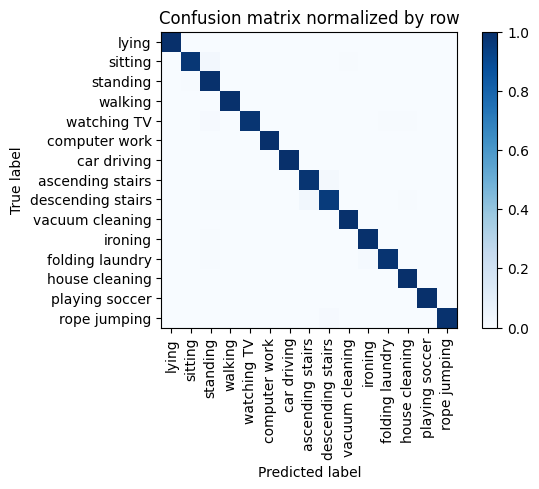

Overall accuracy: 0.990




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.31batch/s]


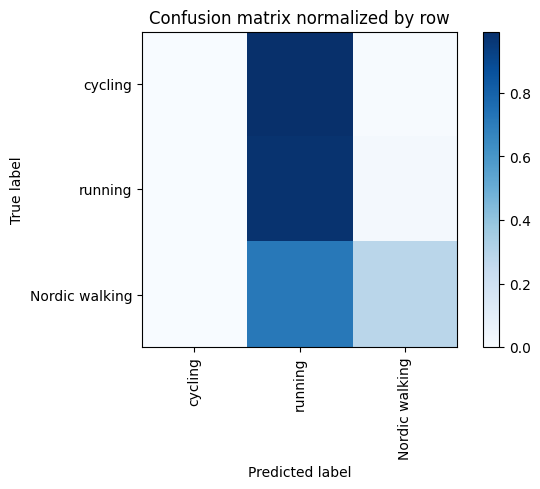

Overall accuracy: 0.331

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.942      0.285      0.438      0.420       1827|	 running: 0.715,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1585|	 running: 0.992,	Nordic walking: 0.008,	
       running       0.242      0.979      0.388      0.216        940|	 Nordic walking: 0.021,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.448      0.331      0.268        1.0       4352|	      

{'accuracy': 0.3311121323529412, 'precision': 0.39476760246383163, 'recall': 0.42129678153155775, 'f1': 0.275360897682559}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:04<00:00, 14.00batch/s]


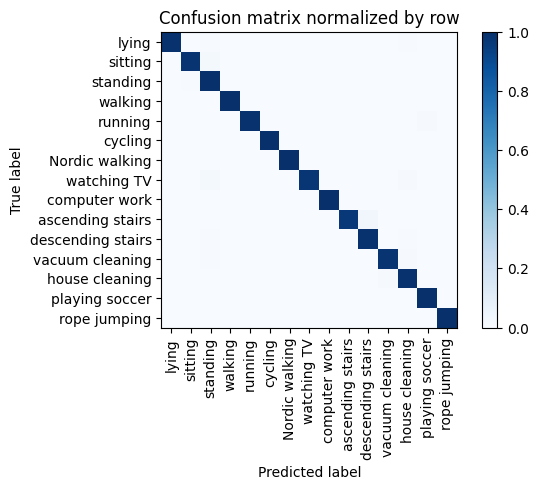

Overall accuracy: 0.990




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.02batch/s]


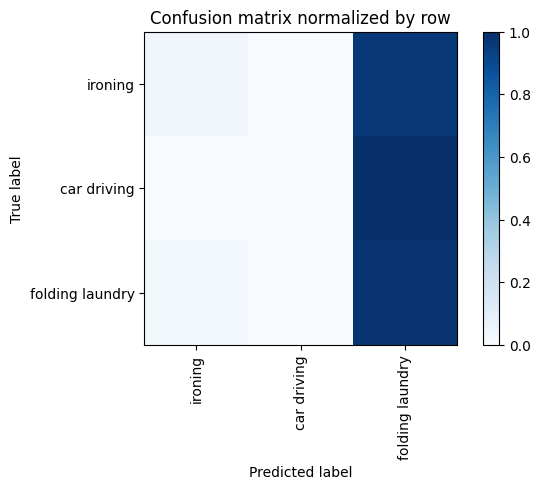

 95%|█████████▍| 18/19 [48:18<02:43, 163.57s/it]

Overall accuracy: 0.268

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.800      0.033      0.063      0.607       2330|	 folding laundry: 0.967,	car driving: 0.000,	
folding laundry       0.254      0.980      0.404      0.253        972|	 ironing: 0.020,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.550      0.268      0.140        1.0       3840|	      

{'accuracy': 0.26796875, 'precision': 0.35149087672452156, 'recall': 0.3376902335493974, 'f1': 0.15558359869653304}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.23batch/s]


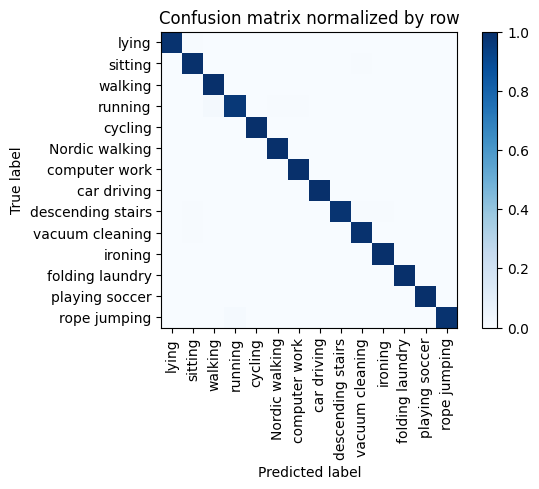

Overall accuracy: 0.994




unseen: 100%|██████████| 87/87 [00:06<00:00, 14.12batch/s]


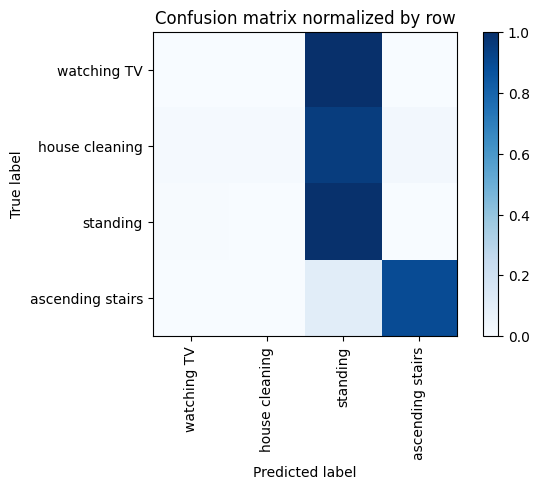

Overall accuracy: 0.505

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.406      0.994      0.577      0.331       1841|	 watching TV: 0.006,	ascending stairs: 0.000,	
  house cleaning       1.000      0.015      0.030      0.329       1832|	 standing: 0.948,	ascending stairs: 0.025,	
ascending stairs       0.954      0.892      0.922      0.192       1071|	 standing: 0.108,	house cleaning: 0.000,	
     watching TV       0.000      0.000      0.000      0.148        824|	 standing: 1.000,	ascending stairs: 0.000,	house cleaning: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.647      0.505      0.378        1.0       5568|	      

{'accuracy': 0.5052083333333334, 'precision': 0.5900427801226735, 'recall': 0.4752497096380629, 'f1': 0.3821431461763827}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'runni

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:04<00:00, 14.20batch/s]


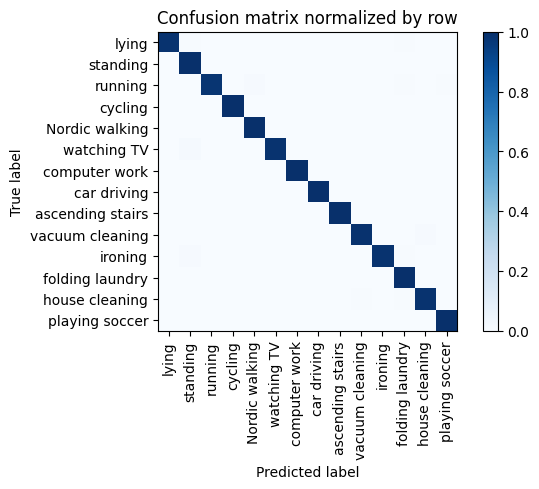

Overall accuracy: 0.993




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.95batch/s]


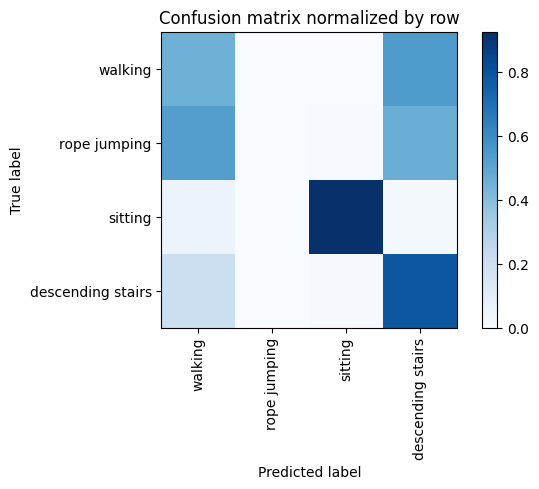

Overall accuracy: 0.628

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.668      0.454      0.541      0.421       2318|	 descending stairs: 0.543,	sitting: 0.003,	
          sitting       0.989      0.927      0.957      0.326       1792|	 walking: 0.052,	descending stairs: 0.020,	
descending stairs       0.329      0.789      0.465      0.170        938|	 walking: 0.200,	sitting: 0.011,	
     rope jumping       0.000      0.000      0.000      0.083        456|	 walking: 0.529,	descending stairs: 0.467,	sitting: 0.004,	

----------------------------------------------------------------------------------------------------
      avg / total       0.660      0.628      0.619        1.0       5504|	      

{'accuracy': 0.6277252906976745, 'precision': 0.4966536042673658, 'recall': 0.5426597150774691, 'f1': 0.49068441253378375}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cy

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 60/60 [00:04<00:00, 14.16batch/s]


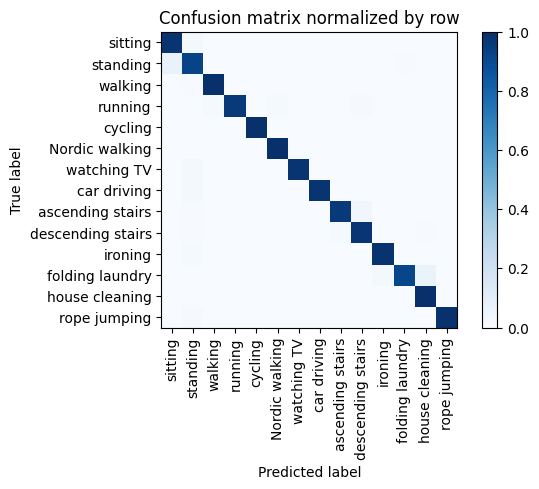

Overall accuracy: 0.977




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.01batch/s]


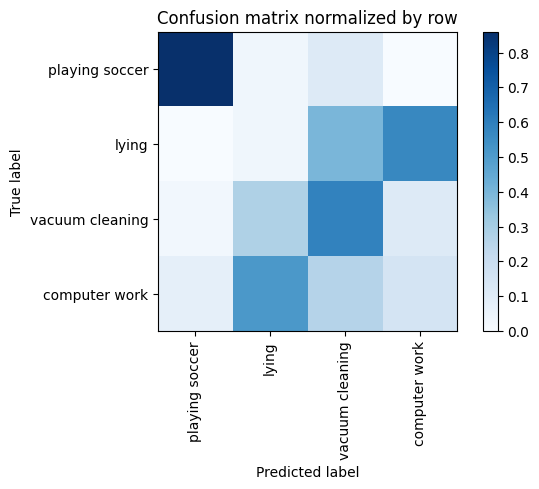

Overall accuracy: 0.270

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.271      0.152      0.195      0.432       3069|	 lying: 0.514,	vacuum cleaning: 0.260,	
          lying       0.027      0.031      0.029      0.264       1875|	 computer work: 0.571,	vacuum cleaning: 0.396,	
vacuum cleaning       0.386      0.587      0.466      0.240       1704|	 lying: 0.276,	computer work: 0.110,	
 playing soccer       0.586      0.860      0.697      0.064        456|	 vacuum cleaning: 0.110,	lying: 0.031,	

----------------------------------------------------------------------------------------------------
    avg / total       0.255      0.270      0.249        1.0       7104|	      

{'accuracy': 0.2701295045045045, 'precision': 0.31770449631892966, 'recall': 0.4076291098290106, 'f1': 0.34681661599194324}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking'

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 69/69 [00:05<00:00, 13.72batch/s]


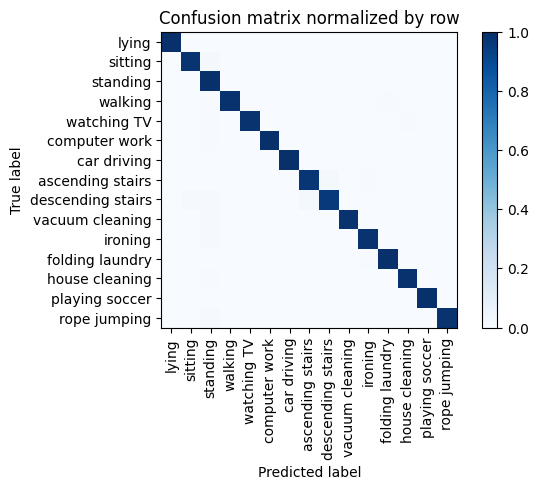

Overall accuracy: 0.988




unseen: 100%|██████████| 68/68 [00:04<00:00, 13.95batch/s]


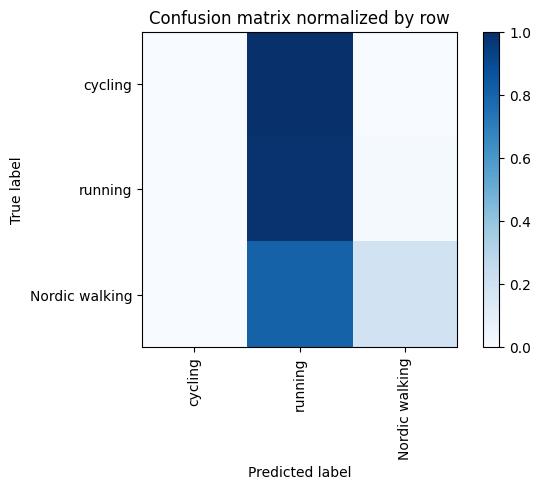

Overall accuracy: 0.293

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.962      0.194      0.323      0.419       1822|	 running: 0.806,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1592|	 running: 1.000,	Nordic walking: 0.000,	
       running       0.232      0.985      0.375      0.216        938|	 Nordic walking: 0.015,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.453      0.293      0.216        1.0       4352|	      

{'accuracy': 0.29342830882352944, 'precision': 0.397907457233472, 'recall': 0.39293925542430547, 'f1': 0.23263418824404739}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 70/70 [00:05<00:00, 13.92batch/s]


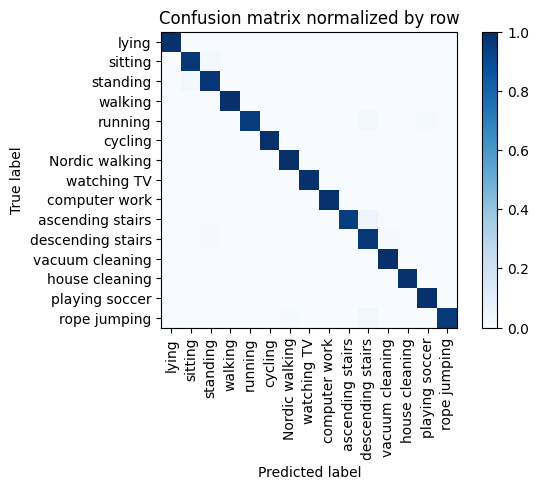

Overall accuracy: 0.985




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.86batch/s]


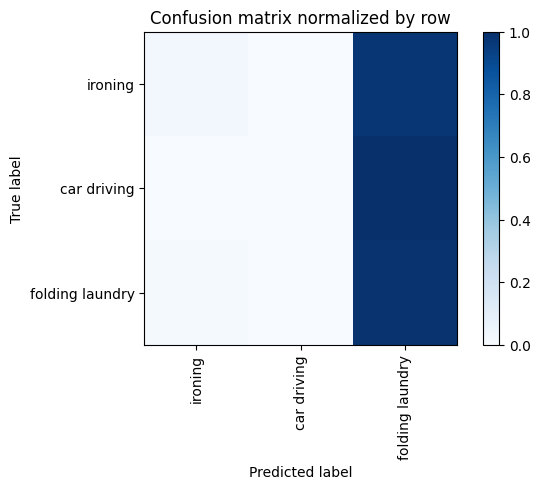

100%|██████████| 19/19 [51:04<00:00, 161.27s/it]

Overall accuracy: 0.265

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.797      0.025      0.049      0.607       2331|	 folding laundry: 0.975,	car driving: 0.000,	
folding laundry       0.255      0.985      0.405      0.254        975|	 ironing: 0.015,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.139        534|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.549      0.265      0.133        1.0       3840|	      

{'accuracy': 0.26536458333333335, 'precision': 0.35073655705625967, 'recall': 0.33664213664213666, 'f1': 0.15134743394604183}
============== Overall Unseen Classes Performance ==============


In [114]:
results_with_alpha = {}
for alp in tqdm(range(5,100,5)):
    alp = alp/100

    results_with_alpha[alp] = run_5fold(alp)

In [119]:
results_with_alpha.keys()

dict_keys([0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95])

In [120]:
complete_json = {
    "alpha":[],
    "accuracy":[],
    "precision":[],
    "recall":[],
    "f1":[]
}
for k,v in results_with_alpha.items():
    complete_json["alpha"].append(k)
    complete_json["accuracy"].append(v.to_dict()["accuracy"])
    complete_json["precision"].append(v.to_dict()["precision"])
    complete_json["recall"].append(v.to_dict()["recall"])
    complete_json["f1"].append(v.to_dict()["f1"])

0.05
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
0.55
0.6
0.65
0.7
0.75
0.8
0.85
0.9
0.95


In [121]:
complete_json

{'alpha': [0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9,
  0.95],
 'accuracy': [0.4731471144817515,
  0.476714406573657,
  0.48081006850197755,
  0.4829367878244299,
  0.4838083014231505,
  0.4820944969171375,
  0.4824555985238977,
  0.48213696841683423,
  0.4800218375186828,
  0.47722001437525313,
  0.47676634063511847,
  0.47387245612310036,
  0.47113977122199796,
  0.4669242192788926,
  0.45959338999449234,
  0.449121064640989,
  0.43502190285832787,
  0.4159635405046303,
  0.392371204138475],
 'precision': [0.4691108442663146,
  0.4738710697524864,
  0.47590925680825735,
  0.4761779362904176,
  0.4766374674568139,
  0.4780338696773856,
  0.4809294892550054,
  0.4818562260150432,
  0.48552433276433077,
  0.4893019306616864,
  0.4935039562165883,
  0.4976609524457964,
  0.5017805881045971,
  0.5029203401267212,
  0.5055263239422073,
  0.5038274984940349,
  0.49981848336053547,
  0.44002592780858923

In [116]:
alpha_df = pd.DataFrame.from_dict(complete_json)

In [117]:
alpha_df

,alpha,accuracy,precision,recall,f1
0,0.05,0.473147,0.469111,0.504146,0.441881
1,0.10,0.476714,0.473871,0.506837,0.444300
2,0.15,0.480810,0.475909,0.510595,0.446636
3,0.20,0.482937,0.476178,0.512624,0.446988
4,0.25,0.483808,0.476637,0.513562,0.446748
5,0.30,0.482094,0.478034,0.511930,0.444557
6,0.35,0.482456,0.480929,0.511053,0.443671
7,0.40,0.482137,0.481856,0.508810,0.440098
8,0.45,0.480022,0.485524,0.505400,0.435168
9,0.50,0.477220,0.489302,0.502877,0.431041


In [118]:
alpha_df.to_csv("alpha_analysis.csv",index=False)

<AxesSubplot: xlabel='alpha', ylabel='accuracy'>

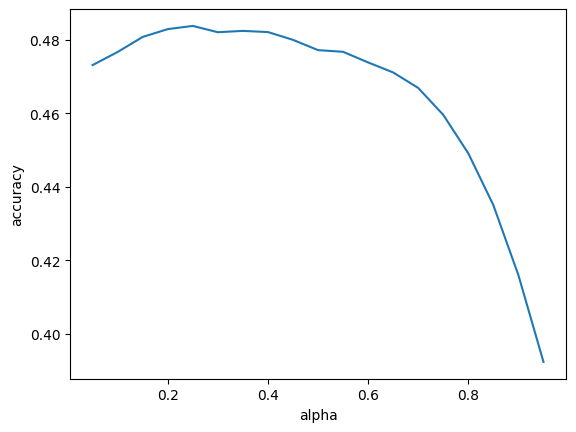

In [122]:
import seaborn as sns

sns.lineplot(data=alpha_df,x="alpha",y="accuracy")

<AxesSubplot: xlabel='alpha', ylabel='f1'>

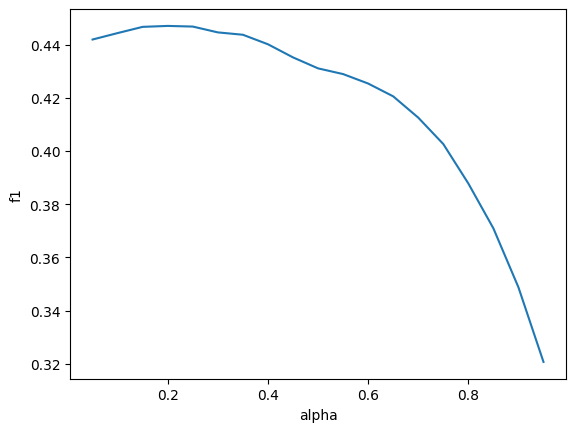

In [123]:
sns.lineplot(data=alpha_df,x="alpha",y="f1")